# IEEE Fraud Detection Kaggle Competition

features from: https://www.kaggle.com/roydatascience/light-gbm-with-complete-eda/notebook#Feature-Engineering

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import lightgbm as lgb
from sklearn.metrics import roc_auc_score
from sklearn.tree import DecisionTreeClassifier, plot_tree

/Users/cchadha2/anaconda3/envs/eda/lib/python3.7/site-packages/lightgbm/__init__.py:46: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_9.4.1) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [3]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

num_folds = 5
SEED = 5000

In [4]:
import random, os
def seed_everything(seed=SEED):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
seed_everything()

In [5]:
train = pd.read_csv('../../output/train_reduced_mem.csv')
test = pd.read_csv('../../output/test_reduced_mem.csv')

In [6]:
important_features = [features.rstrip('\n') for features in open('../../output/important_features_from_RFE.txt')]

In [7]:
features_to_drop = [feature for feature in list(train) if feature not in important_features]

# Feature Engineering

In [8]:
one_value_cols = [col for col in train.columns if train[col].nunique() <= 1]
one_value_cols_test = [col for col in test.columns if test[col].nunique() <= 1]

many_null_cols = [col for col in train.columns if train[col].isnull().sum() / train.shape[0] > 0.9]
many_null_cols_test = [col for col in test.columns if test[col].isnull().sum() / test.shape[0] > 0.9]

big_top_value_cols = [col for col in train.columns if train[col].value_counts(dropna=False, normalize=True).values[0] > 0.9]
big_top_value_cols_test = [col for col in test.columns if test[col].value_counts(dropna=False, normalize=True).values[0] > 0.9]

cols_to_drop = list(set(many_null_cols + many_null_cols_test + big_top_value_cols + big_top_value_cols_test + one_value_cols + one_value_cols_test))
cols_to_drop.remove('isFraud')
print('{} features are going to be dropped for being useless'.format(len(cols_to_drop)))

train = train.drop(cols_to_drop, axis=1)
test = test.drop(cols_to_drop, axis=1)

82 features are going to be dropped for being useless


In [9]:
train.head()

,TransactionID,isFraud,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V15,V16,V17,V18,V19,V20,V21,V22,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V56,V57,V58,V59,V60,V61,V62,V63,V64,V69,V70,V71,V72,V73,V74,V75,V76,V78,V79,V80,V81,V82,V83,V84,V85,V87,V90,V91,V92,V93,V94,V95,V96,V97,V99,V100,V126,V127,V128,V130,V131,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V282,V283,V285,V287,V288,V289,V291,V292,V294,V302,V303,V304,V306,V307,V308,V310,V312,V313,V314,V315,V317,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,2987000,0,86400,68.5,W,13926,NaN,150.0,discover,142.0,credit,315.0,87.0,19.0,NaN,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,14.0,NaN,13.0,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN,NaN,0.0,T,T,T,M2,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,117.0,0.0,0.0,0.0,0.0,0.0,0.0,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2987001,0,86401,29.0,W,2755,404.0,150.0,mastercard,102.0,credit,325.0,87.0,NaN,gmail.com,NaN,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,M0,T,T,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [10]:
test.head()

,TransactionID,TransactionDT,TransactionAmt,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,P_emaildomain,R_emaildomain,C1,C2,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V15,V16,V17,V18,V19,V20,V21,V22,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V56,V57,V58,V59,V60,V61,V62,V63,V64,V69,V70,V71,V72,V73,V74,V75,V76,V78,V79,V80,V81,V82,V83,V84,V85,V87,V90,V91,V92,V93,V94,V95,V96,V97,V99,V100,V126,V127,V128,V130,V131,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V282,V283,V285,V287,V288,V289,V291,V292,V294,V302,V303,V304,V306,V307,V308,V310,V312,V313,V314,V315,V317,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_19,id_20,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo
0,3663549,18403224,31.95,W,10409,111.0,150.0,visa,226.0,debit,170.0,87.0,1.0,gmail.com,NaN,6.0,6.0,0.0,3.0,4.0,0.0,0.0,6.0,0.0,5.0,1.0,115.0,6.0,419.0,419.0,27.0,398.0,27.0,NaN,NaN,NaN,418.0,203.0,NaN,NaN,NaN,409.0,T,T,F,NaN,NaN,F,T,T,T,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.00,47.95,0.00,47.95,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.00,47.95,0.00,47.95,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3663550,18403263,49.00,W,4272,111.0,150.0,visa,226.0,debit,299.0,87.0,4.0,aol.com,NaN,3.0,2.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,1.0,12.0,2.0,149.0,149.0,7.0,634.0,7.0,NaN,NaN,NaN,231.0,634.0,NaN,NaN,NaN,634.0,T,F,F,M0,NaN,F,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,4.0,1.0,0.00,280.00,77.00,280.00,77.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [11]:
valid_card = train['card1'].value_counts()
valid_card = valid_card[valid_card>10]
valid_card = list(valid_card.index)

train['card1'] = np.where(train['card1'].isin(valid_card), train['card1'], np.nan)
test['card1'] = np.where(test['card1'].isin(valid_card), test['card1'], np.nan)

In [12]:
i_cols = ['card1','card2','card3','card5',
          'C1','C2','C4','C5','C6','C7','C8','C9','C10','C11','C12','C13','C14',
          'D1','D2','D3','D4','D5','D6','D8','D9',
          'addr1','addr2',
          'dist1',
          'P_emaildomain', 'R_emaildomain']

for col in i_cols:
    temp_df = pd.concat([train[[col]], test[[col]]])
    fq_encode = temp_df[col].value_counts().to_dict()   
    
    train[col+'_fq_enc'] = train[col].map(fq_encode)
    test[col+'_fq_enc'] = test[col].map(fq_encode)

In [13]:
for col in ['ProductCD','M4']:
    temp_dict = train.groupby([col])['isFraud'].agg(['mean']).reset_index().rename(
                                                        columns={'mean': col+'_target_mean'})
    temp_dict.index = temp_dict[col].values
    temp_dict = temp_dict[col+'_target_mean'].to_dict()
    
    train[col+'_target_mean'] = train[col].map(temp_dict)
    test[col+'_target_mean'] = test[col].map(temp_dict)

In [14]:
from sklearn.preprocessing import LabelEncoder

for col in list(train):
    if train[col].dtype=='O':
        print(col)
        train[col] = train[col].fillna('unseen_before_label')
        test[col]  = test[col].fillna('unseen_before_label')
        
        train[col] = train[col].astype(str)
        test[col] = test[col].astype(str)
        
        le = LabelEncoder()
        le.fit(list(train[col])+list(test[col]))
        train[col] = le.transform(train[col])
        test[col] = le.transform(test[col])

ProductCD
card4
card6
P_emaildomain
R_emaildomain
M1
M2
M3
M4
M5
M6
M7
M8
M9
id_12
id_15
id_16
id_28
id_29
id_30
id_31
id_33
id_34
id_35
id_36
id_37
id_38
DeviceType
DeviceInfo


In [15]:
i_cols = ['card1','card2','card3','card5']

for col in i_cols:
    for agg_type in ['mean', 'std']:
        new_col_name = col+'_TransactionAmt_'+agg_type
        temp_df = pd.concat([train[[col, 'TransactionAmt']], test[[col,'TransactionAmt']]])
        temp_df = temp_df.groupby([col])['TransactionAmt'].agg([agg_type]).reset_index().rename(
                                                columns={agg_type: new_col_name})
        
        temp_df.index = list(temp_df[col])
        temp_df = temp_df[new_col_name].to_dict()   
        
        train[new_col_name] = train[col].map(temp_df)
        test[new_col_name] = test[col].map(temp_df)

In [16]:
train['card_TransactionAmt_ave']=train[['card1_TransactionAmt_mean', 'card2_TransactionAmt_mean',
                                             'card3_TransactionAmt_mean', 'card5_TransactionAmt_mean']].mean(axis=1)
test['card_TransactionAmt_ave']=test[['card1_TransactionAmt_mean', 'card2_TransactionAmt_mean',
                                             'card3_TransactionAmt_mean', 'card5_TransactionAmt_mean']].mean(axis=1)

# Remove features with dissimilar distributions between train and test

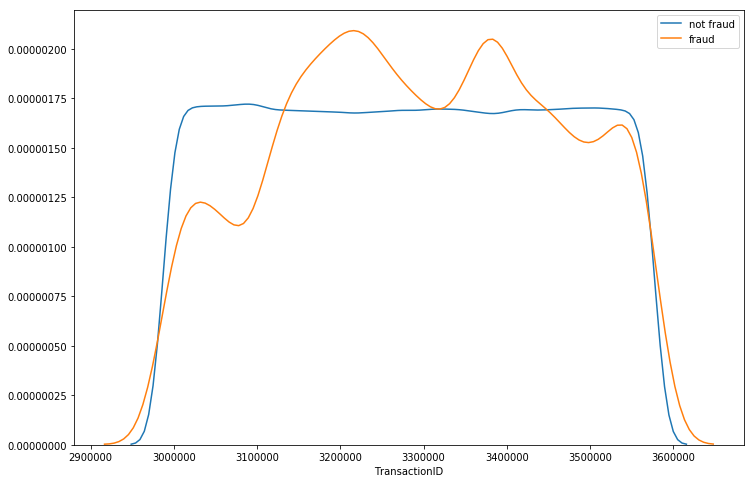

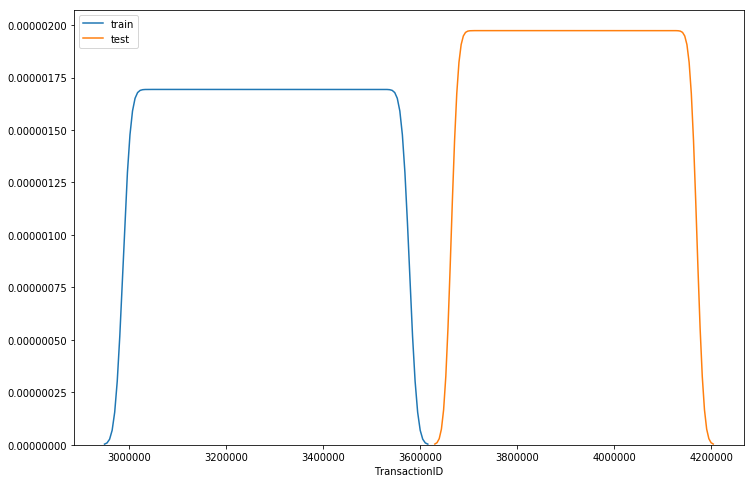

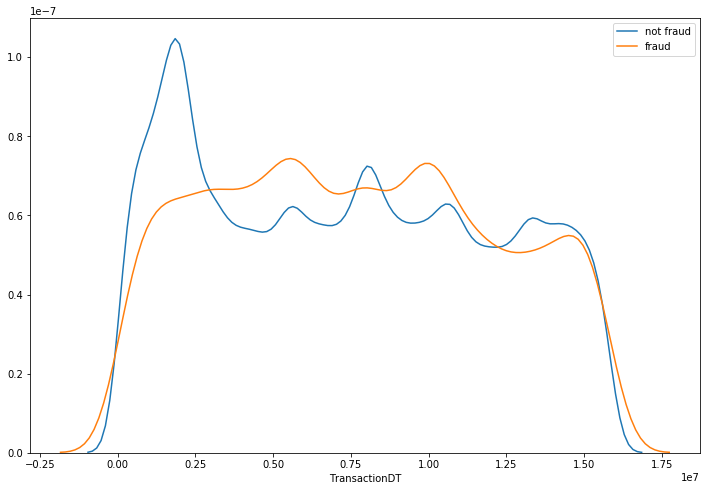

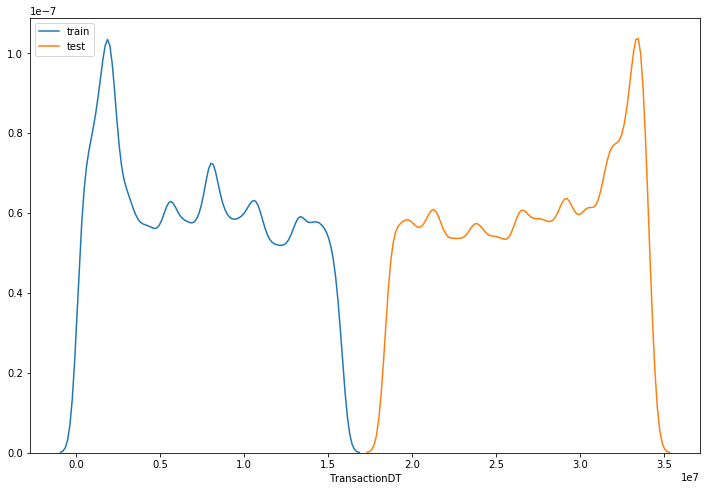

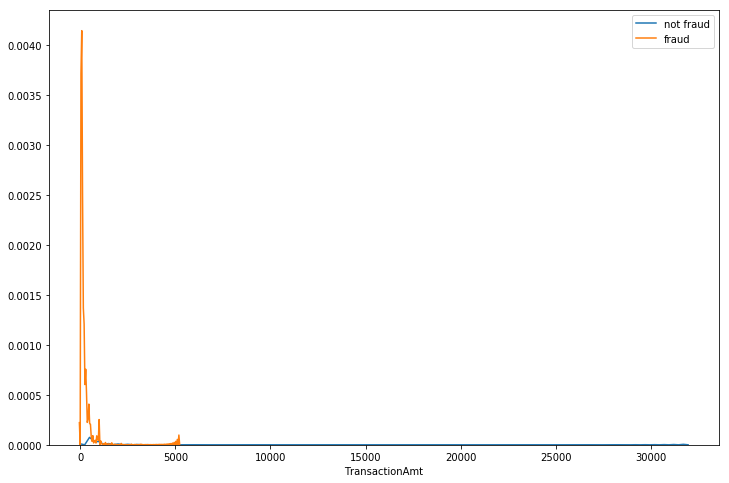

...

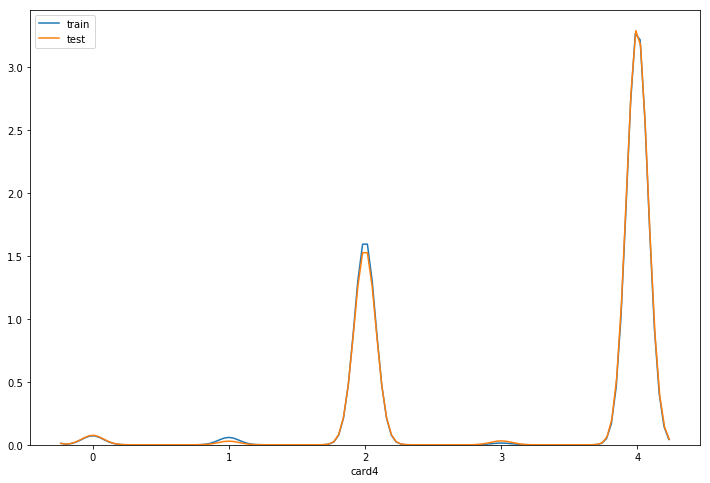

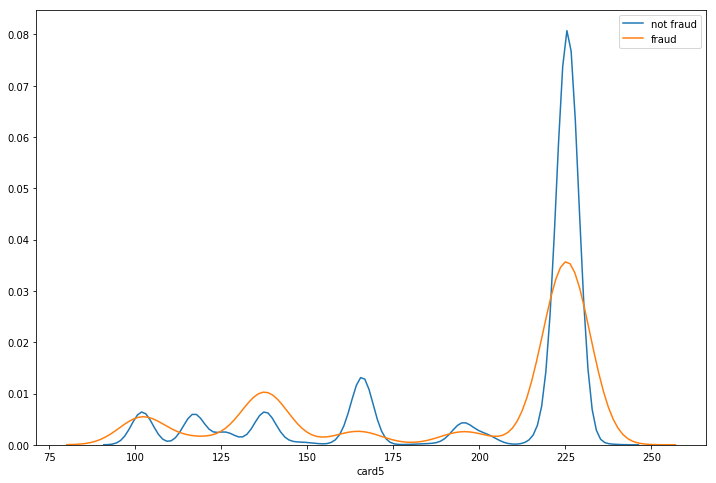

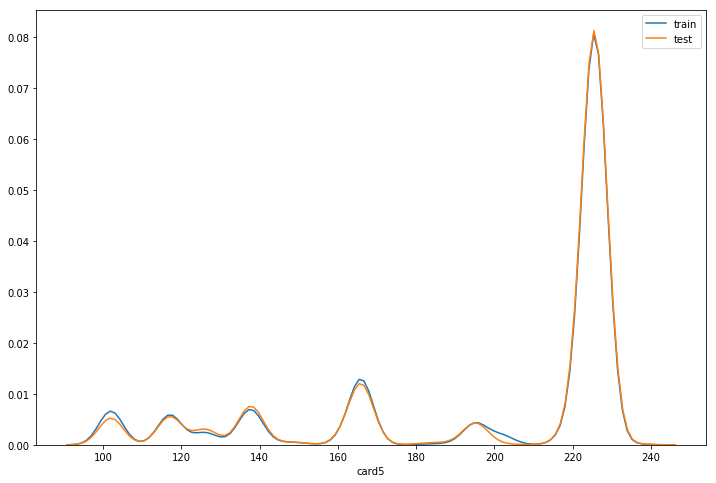

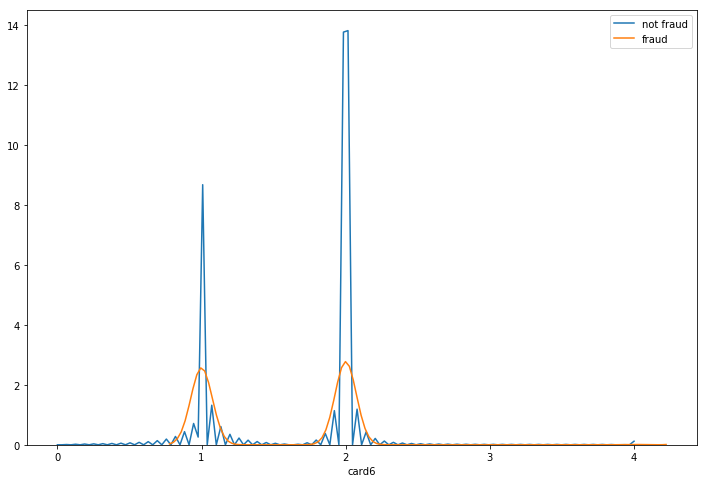

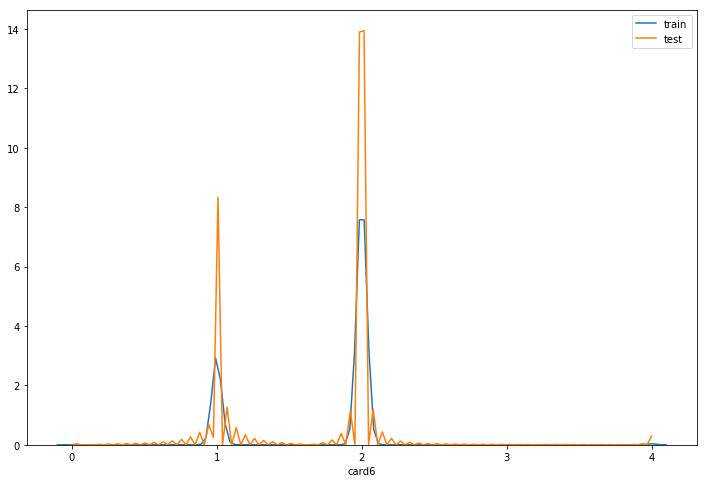

In [18]:
for feature in list(test)[:10]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

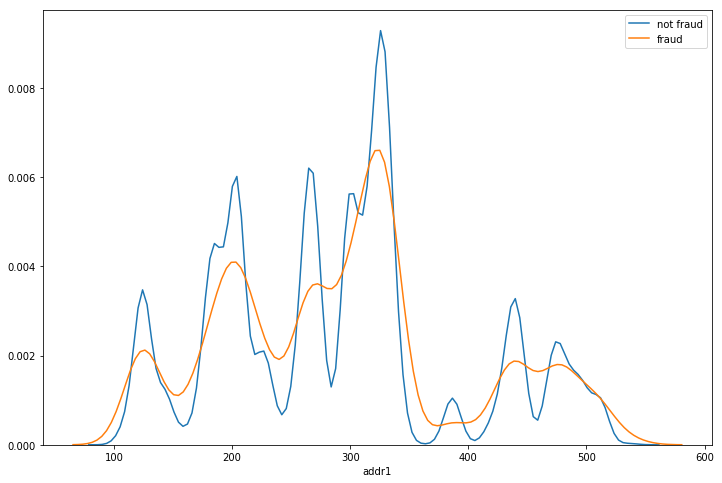

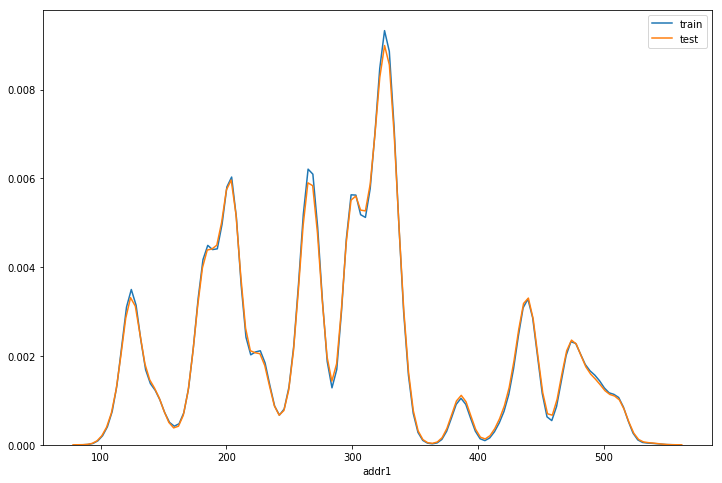

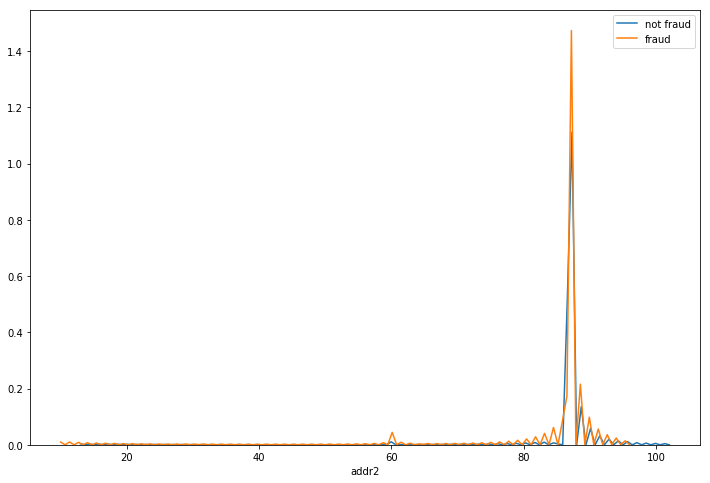

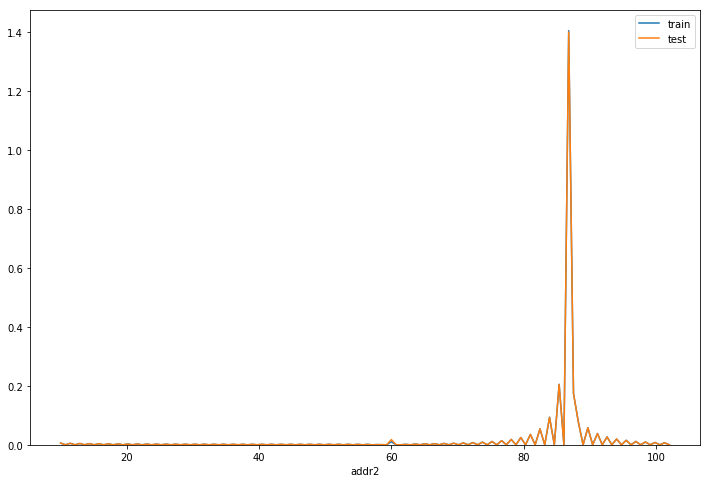

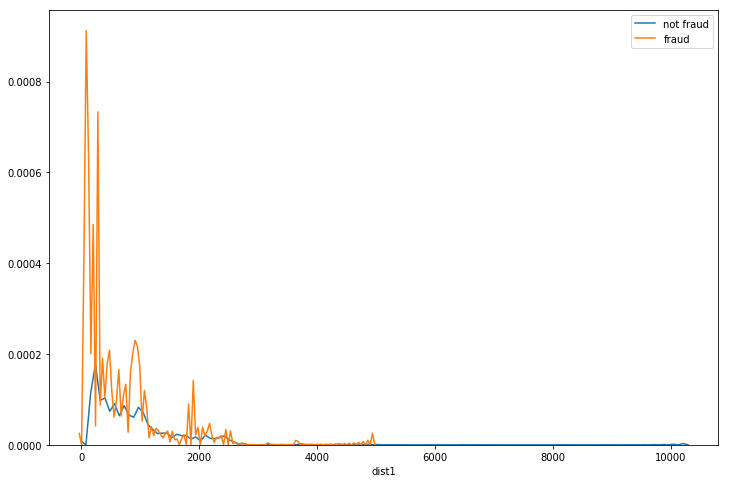

...

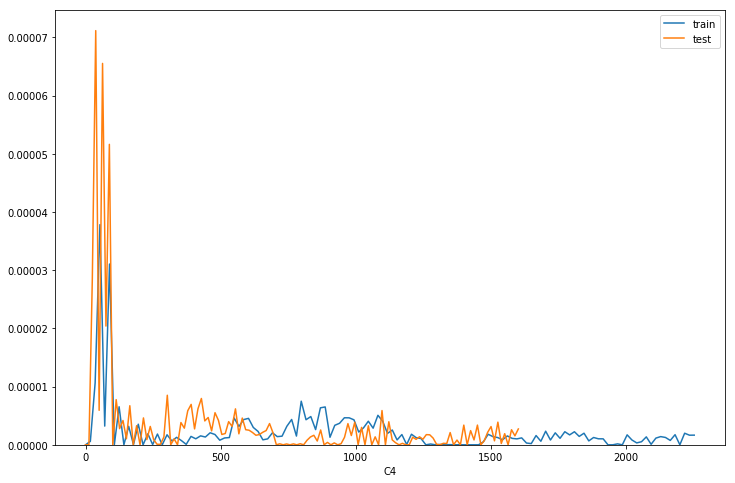

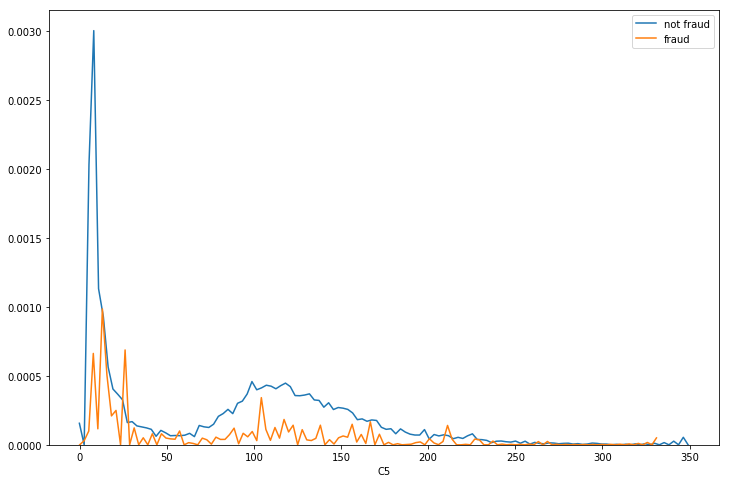

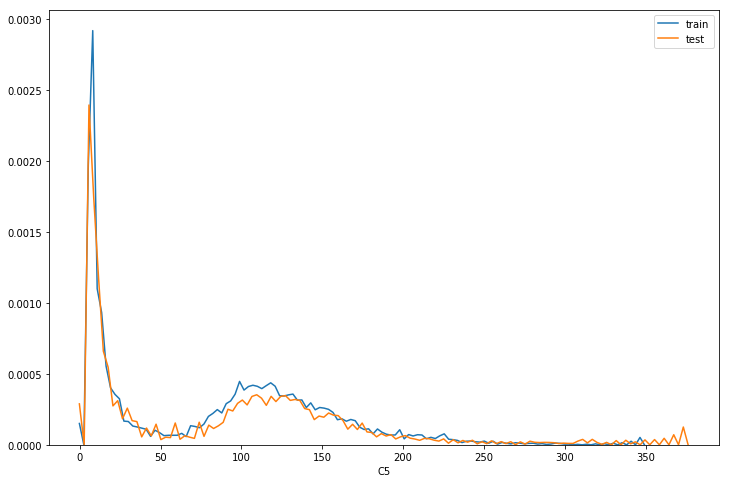

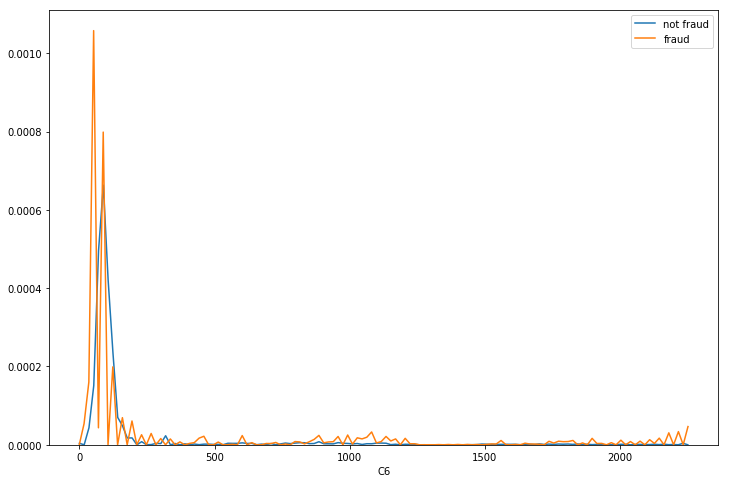

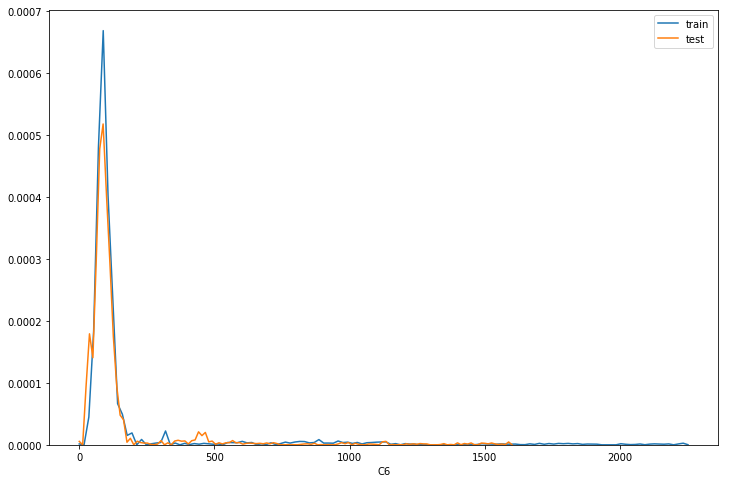

In [20]:
for feature in list(test)[10:20]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

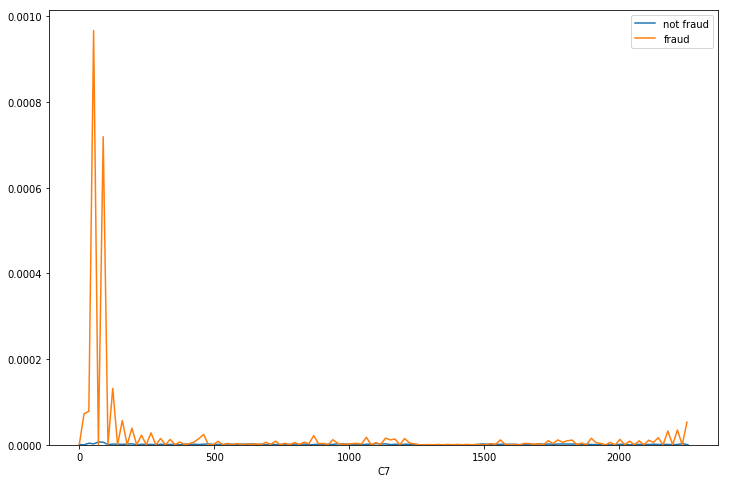

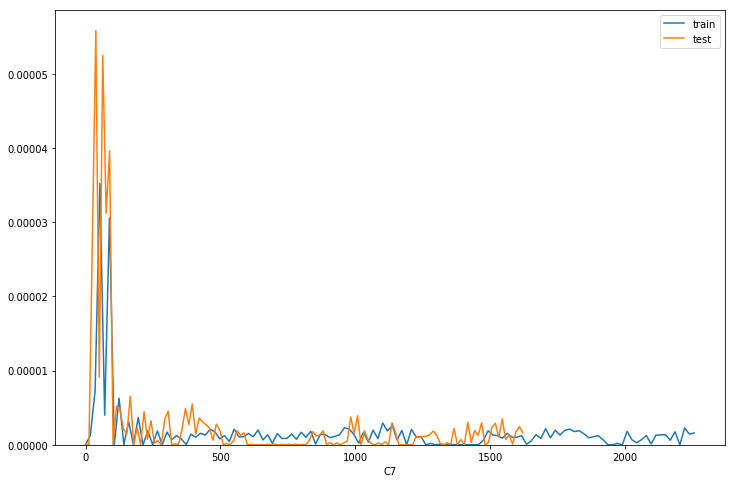

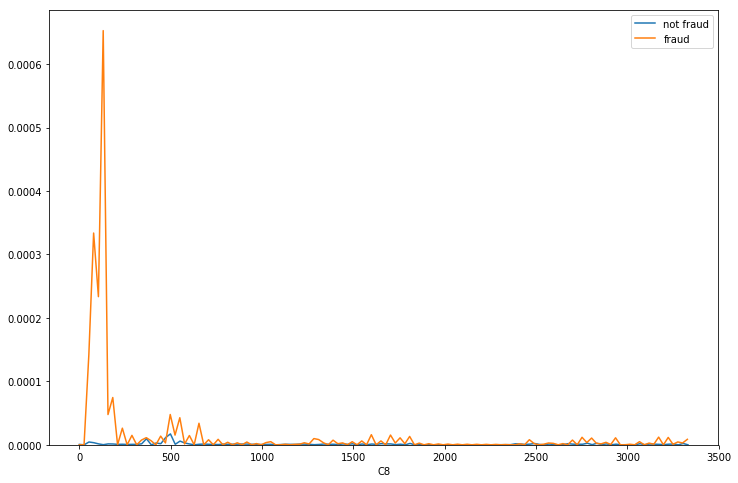

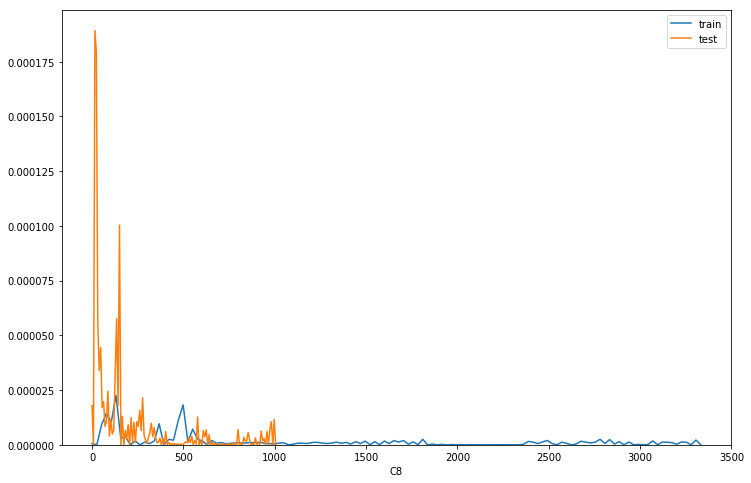

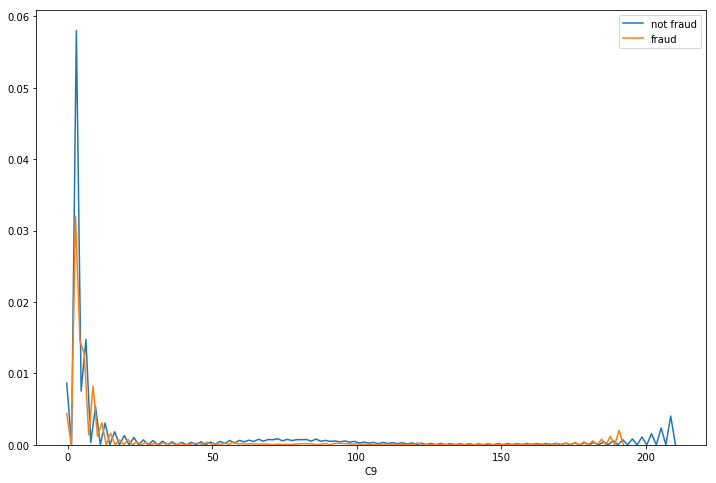

...

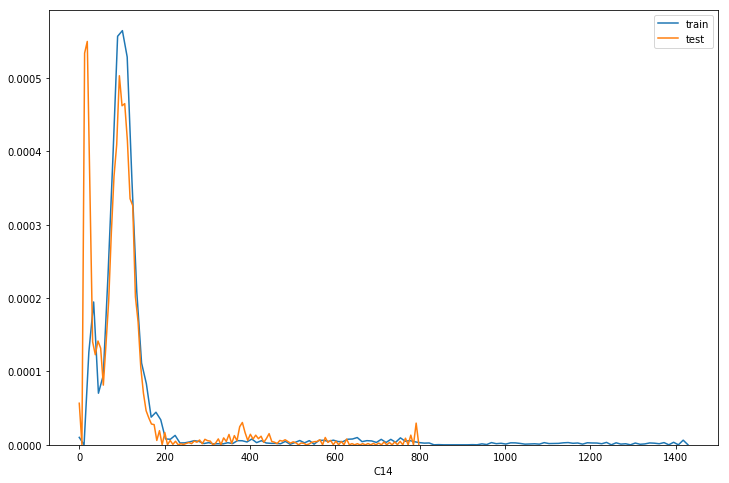

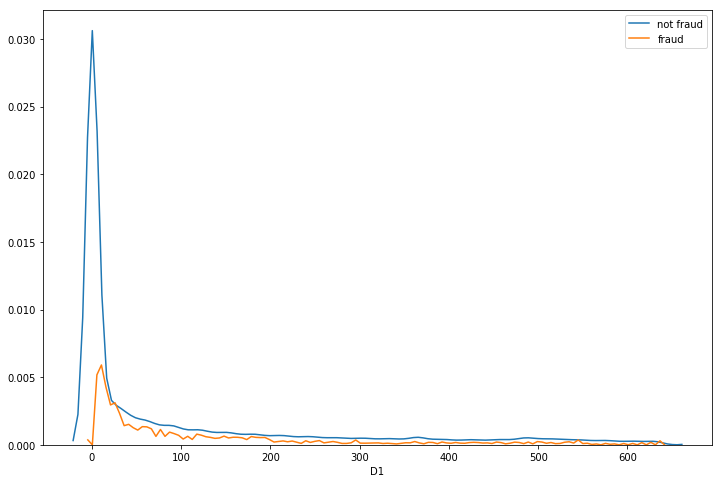

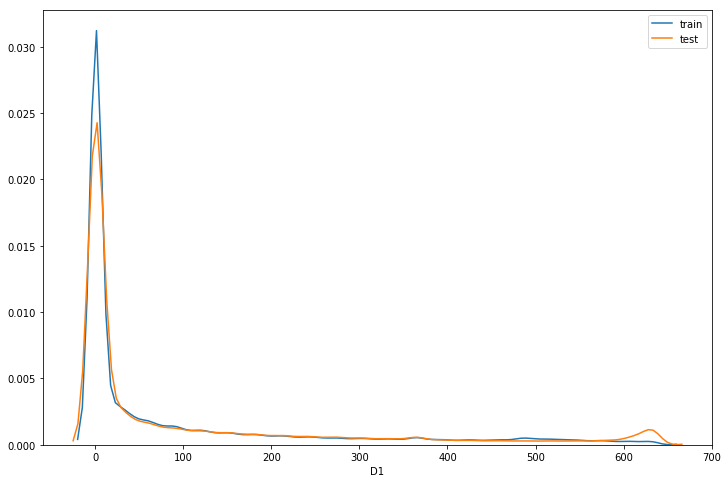

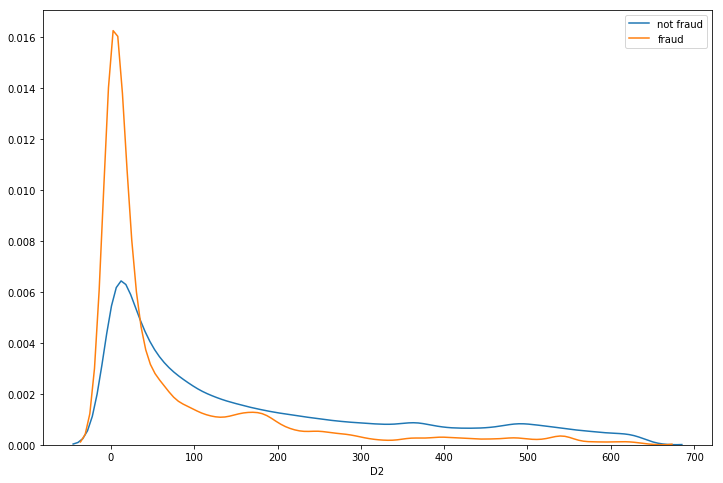

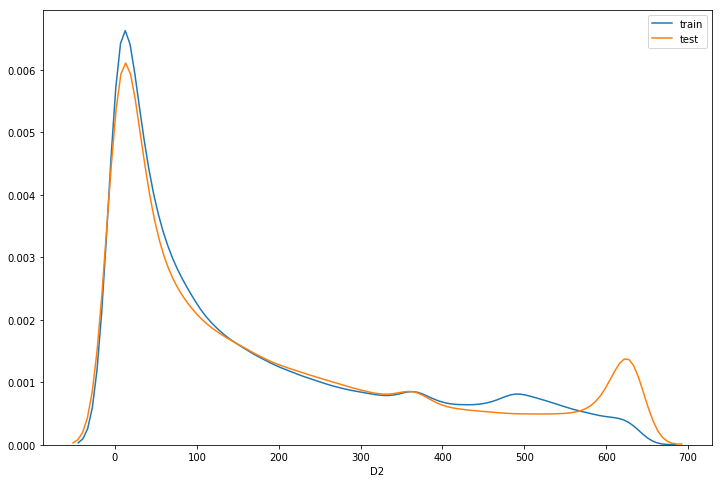

In [21]:
for feature in list(test)[20:30]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

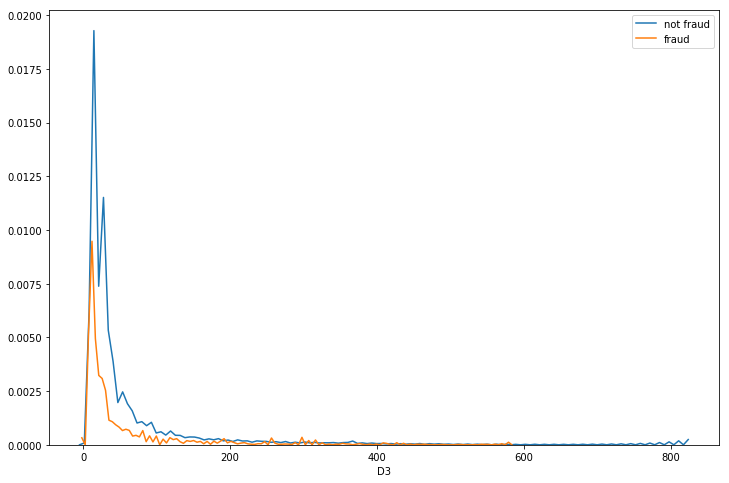

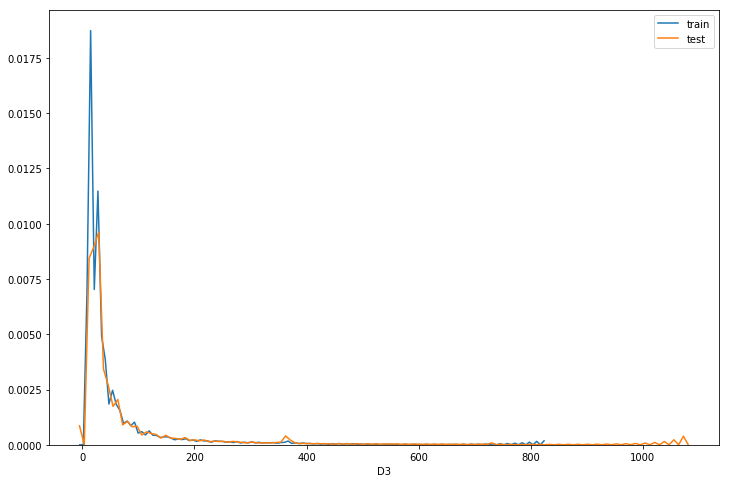

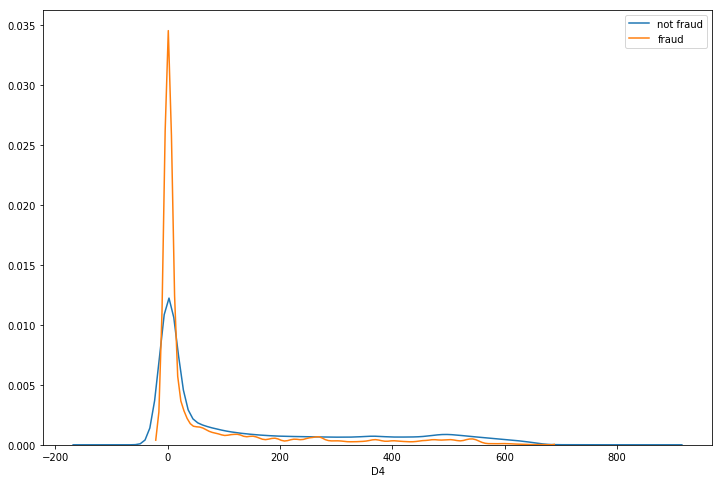

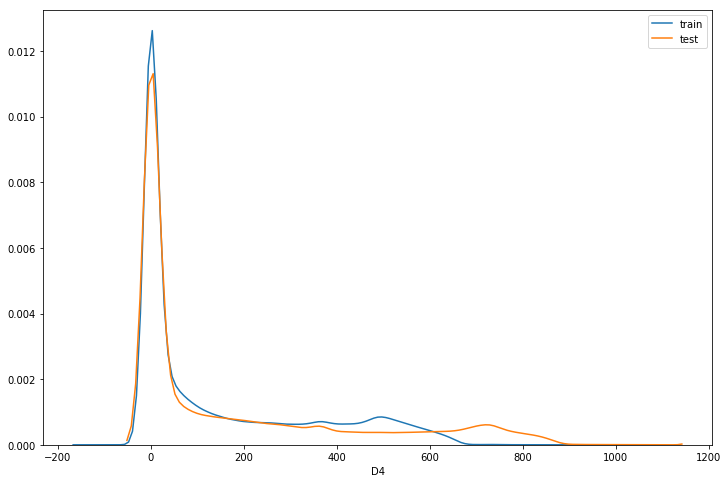

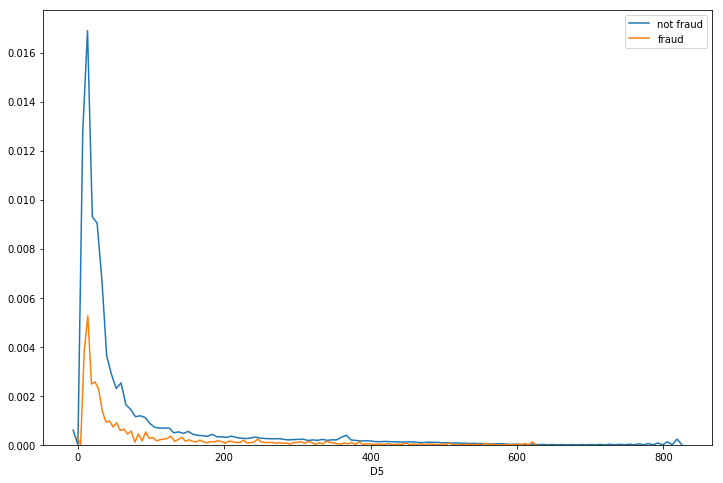

...

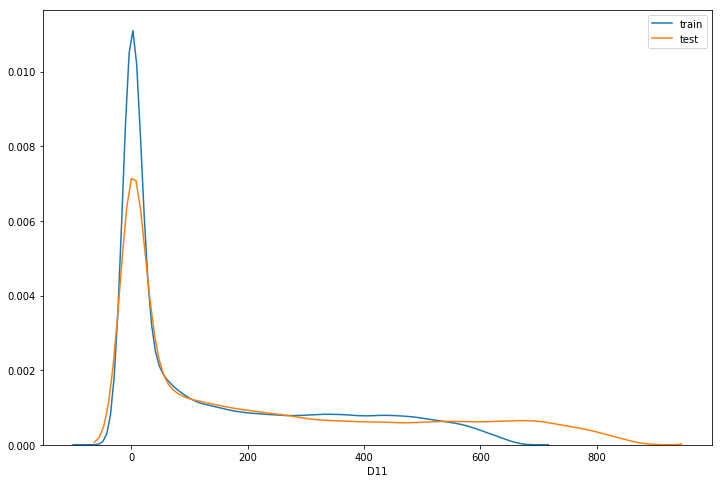

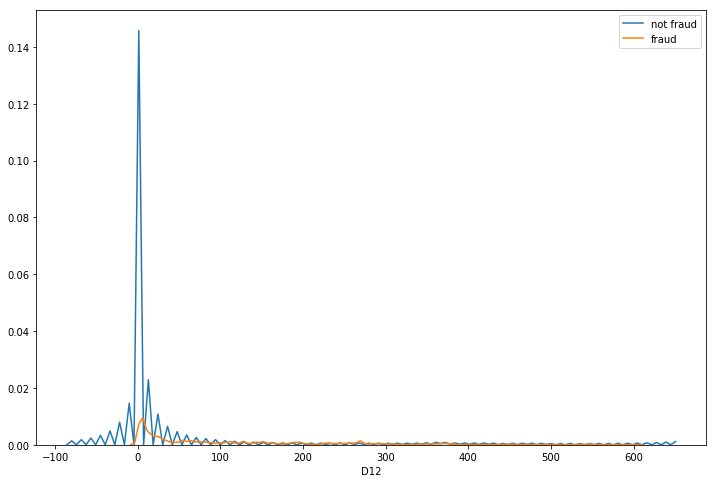

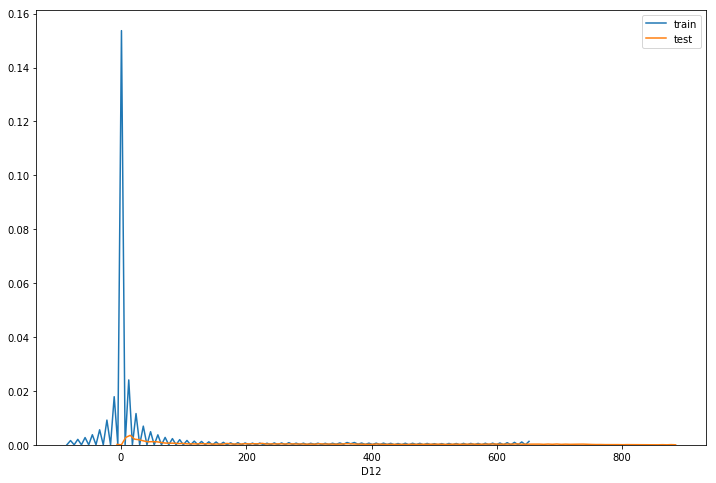

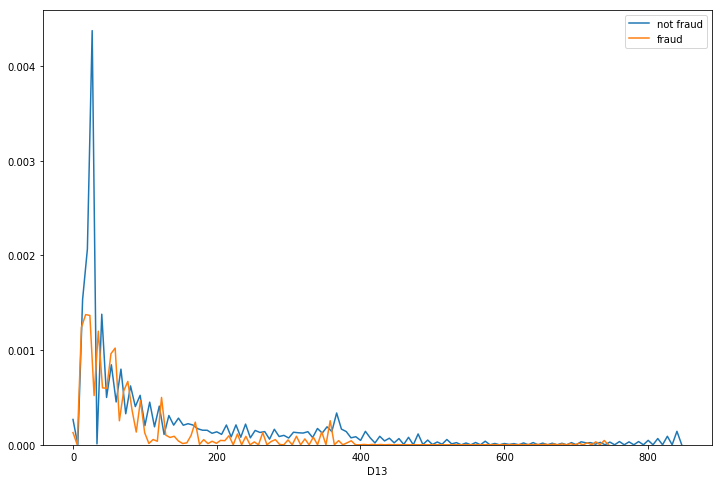

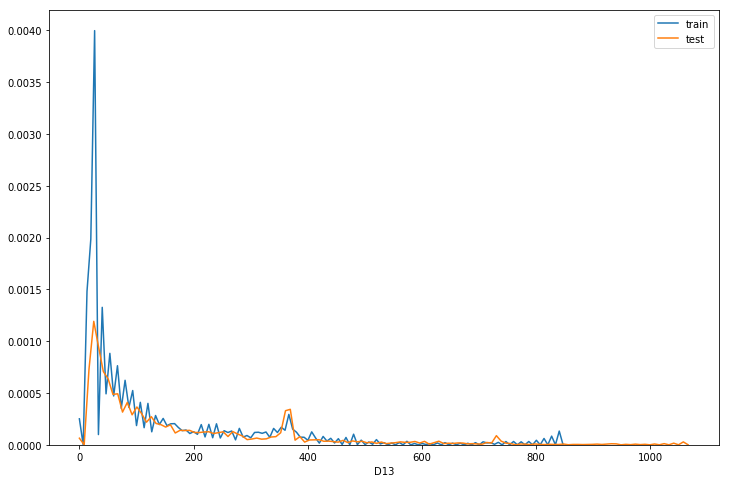

In [22]:
for feature in list(test)[30:40]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

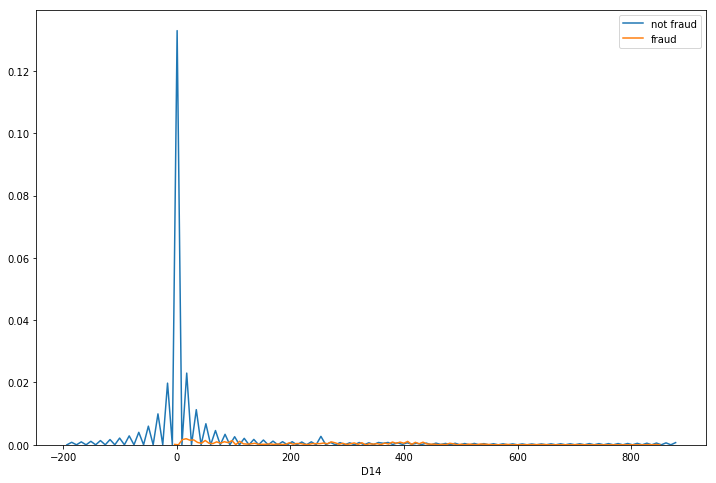

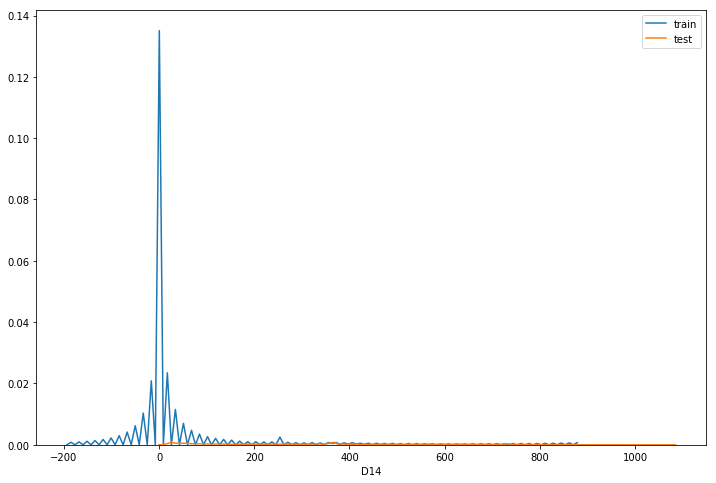

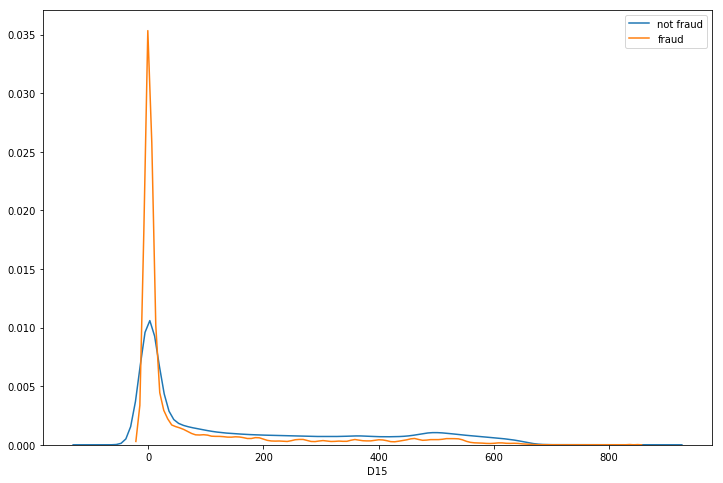

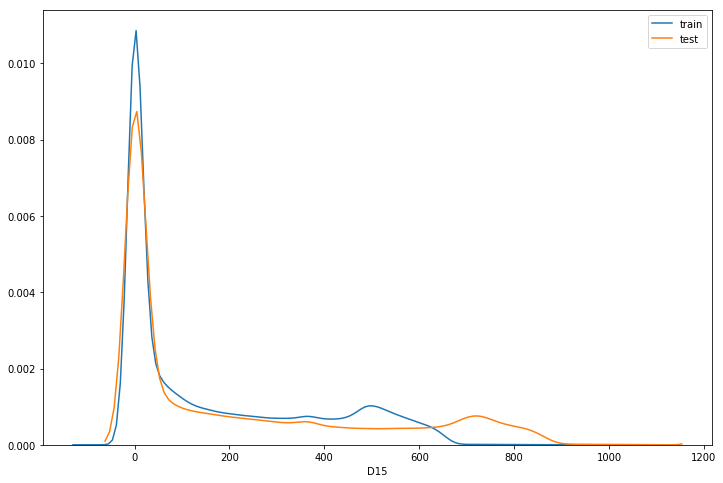

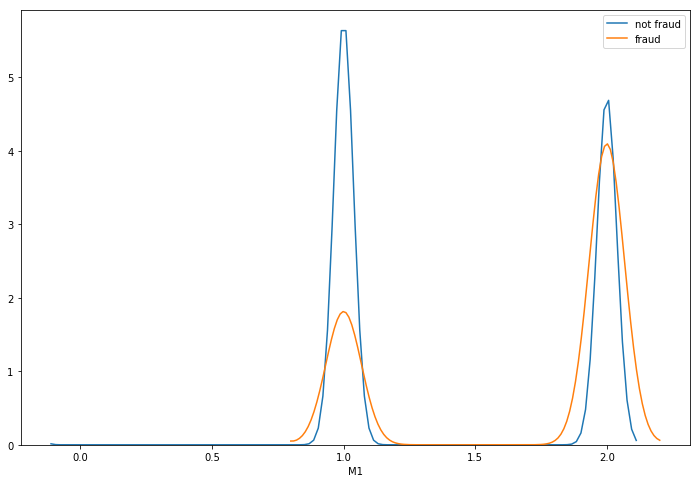

...

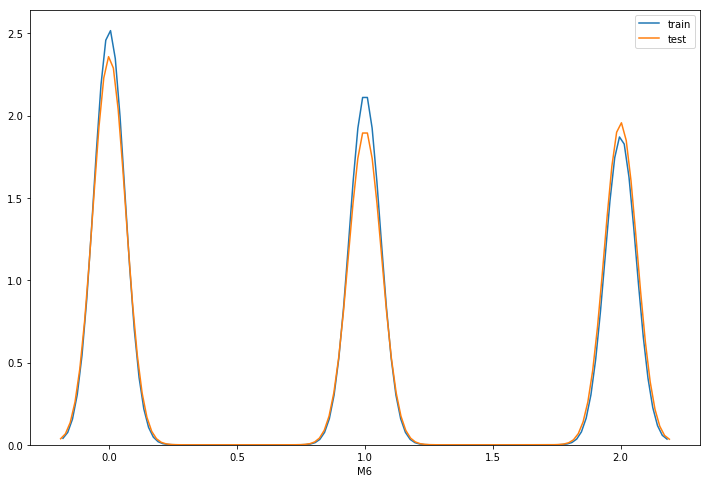

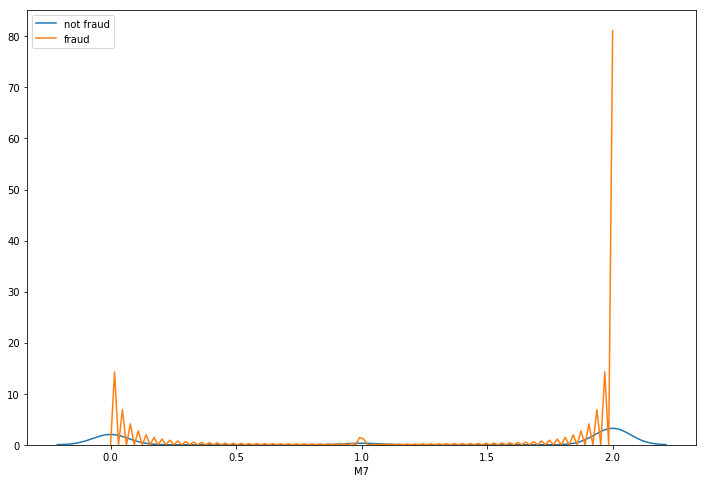

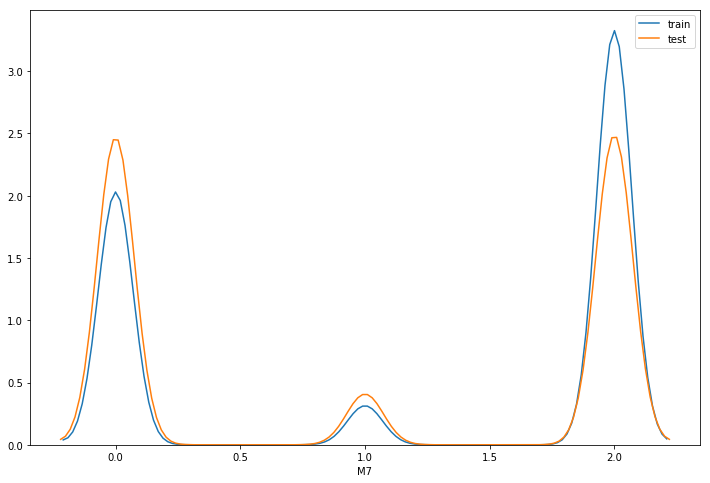

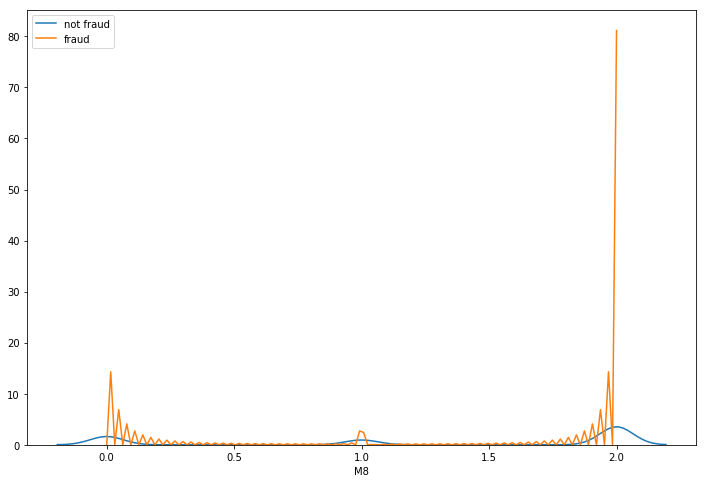

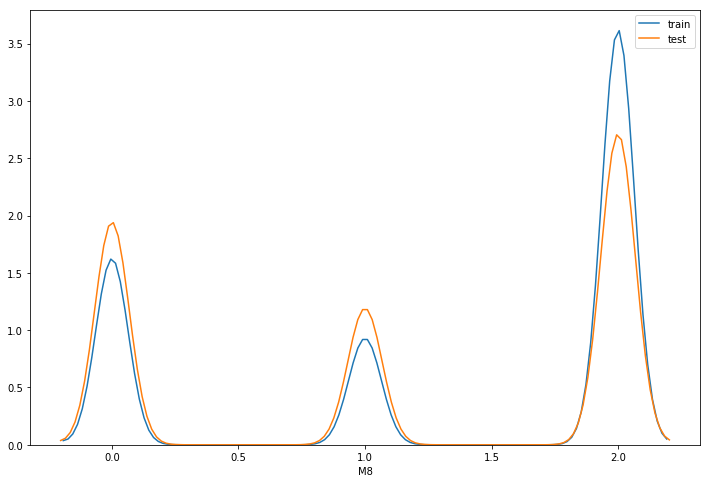

In [23]:
for feature in list(test)[40:50]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

/Users/cchadha2/anaconda3/envs/eda/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/Users/cchadha2/anaconda3/envs/eda/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
/Users/cchadha2/anaconda3/envs/eda/lib/python3.7/site-packages/numpy/core/fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


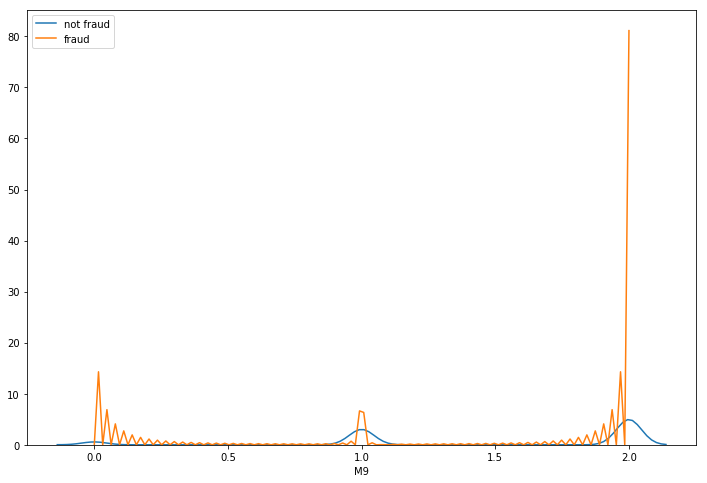

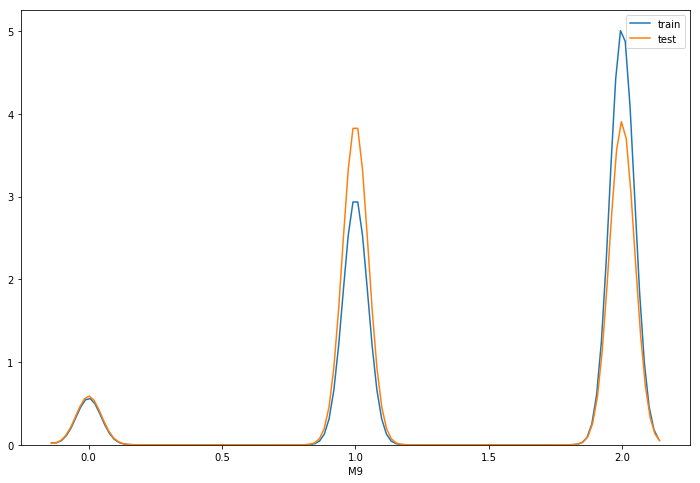

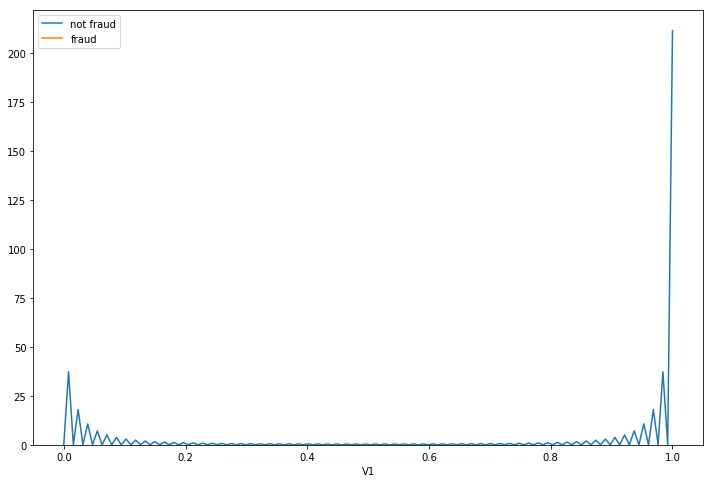

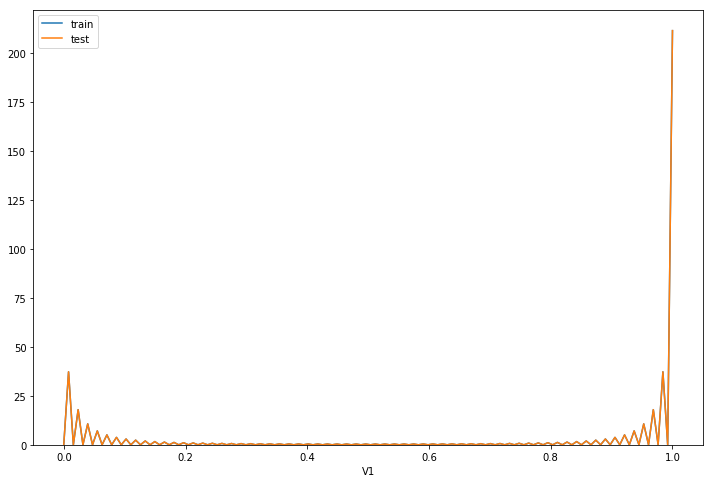

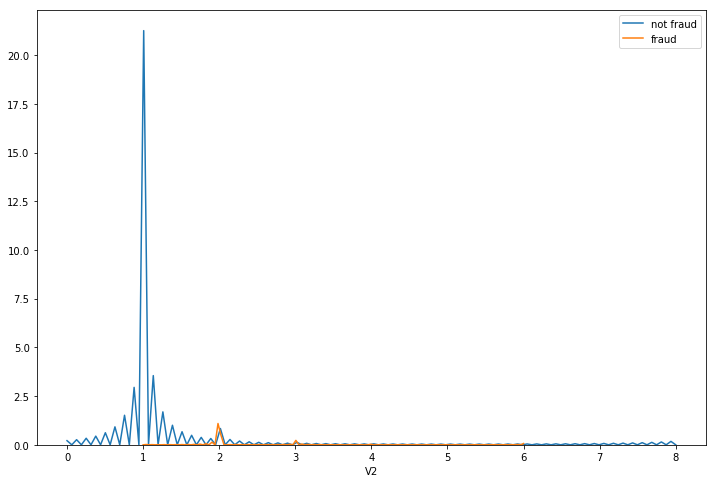

...

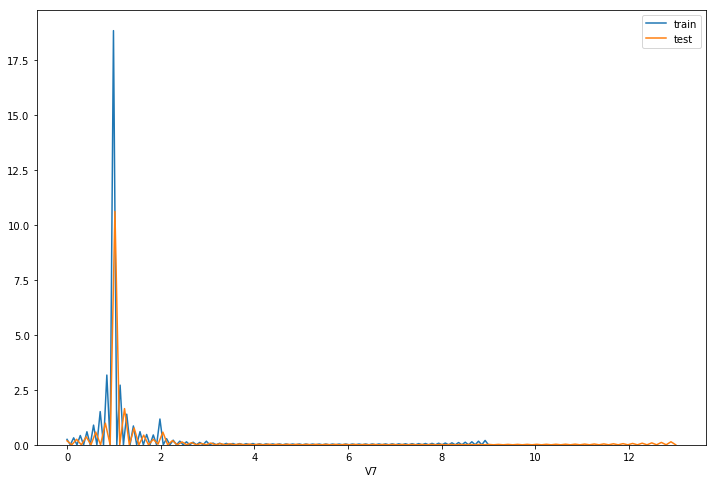

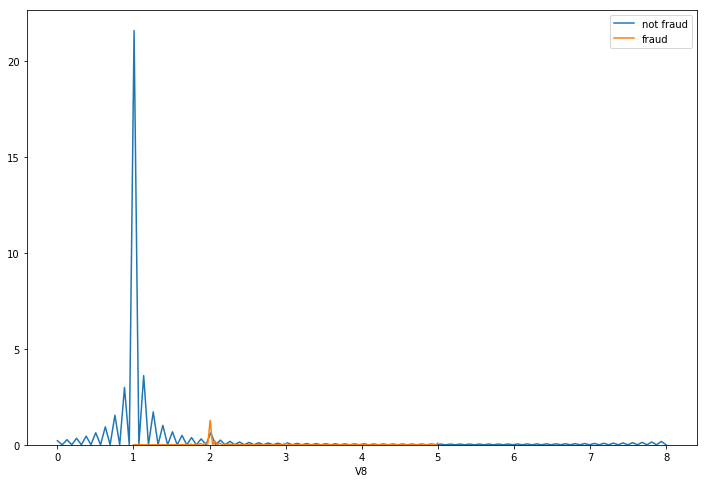

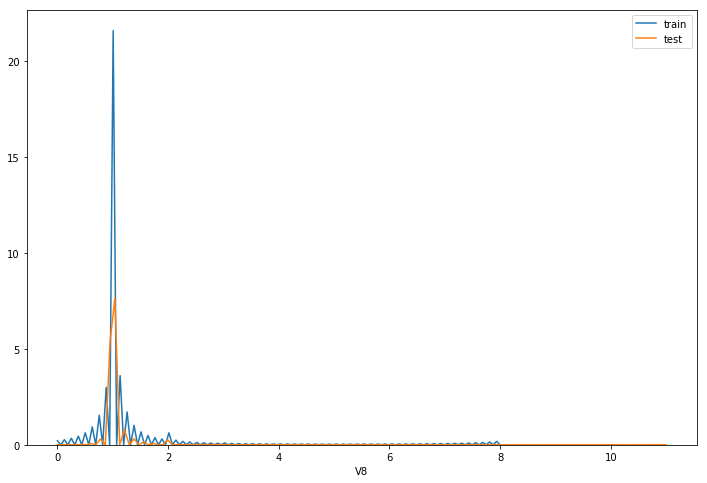

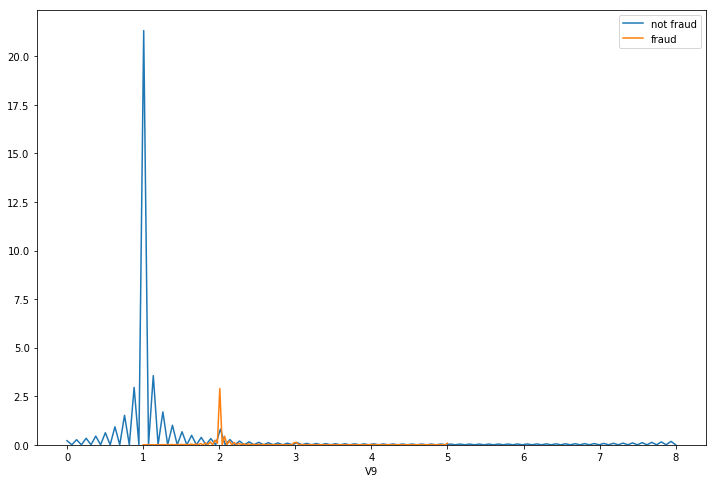

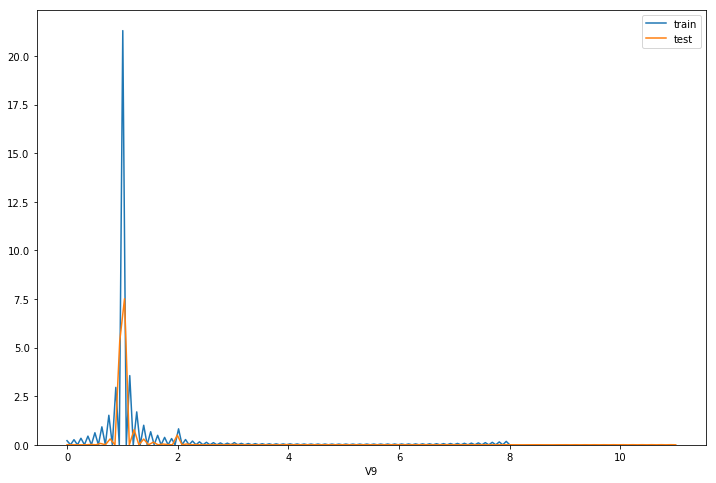

In [24]:
for feature in list(test)[50:60]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

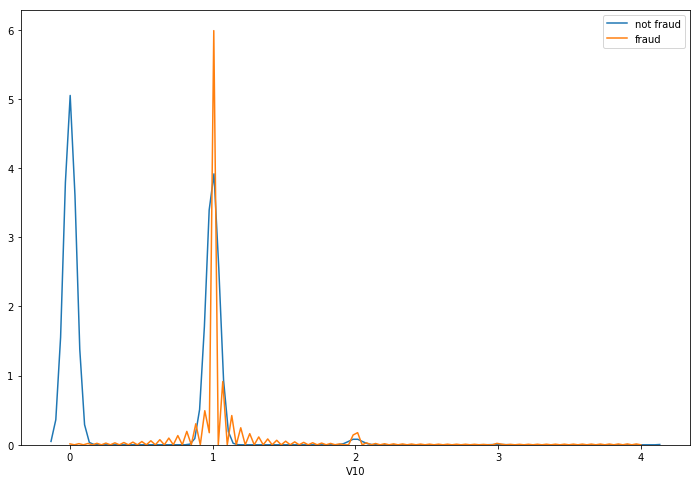

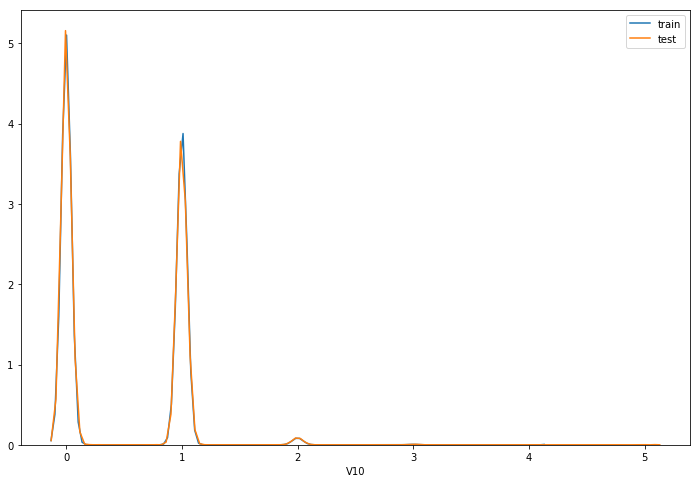

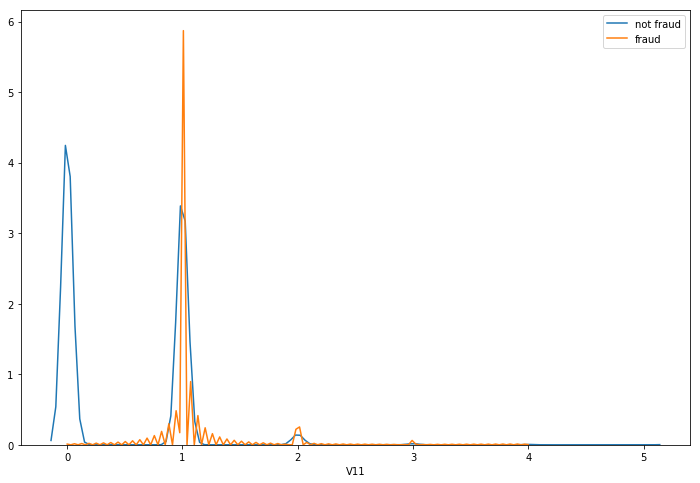

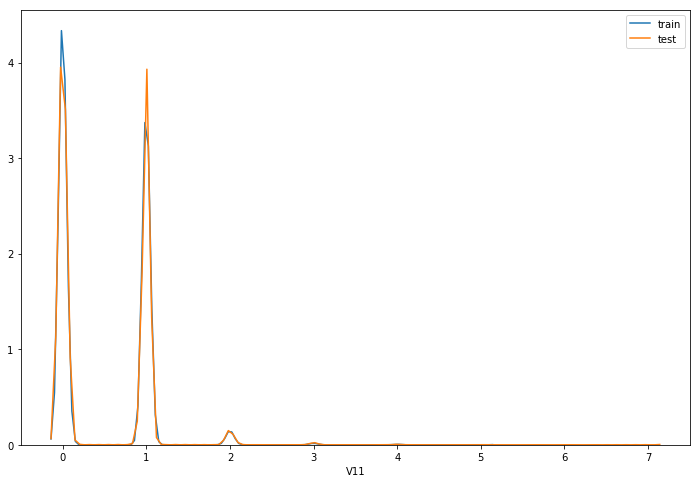

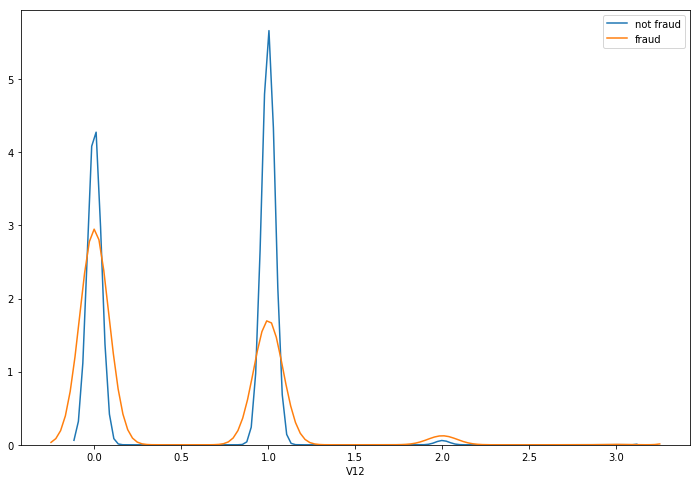

...

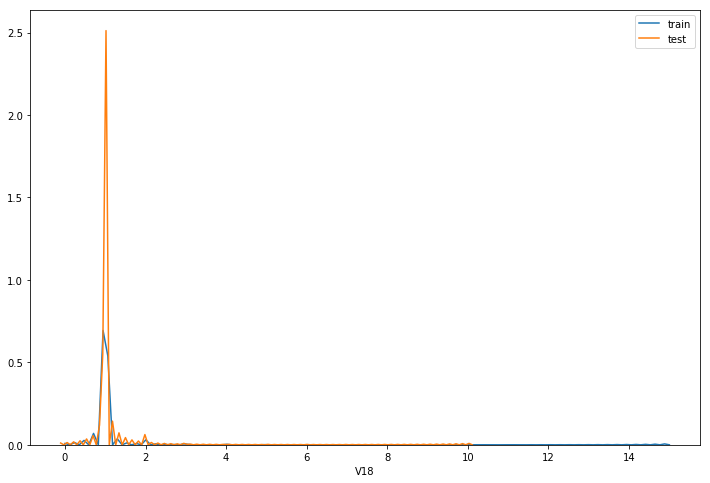

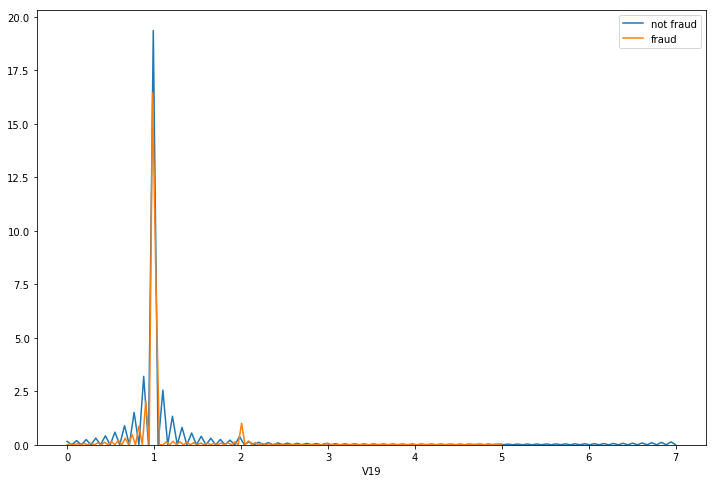

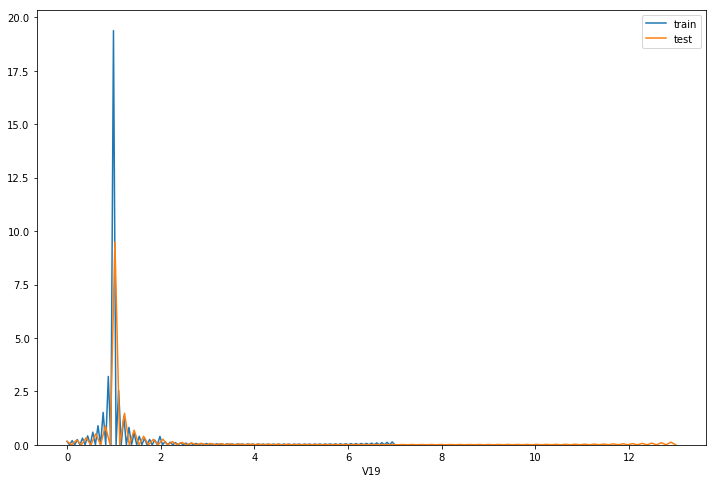

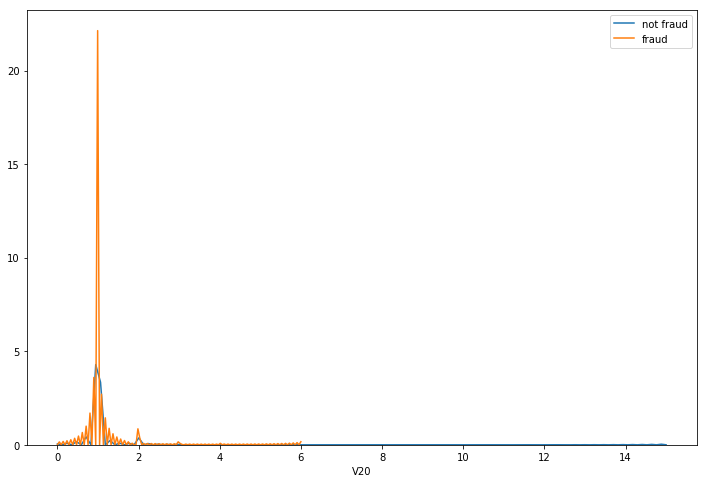

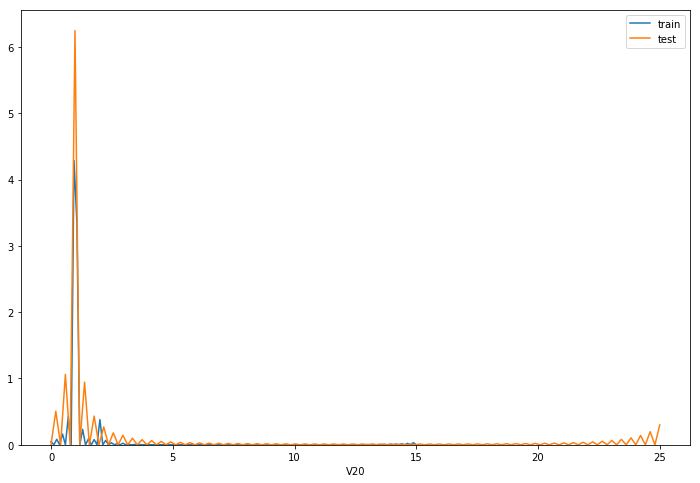

In [25]:
for feature in list(test)[60:70]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

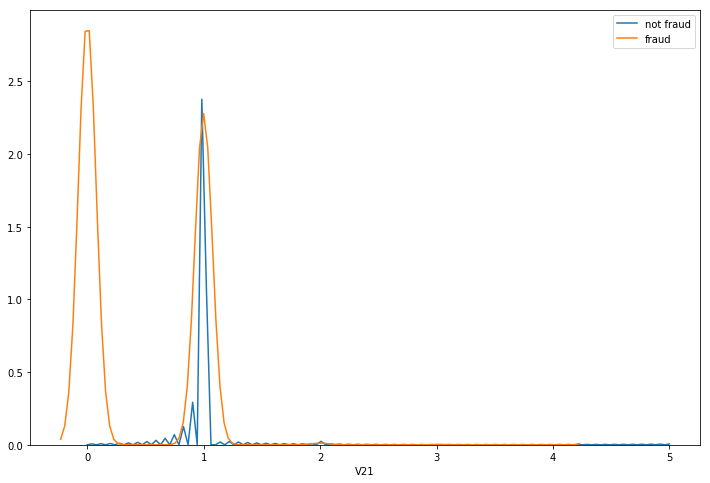

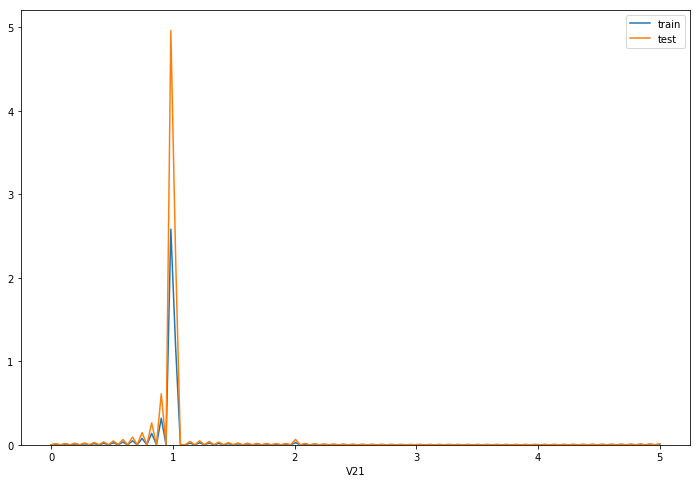

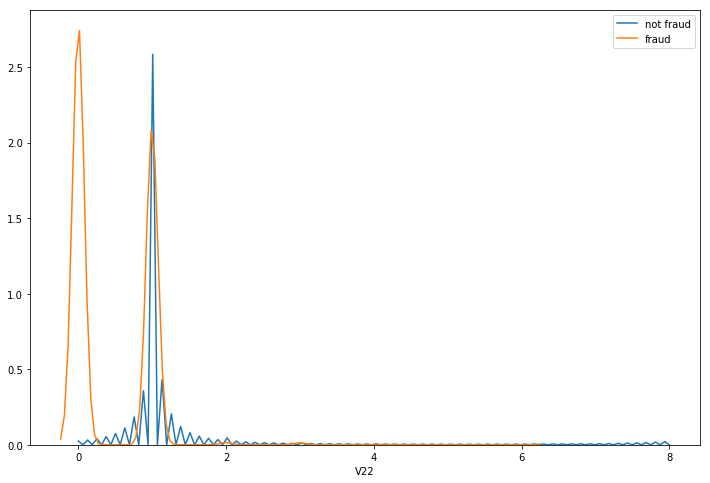

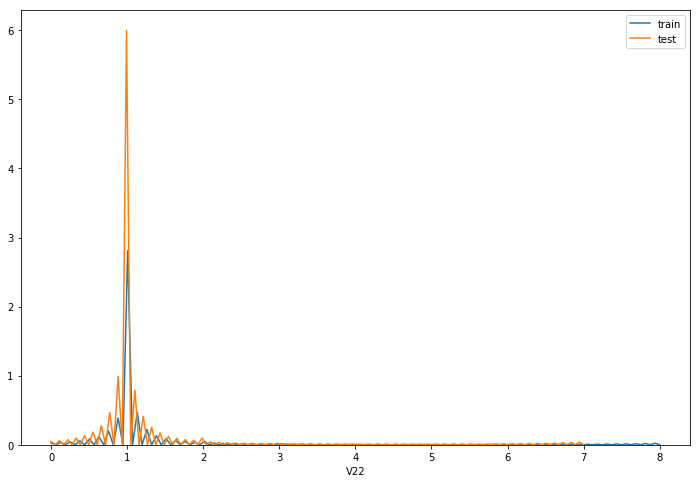

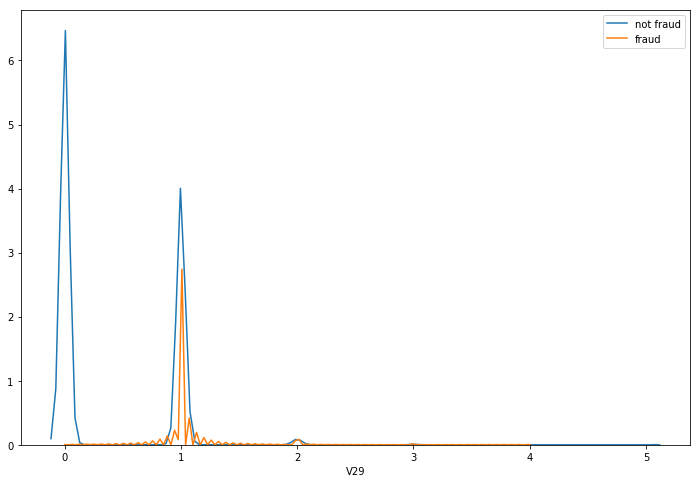

...

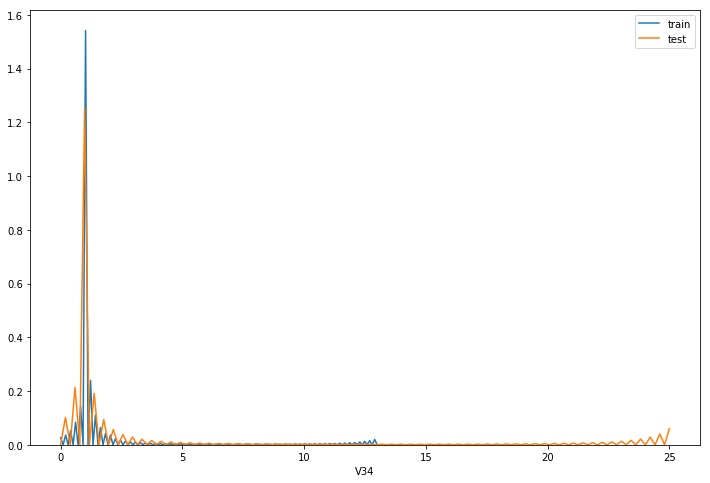

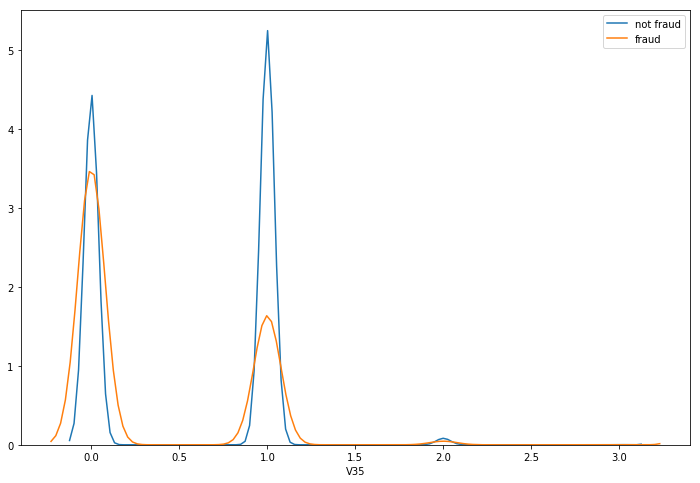

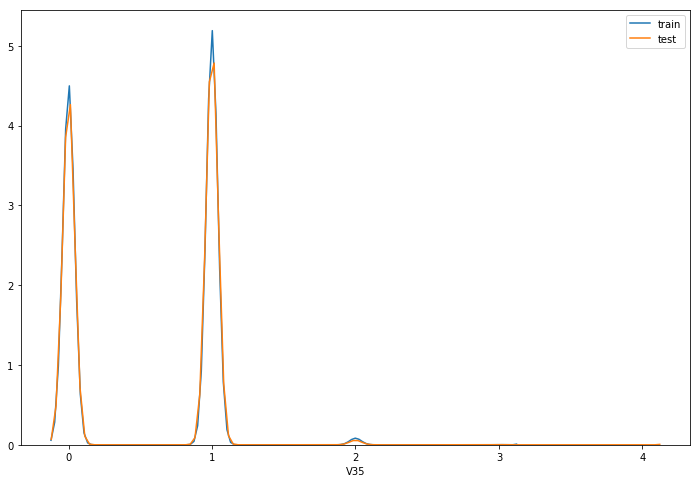

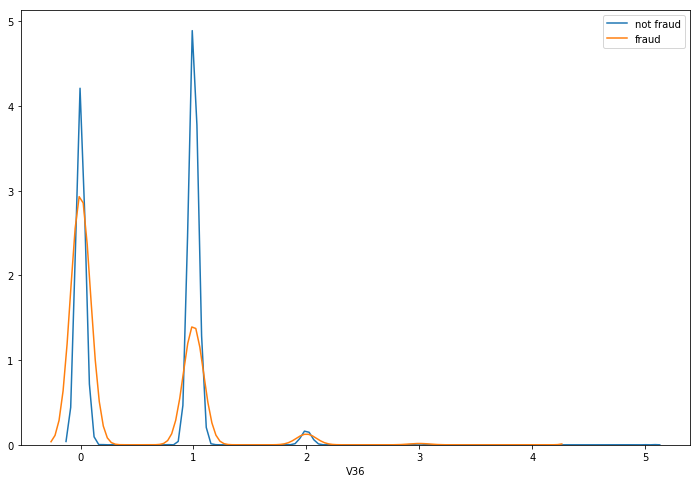

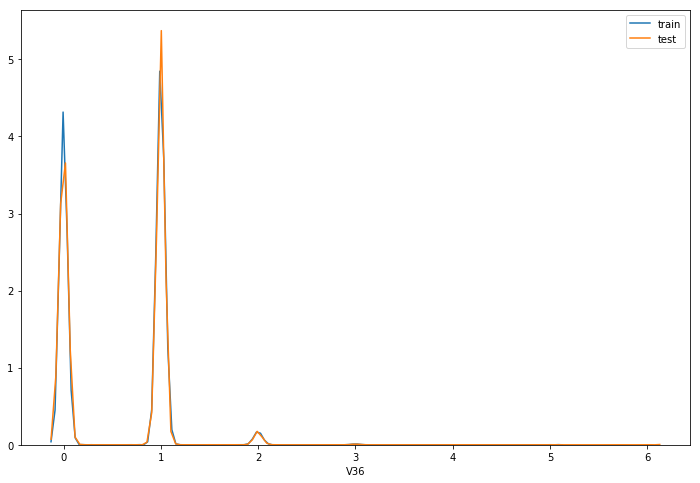

In [26]:
for feature in list(test)[70:80]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

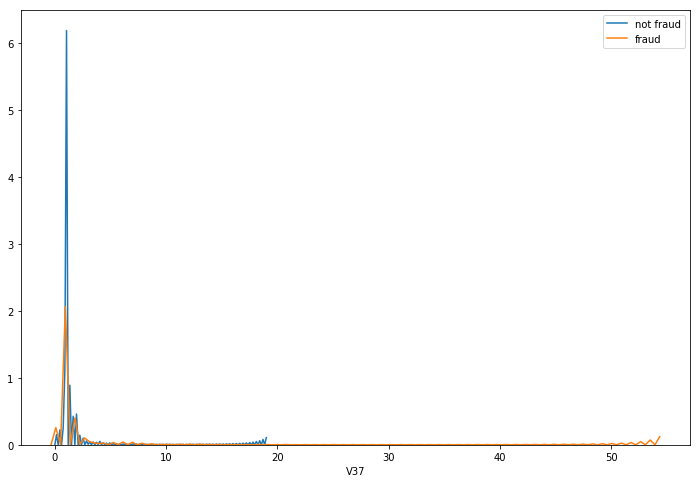

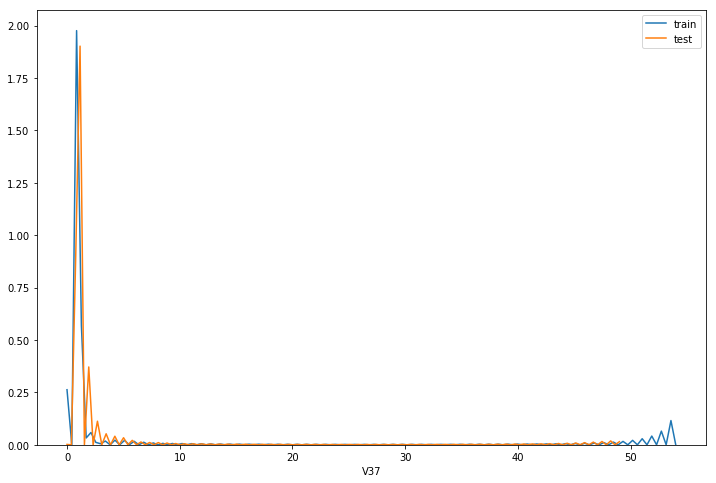

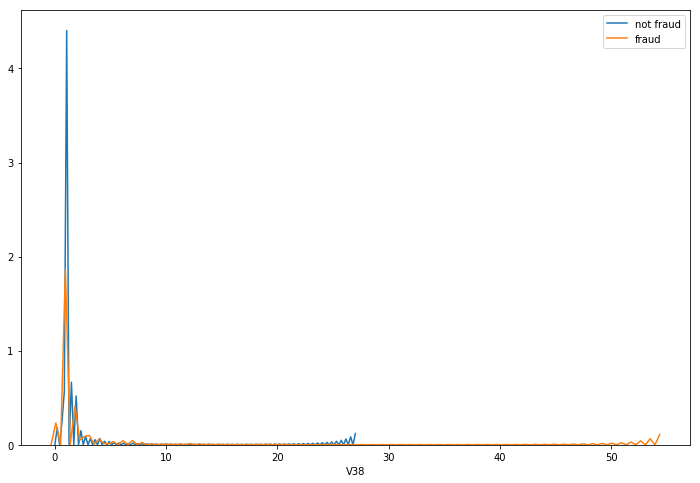

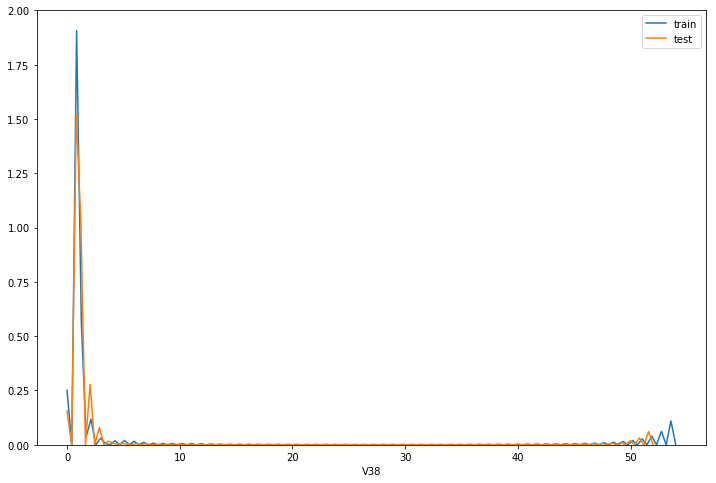

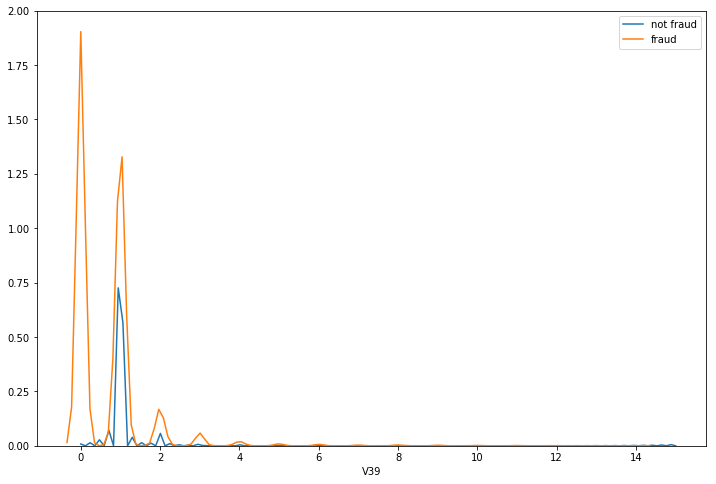

...

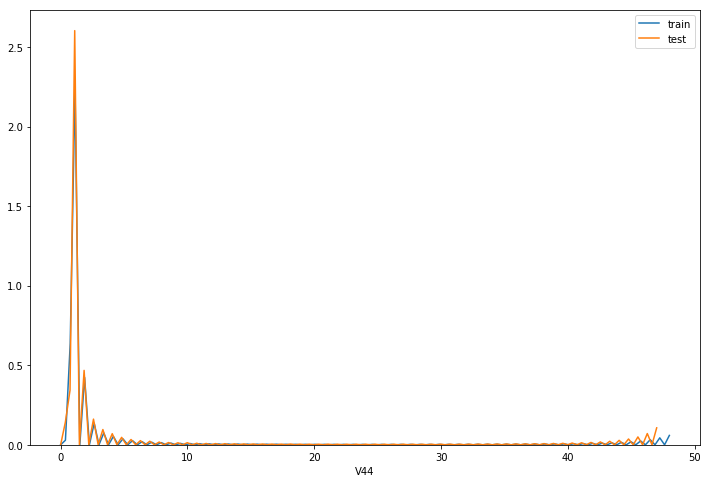

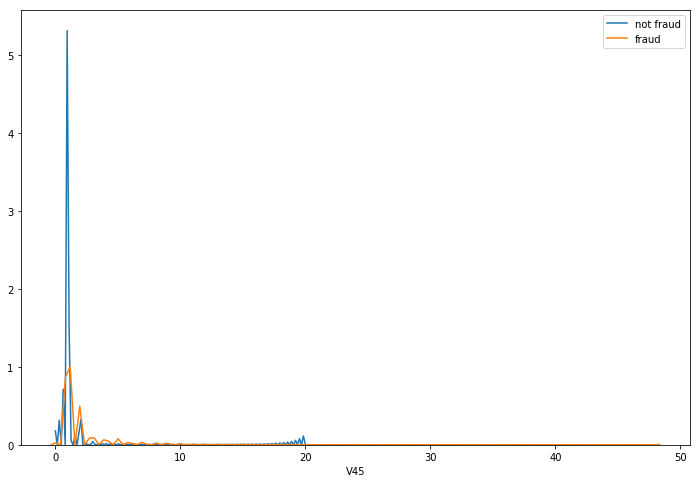

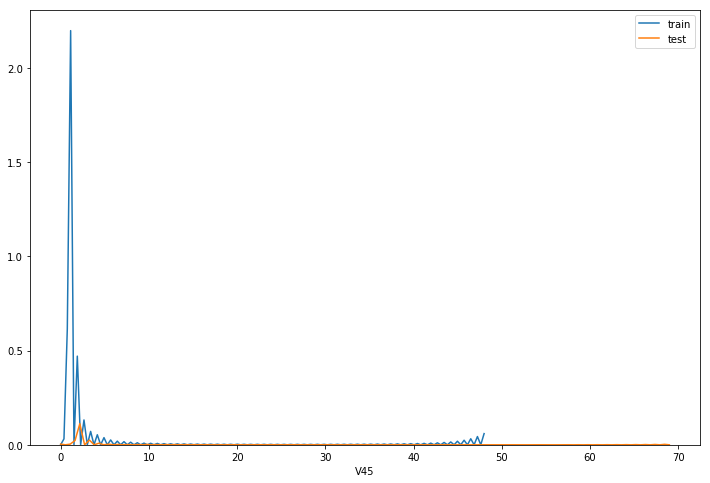

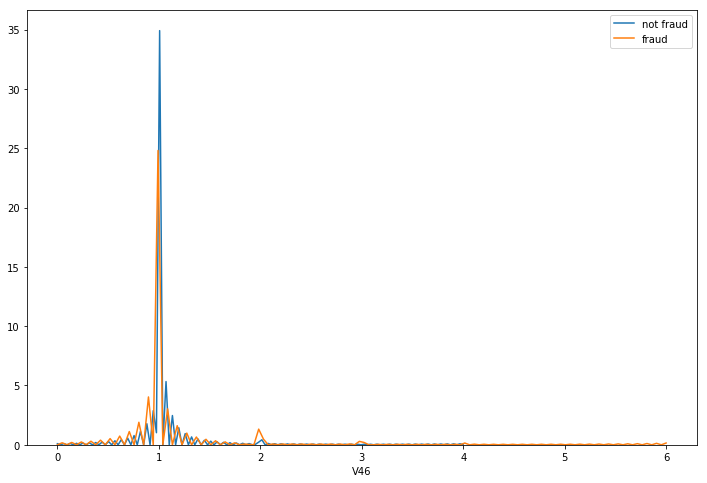

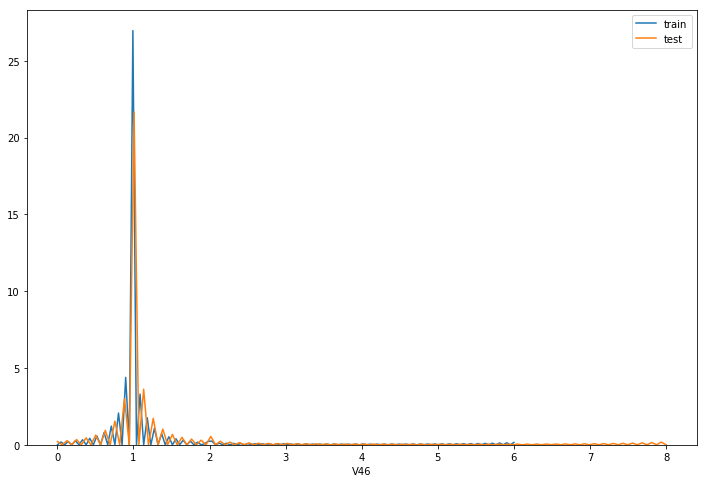

In [27]:
for feature in list(test)[80:90]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

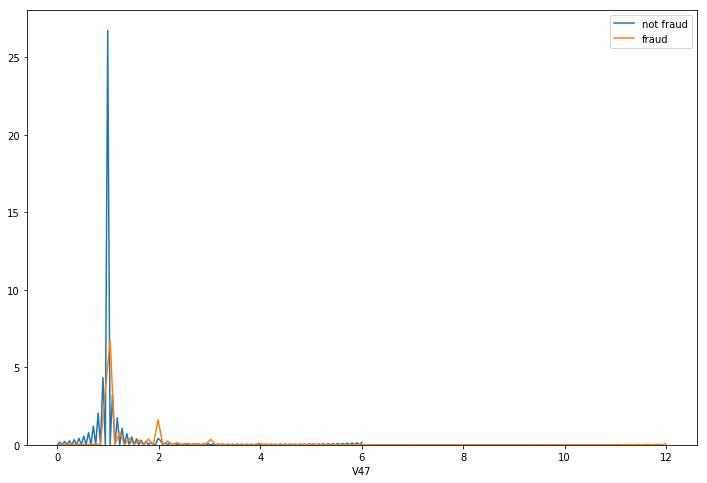

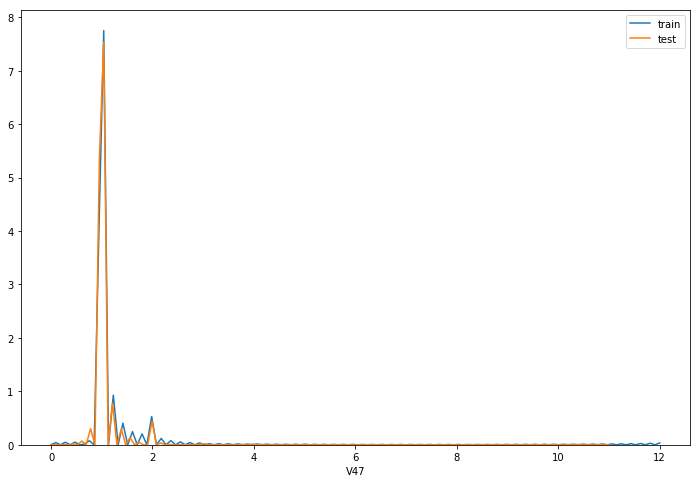

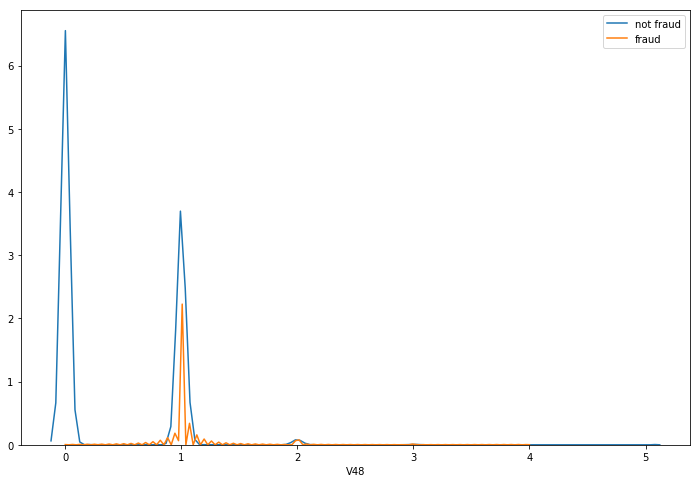

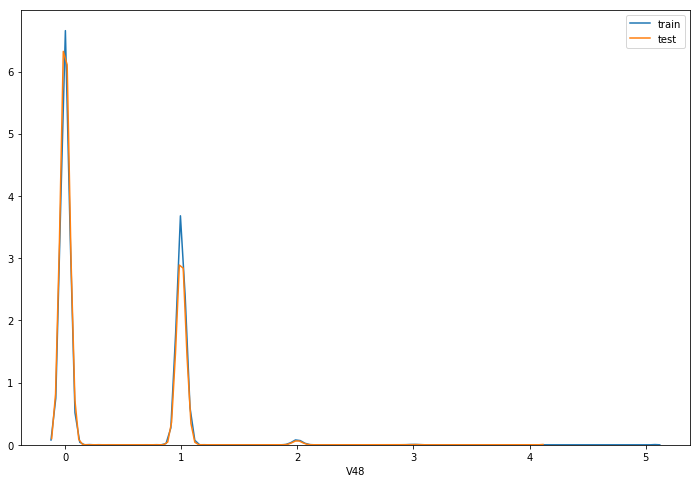

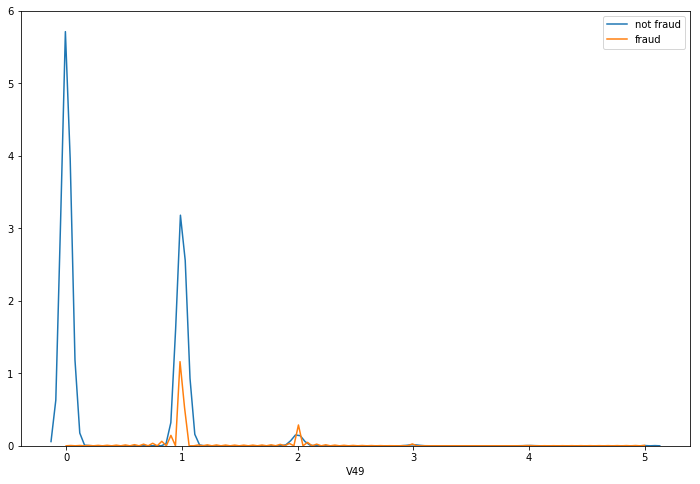

...

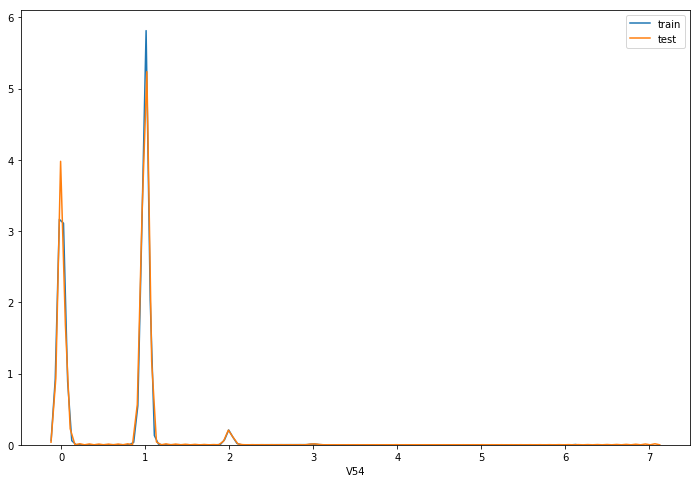

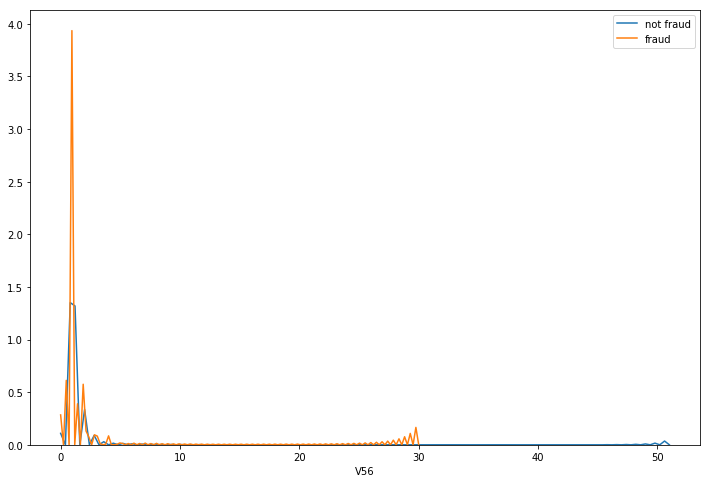

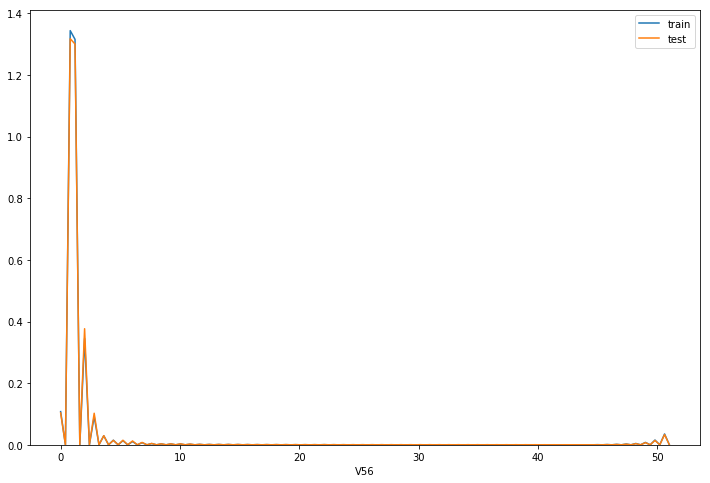

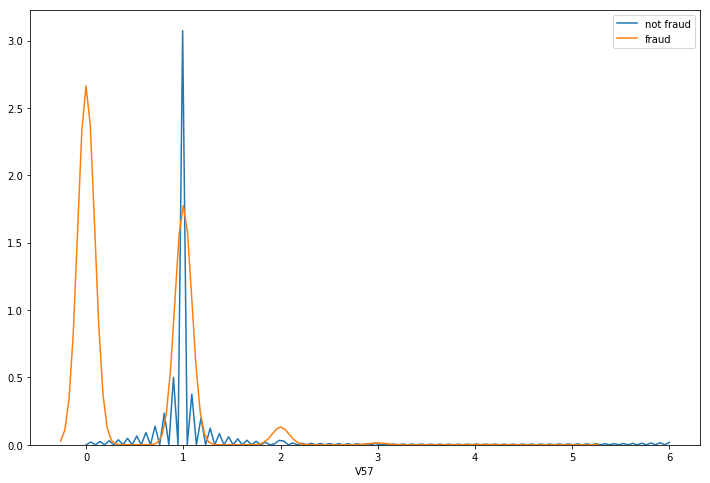

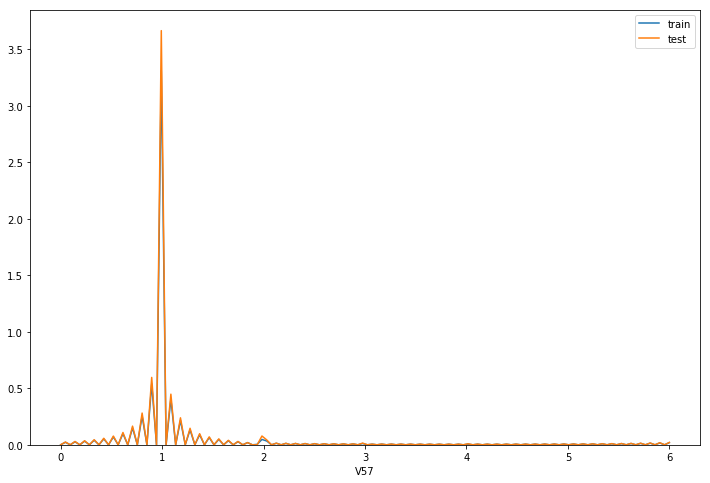

In [28]:
for feature in list(test)[90:100]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

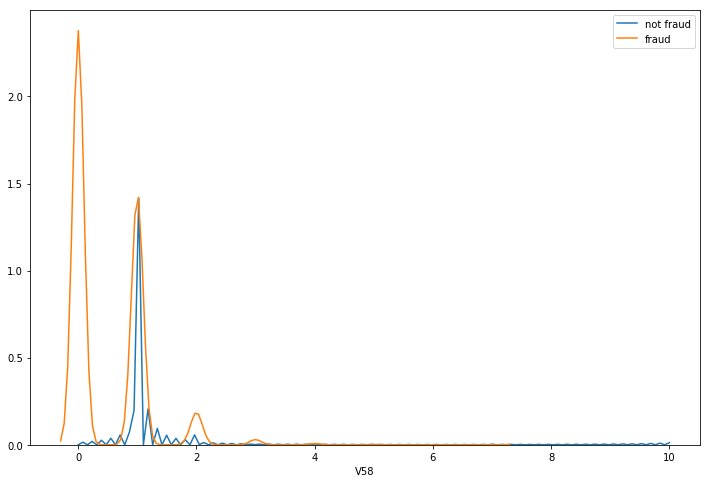

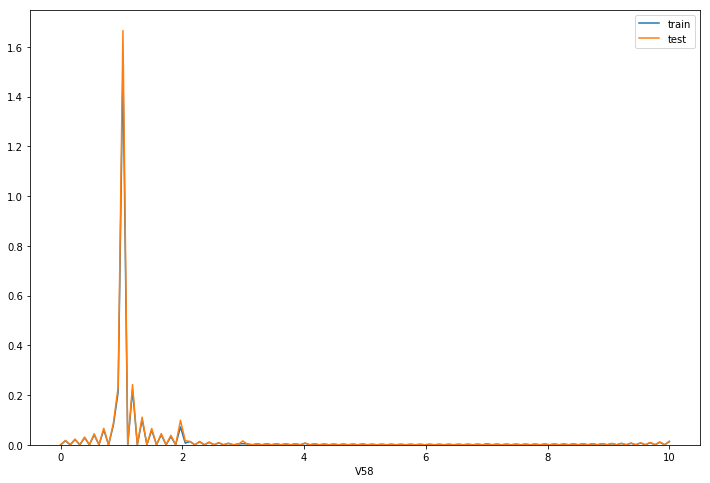

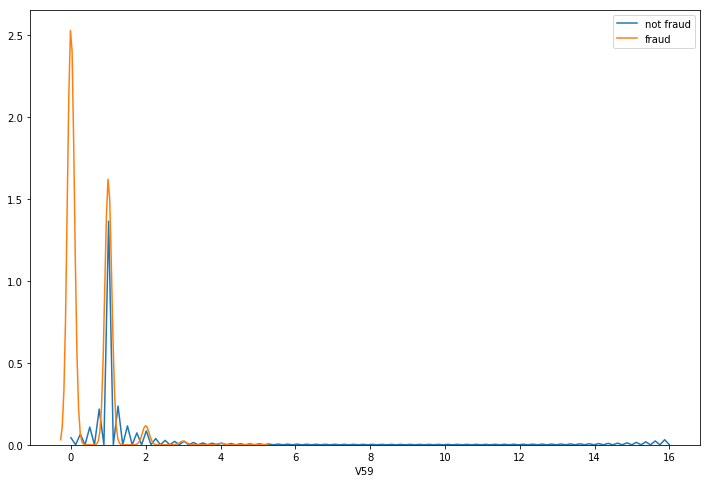

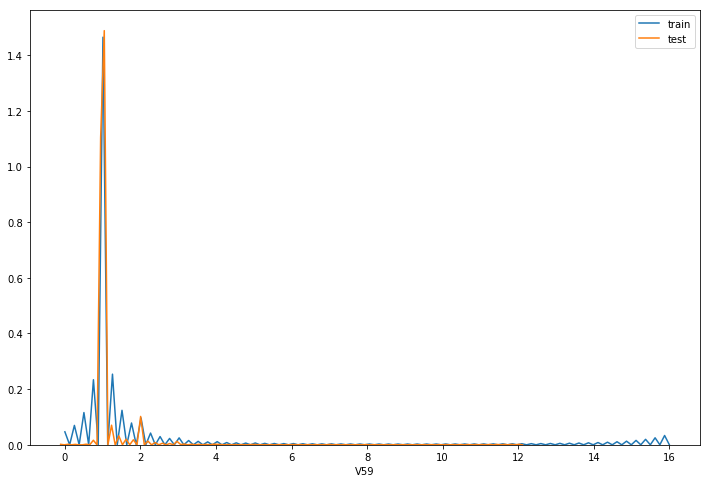

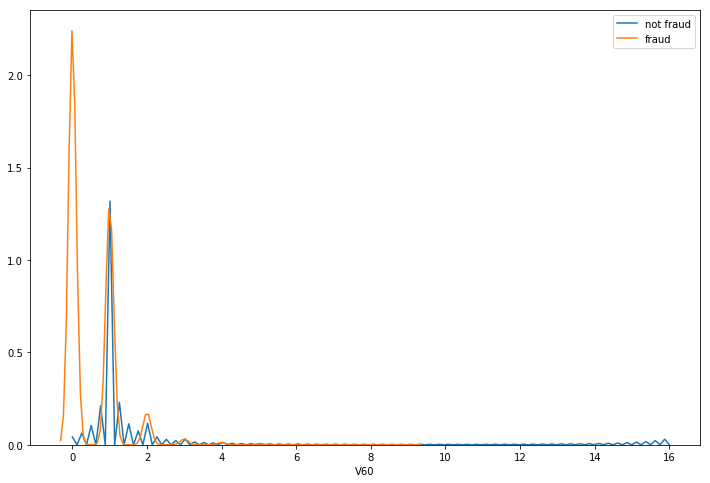

...

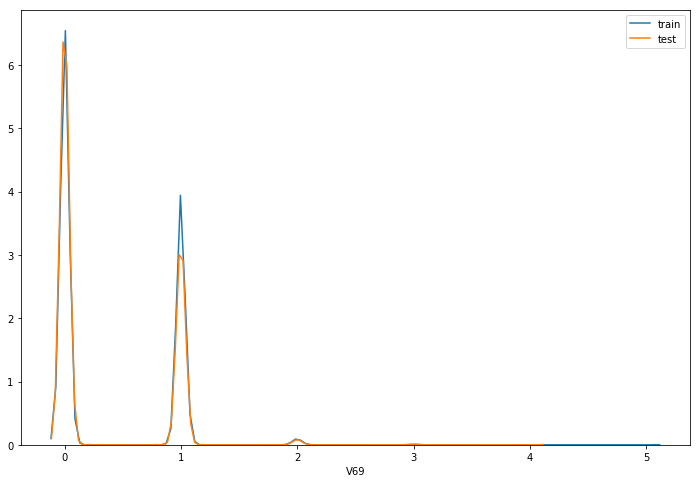

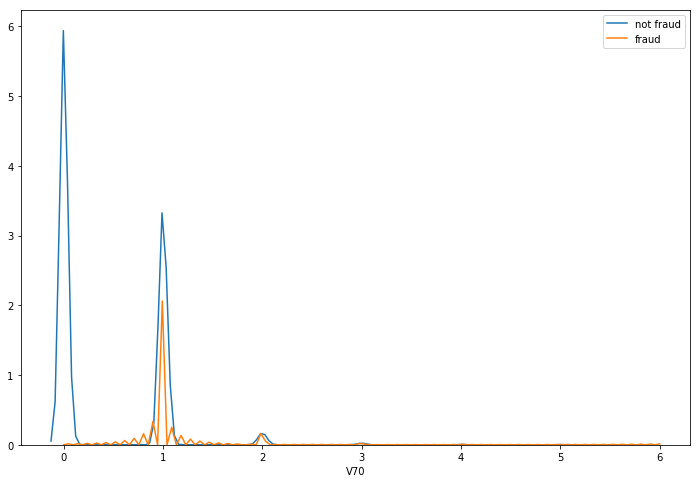

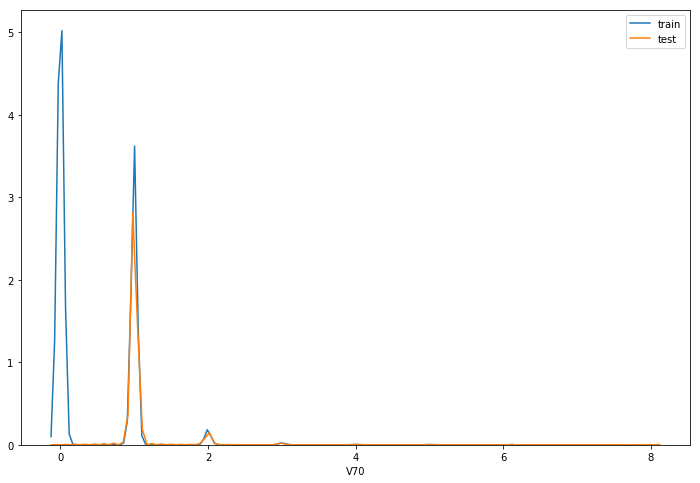

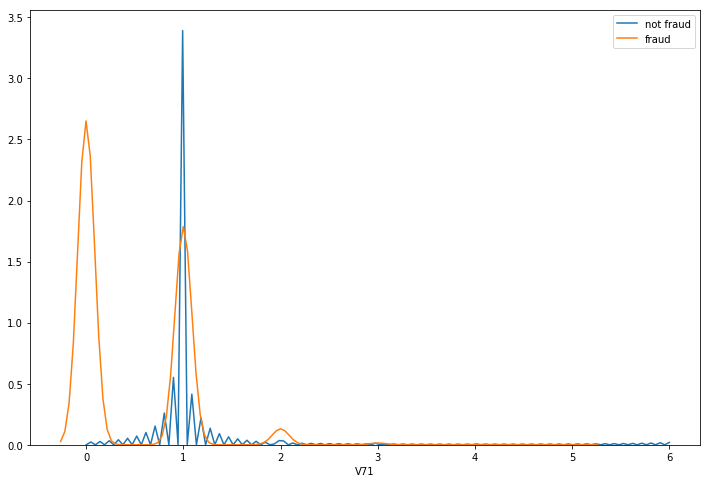

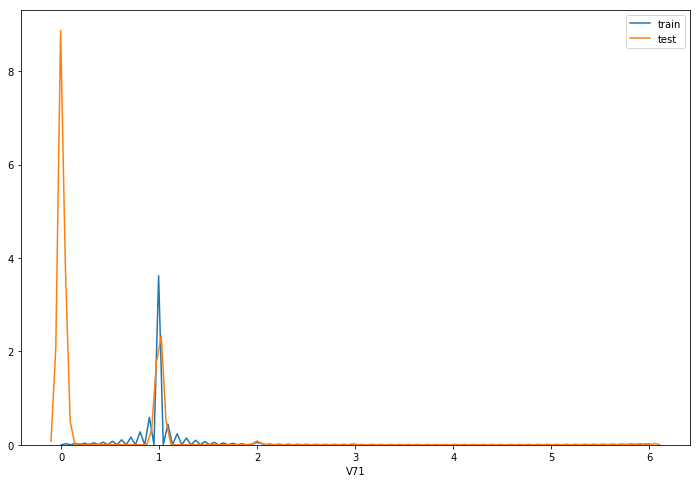

In [29]:
for feature in list(test)[100:110]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

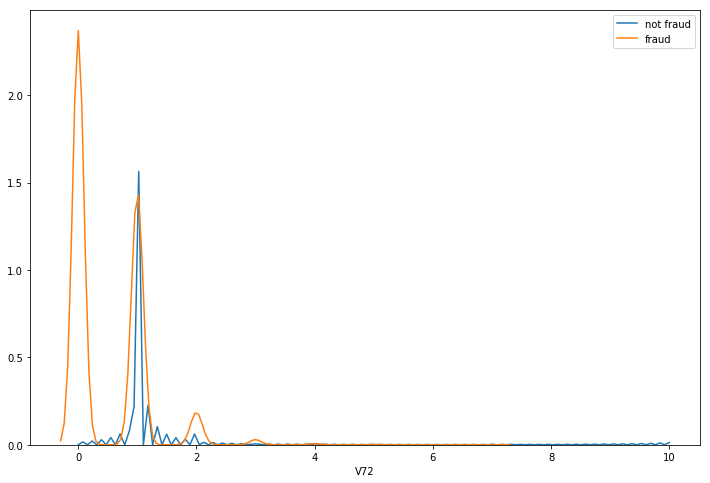

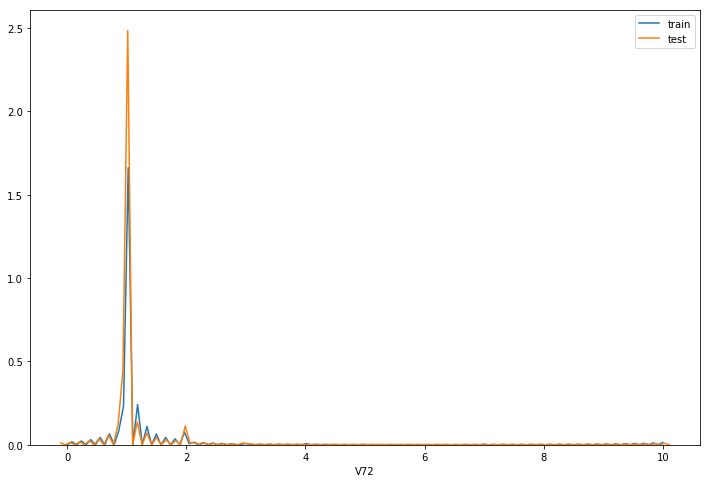

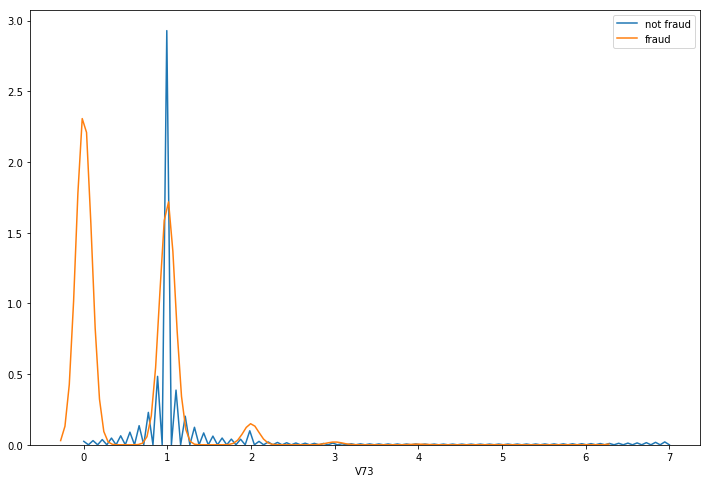

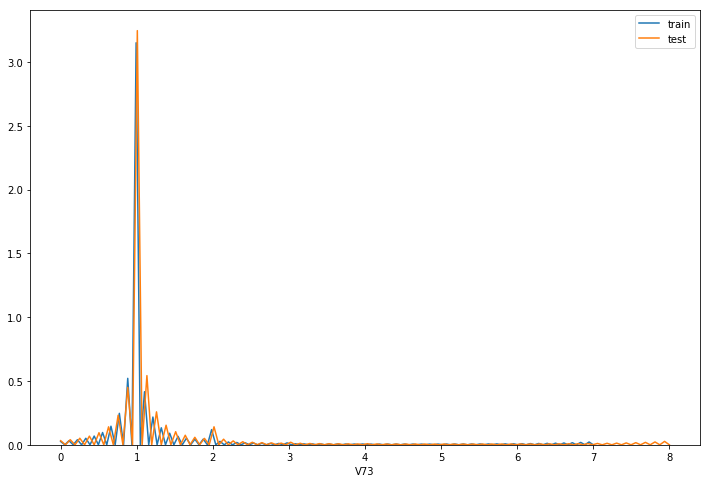

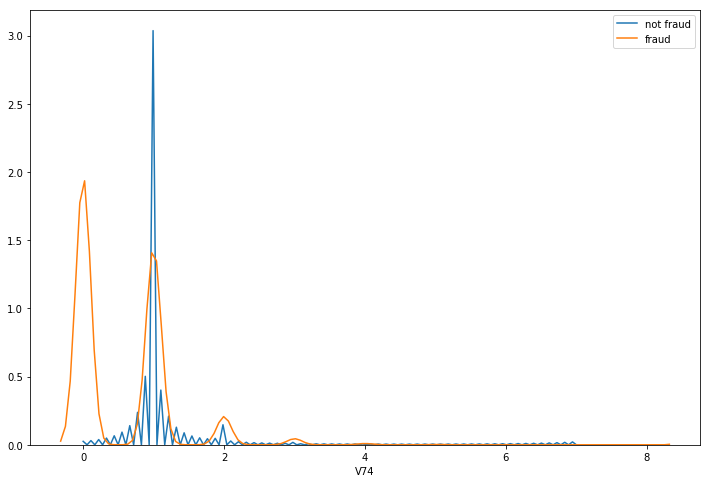

...

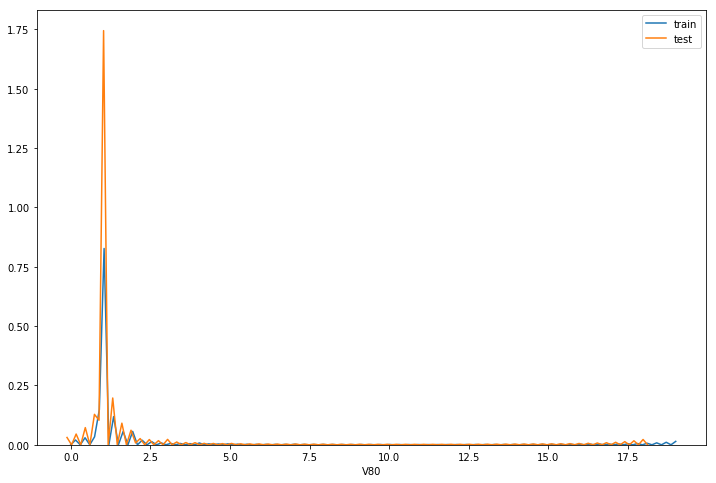

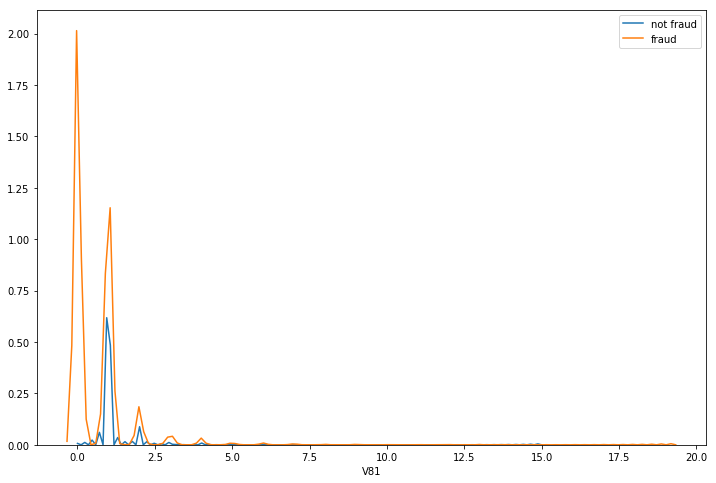

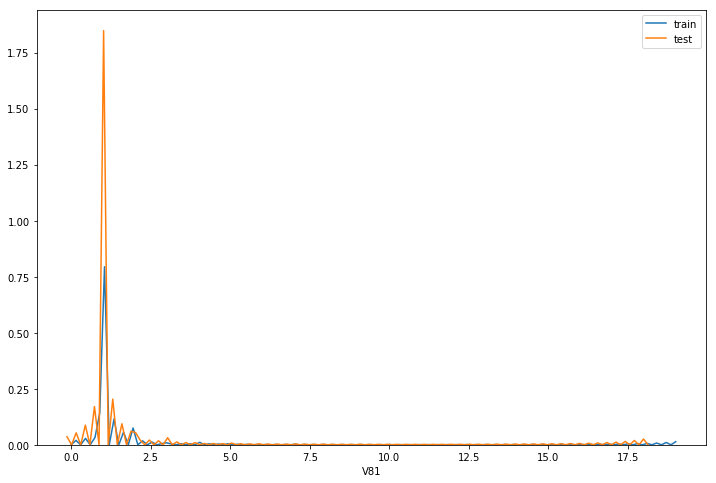

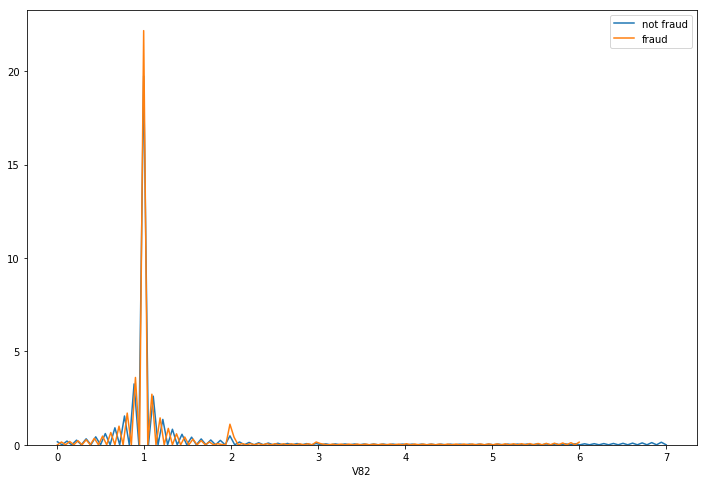

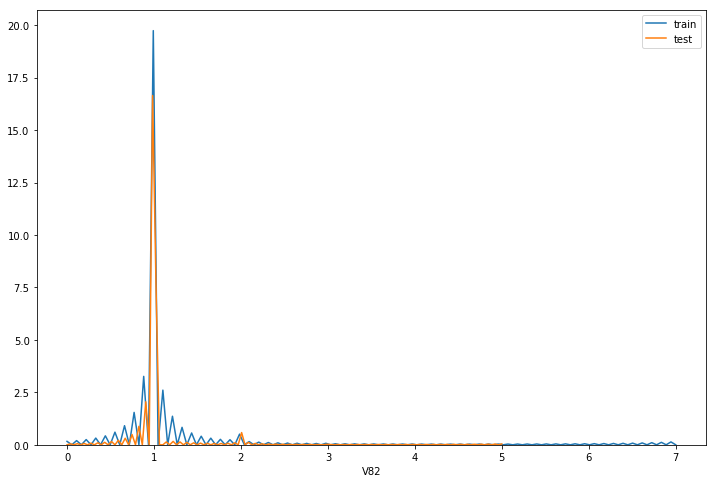

In [30]:
for feature in list(test)[110:120]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

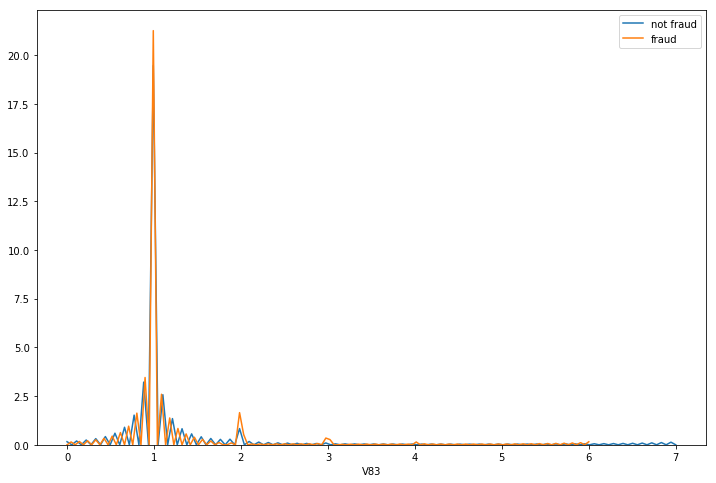

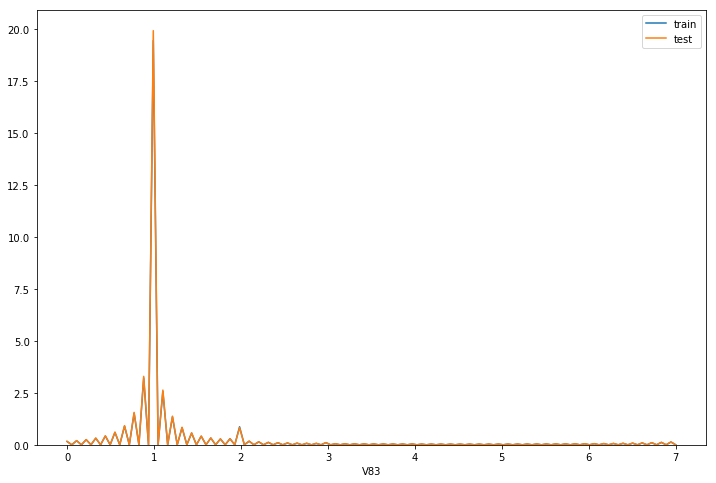

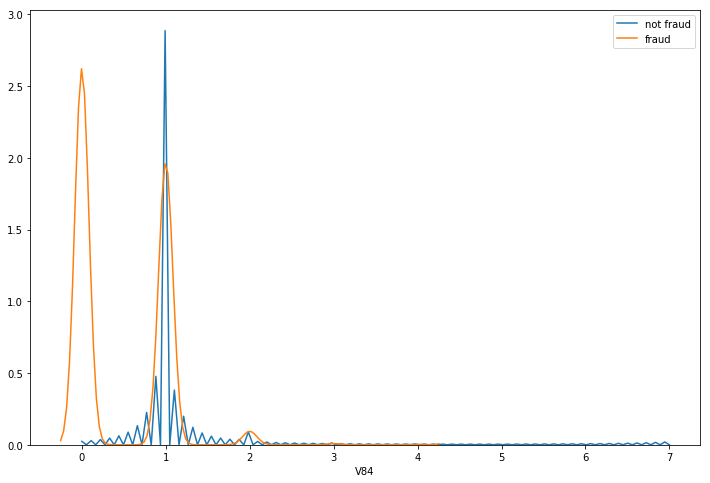

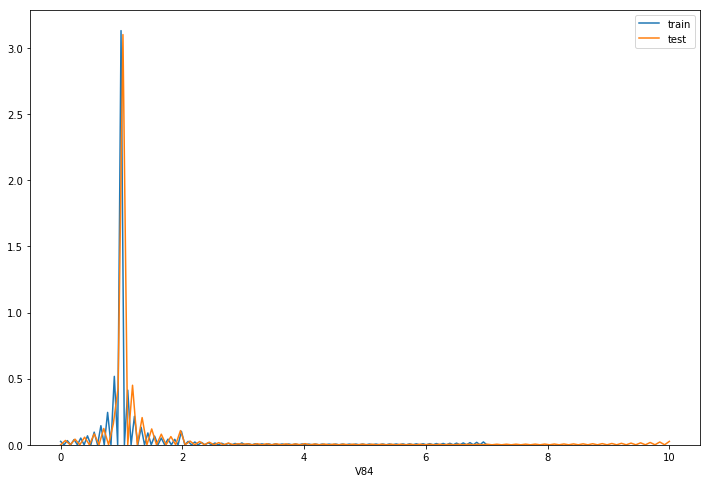

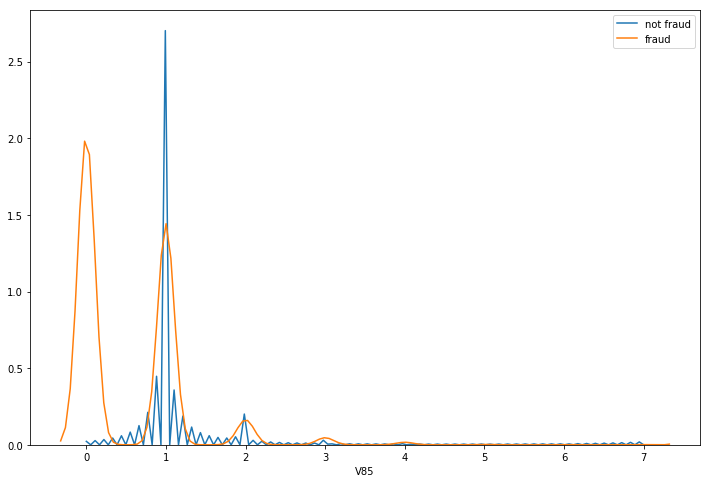

...

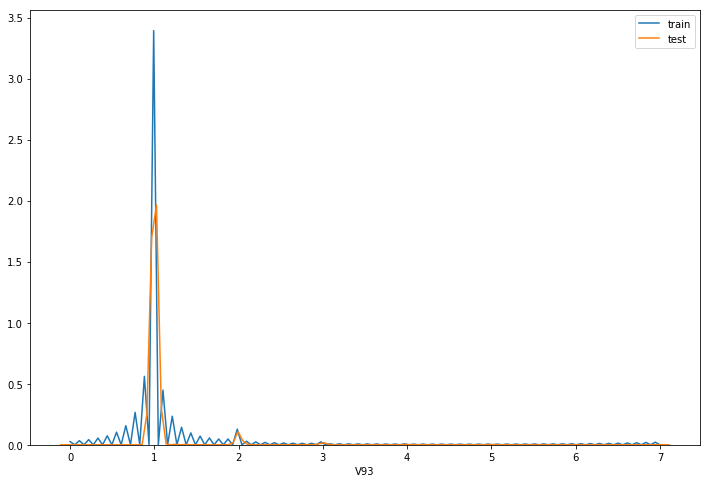

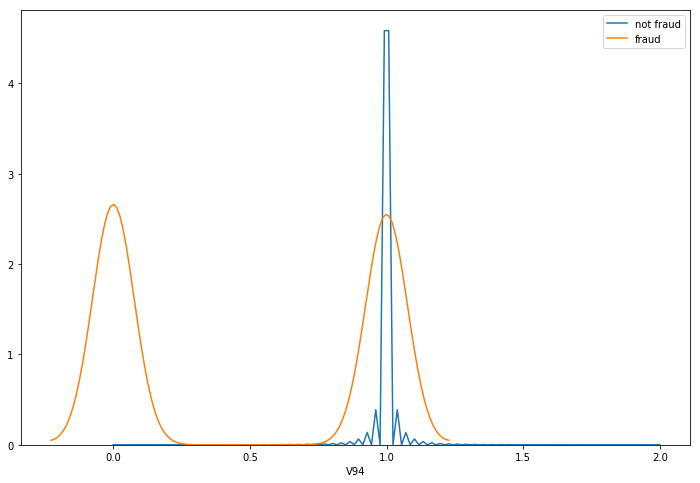

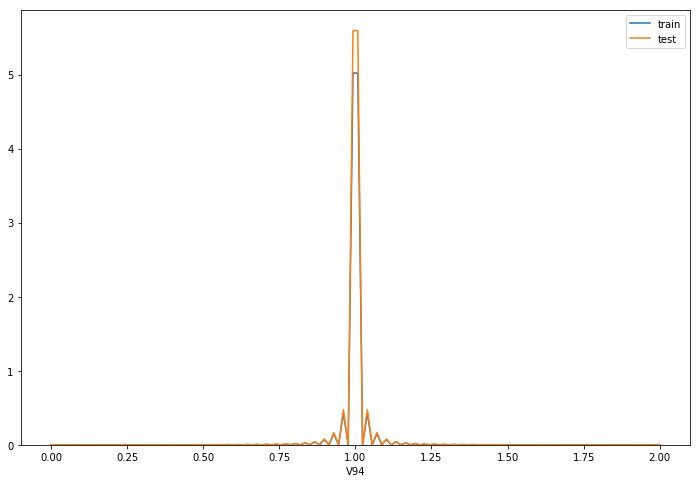

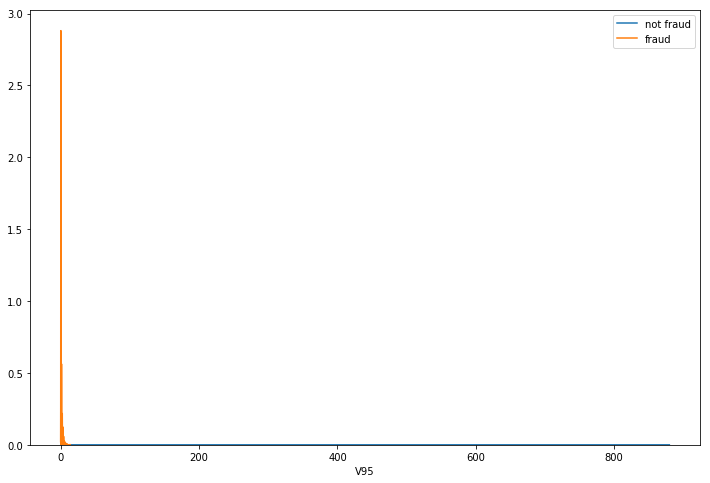

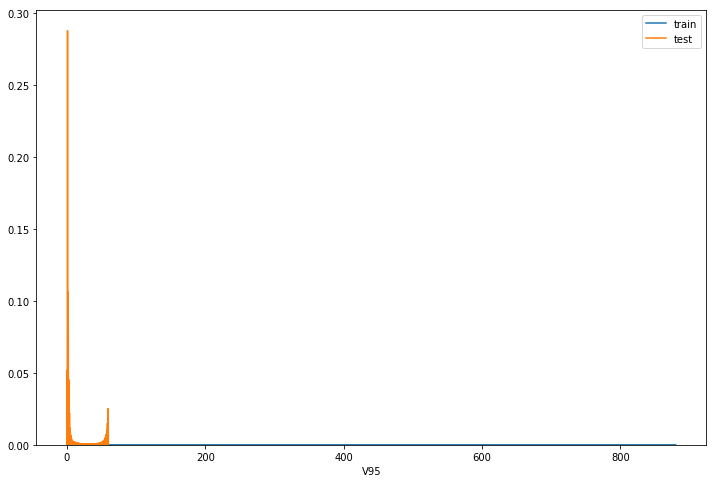

In [31]:
for feature in list(test)[120:130]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

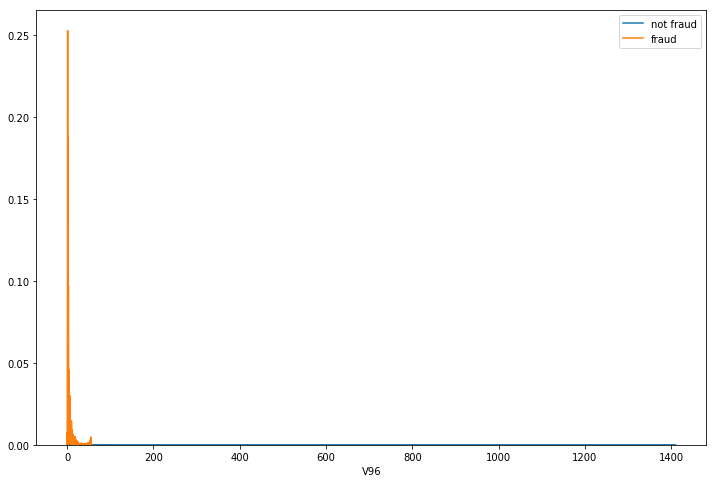

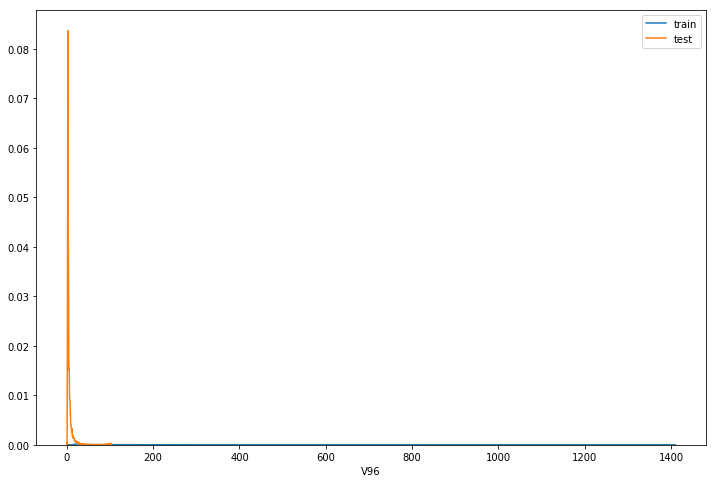

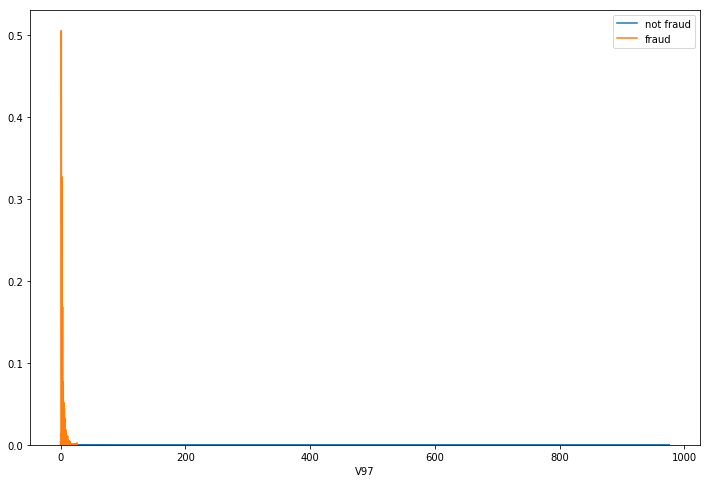

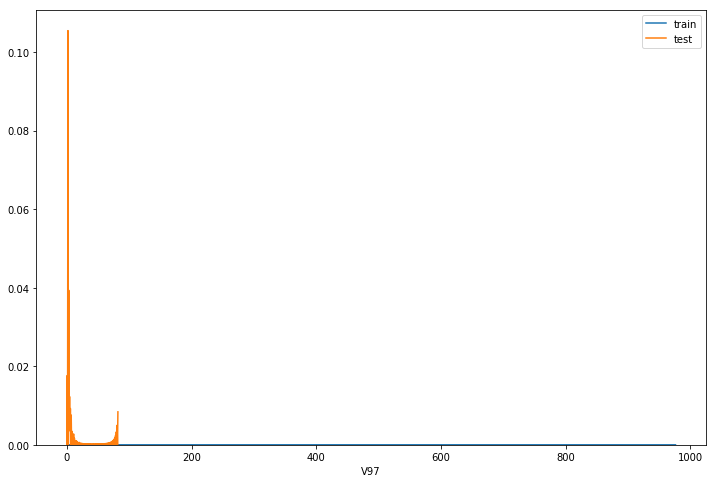

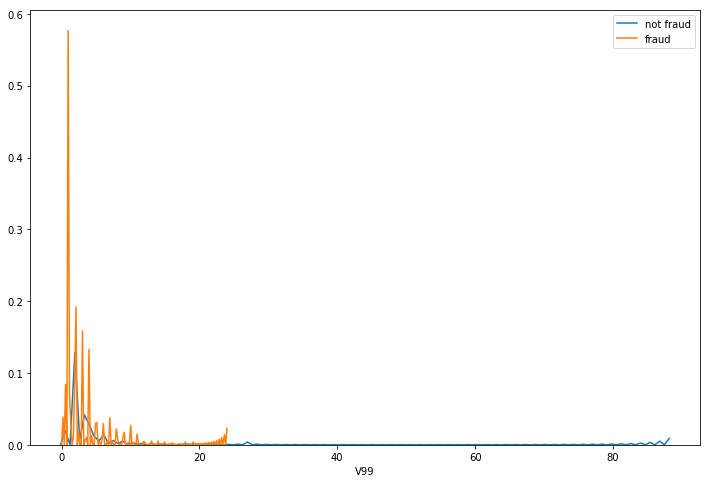

...

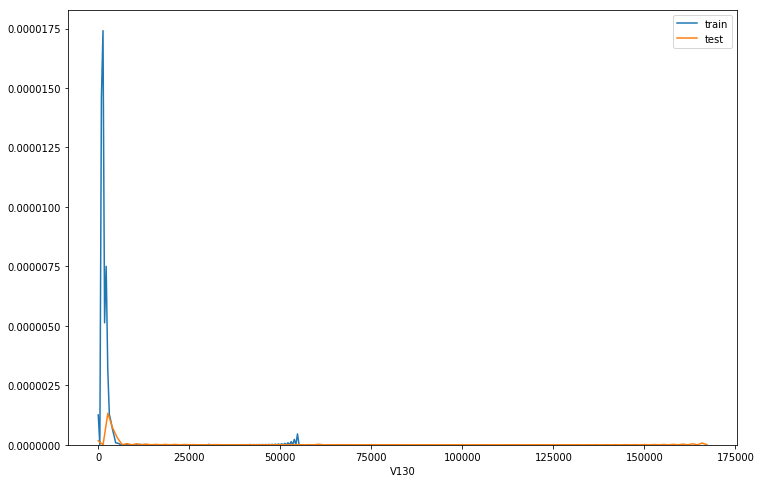

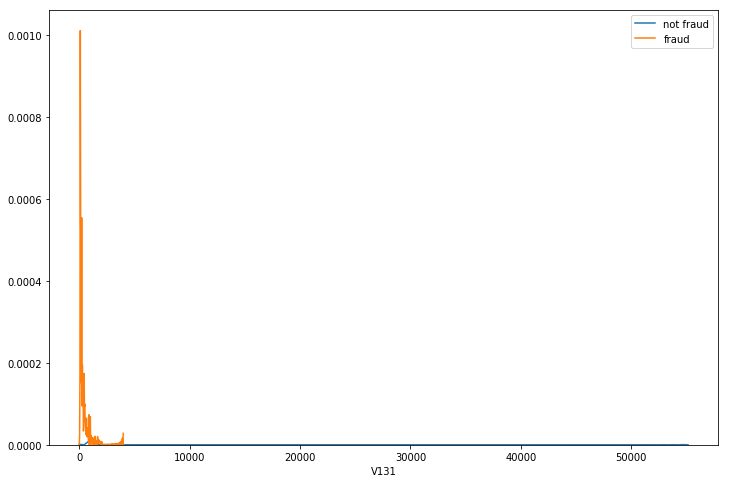

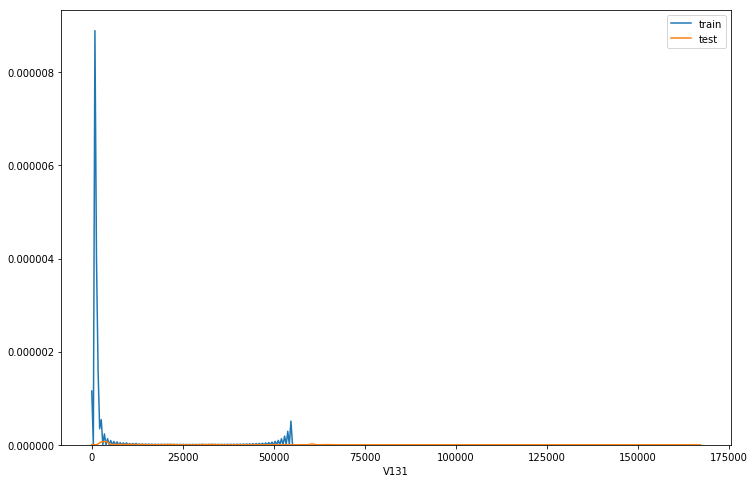

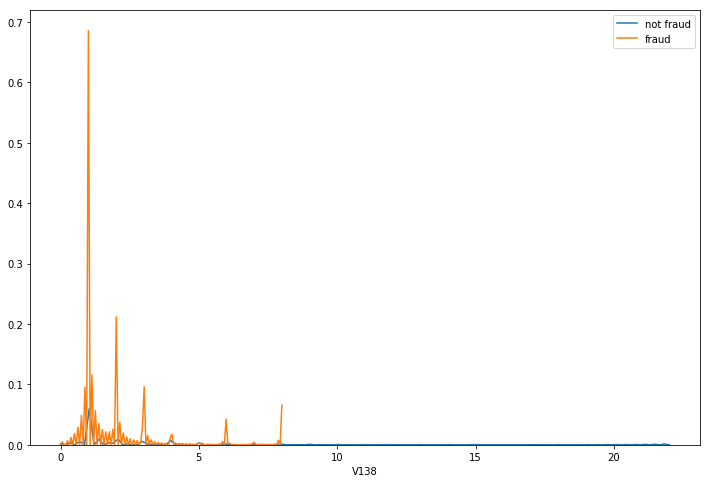

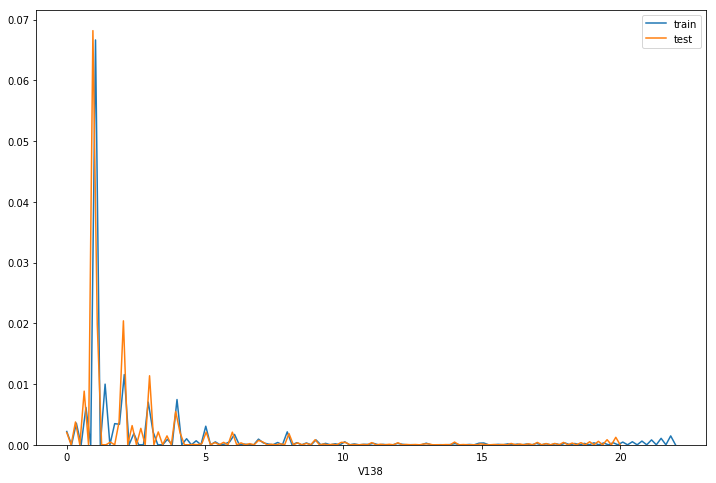

In [32]:
for feature in list(test)[130:140]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

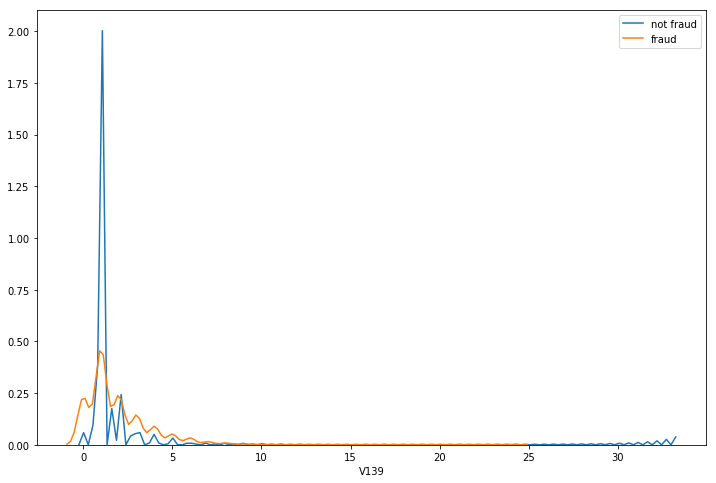

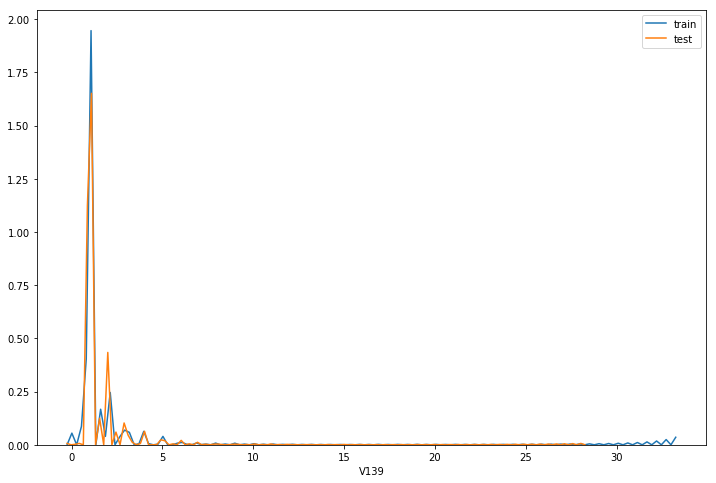

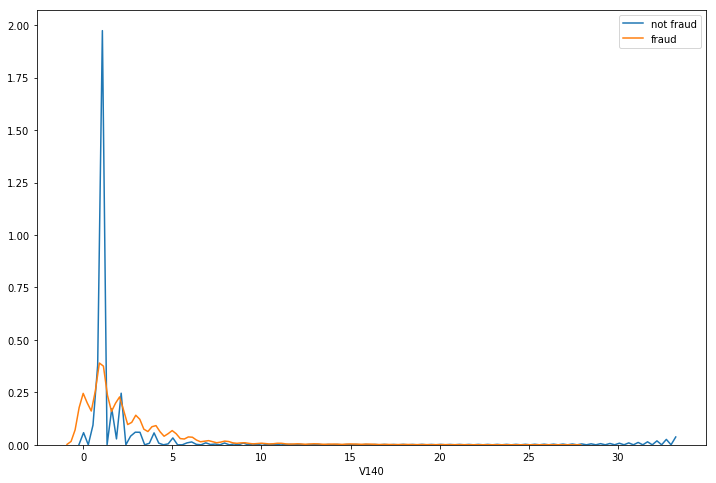

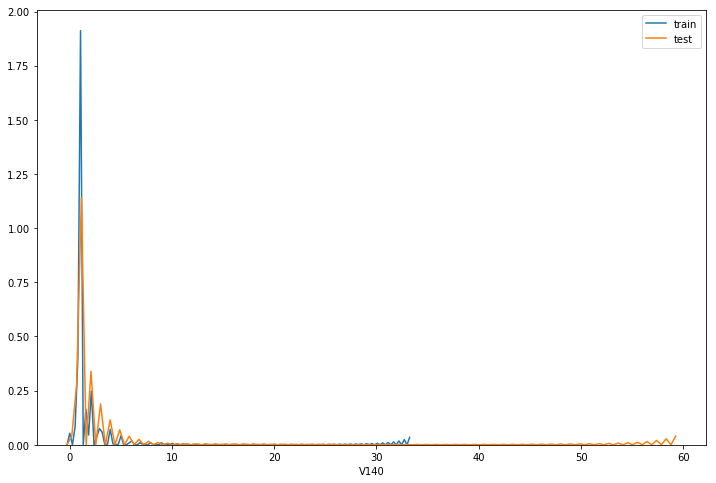

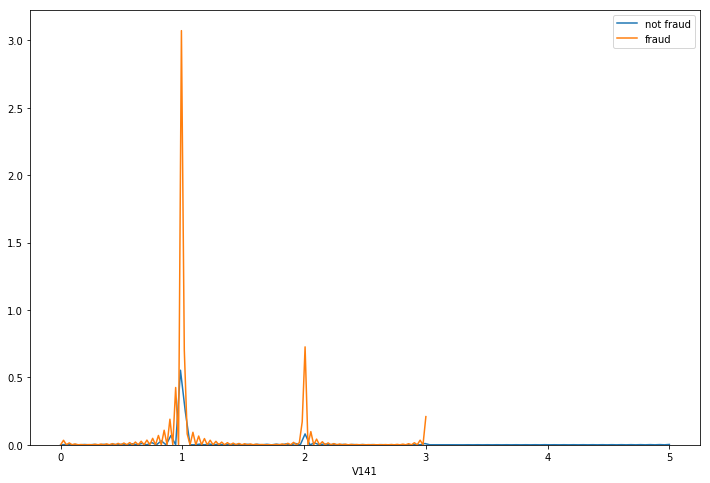

...

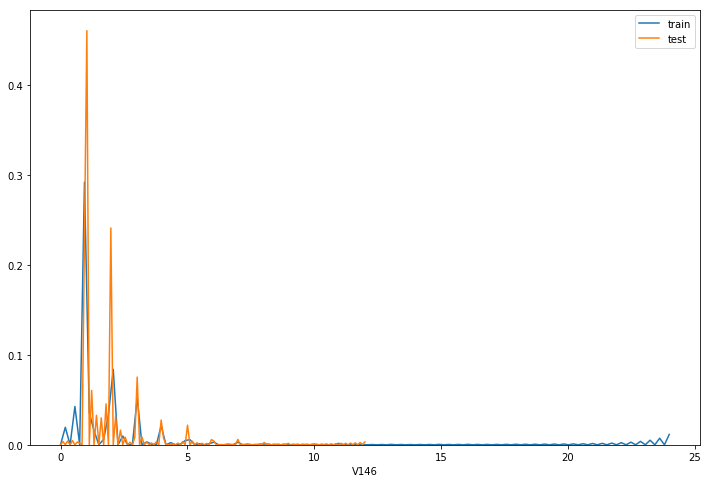

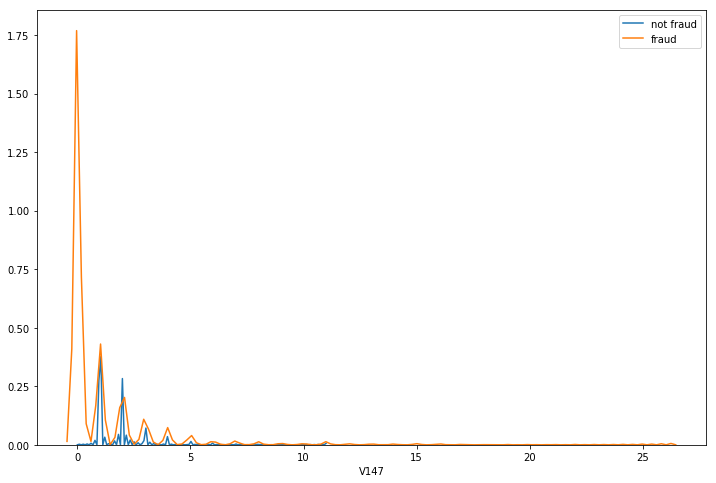

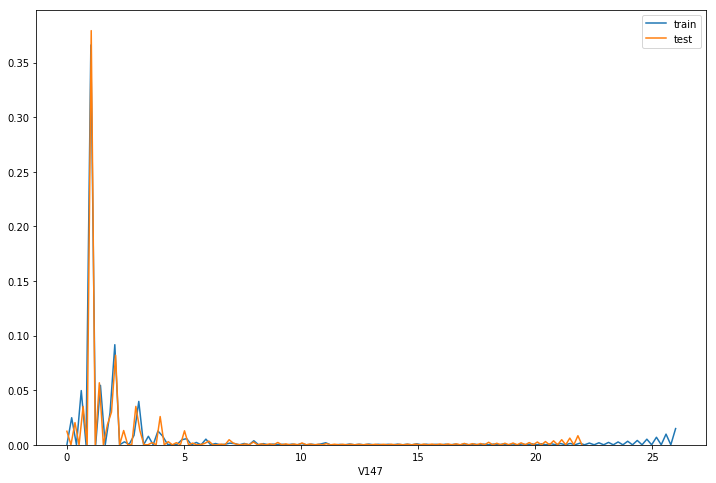

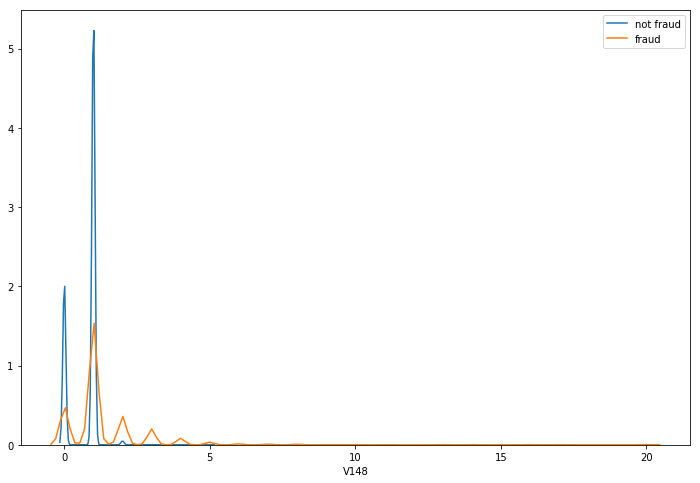

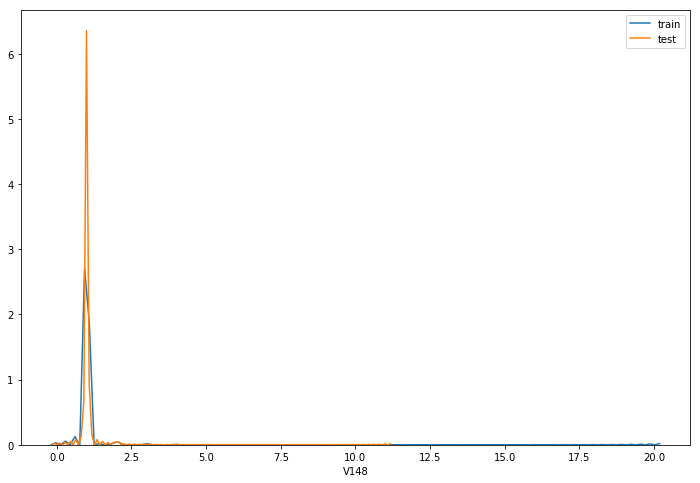

In [33]:
for feature in list(test)[140:150]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

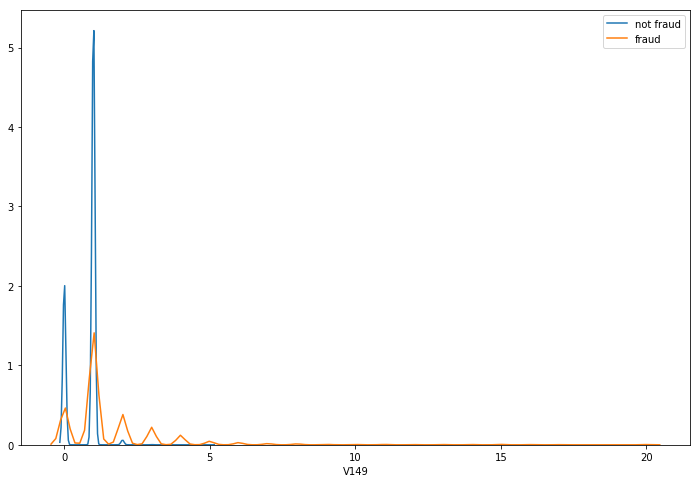

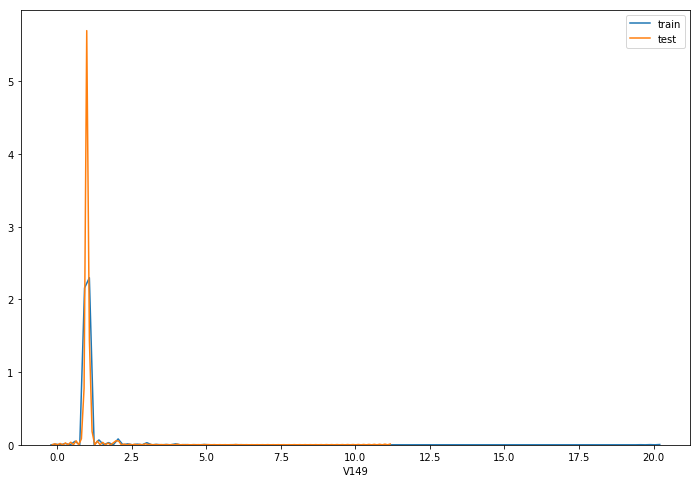

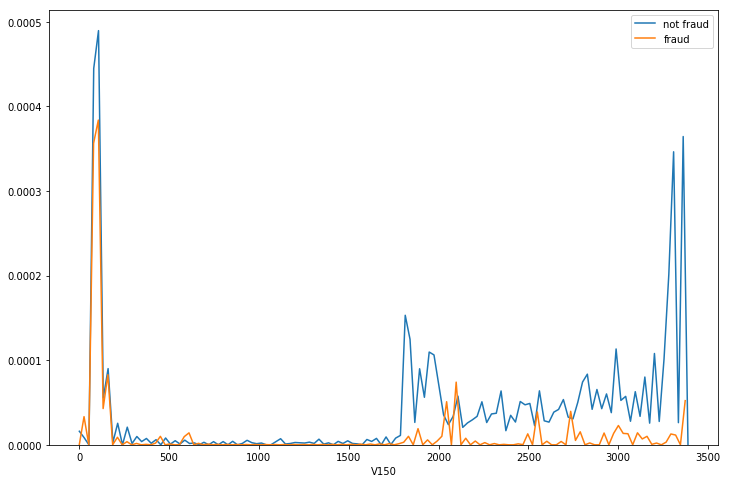

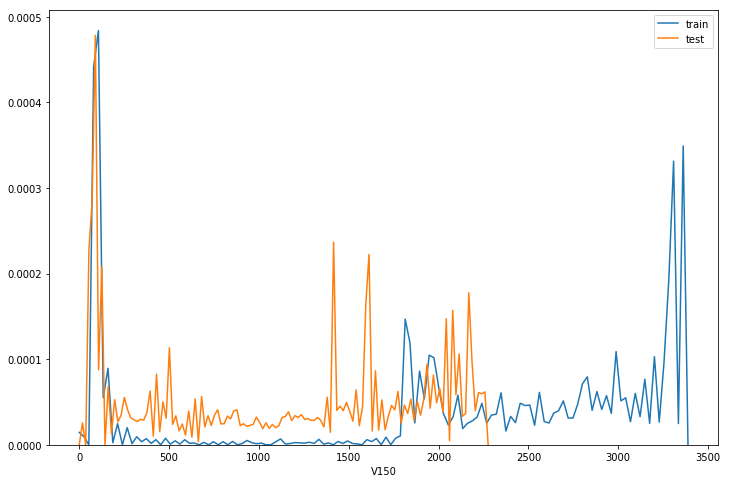

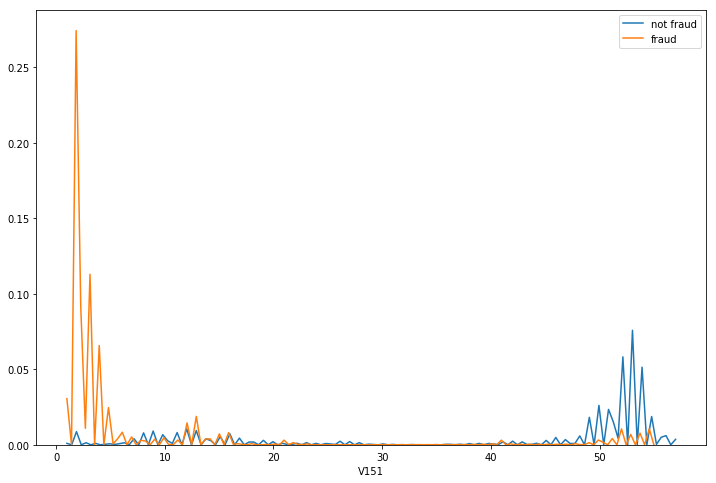

...

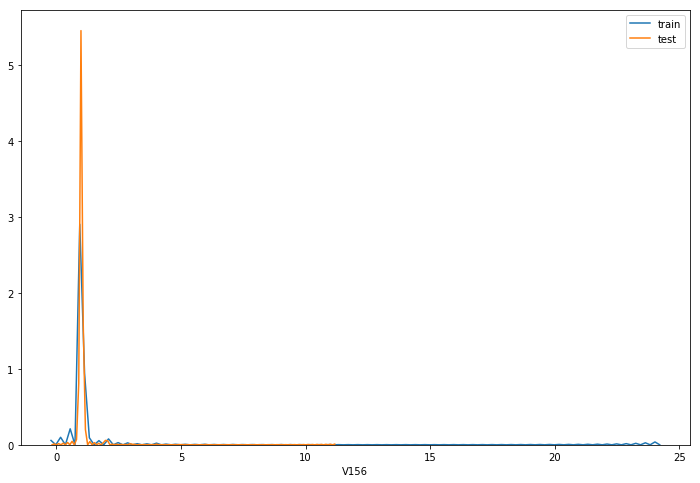

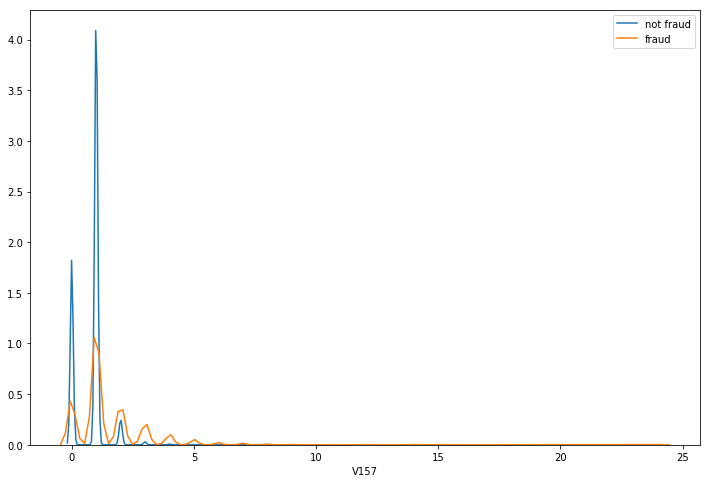

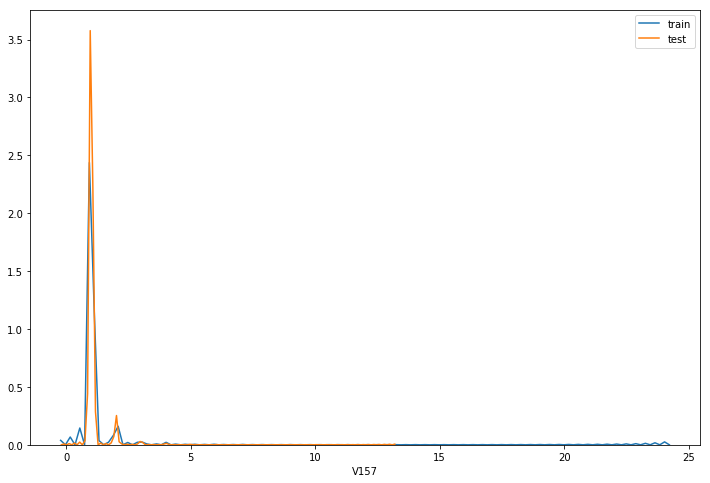

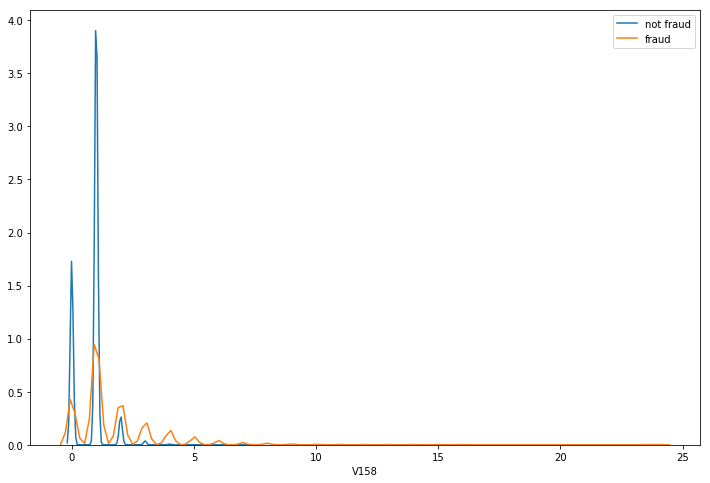

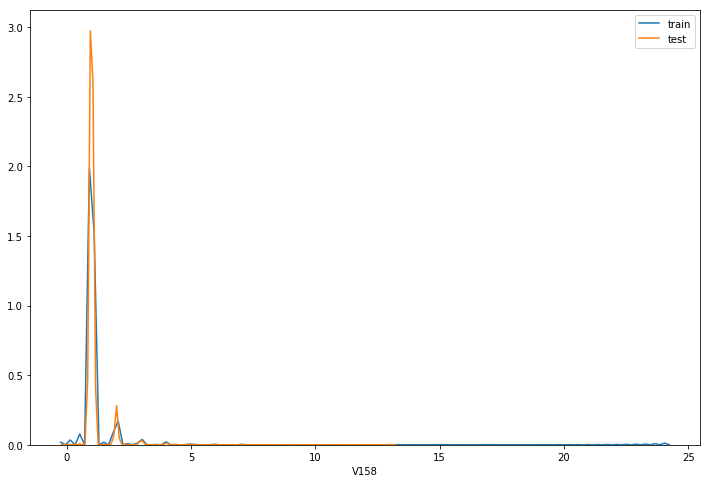

In [34]:
for feature in list(test)[150:160]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

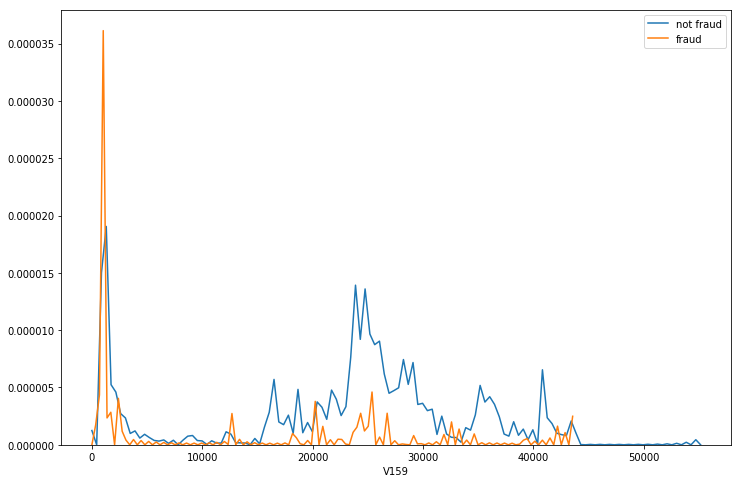

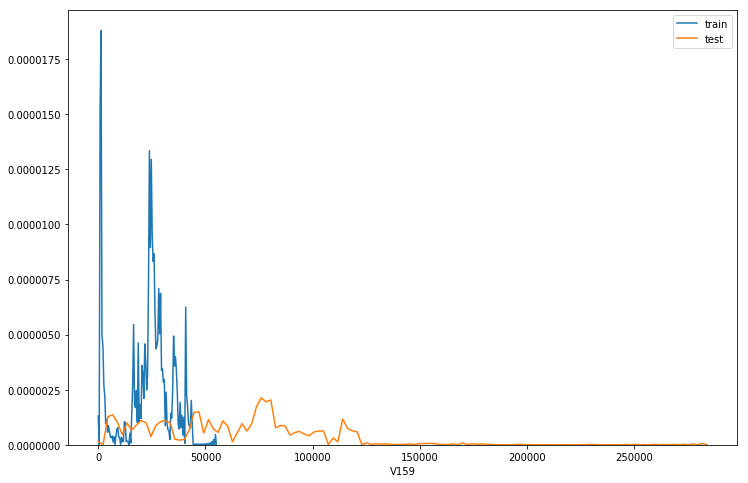

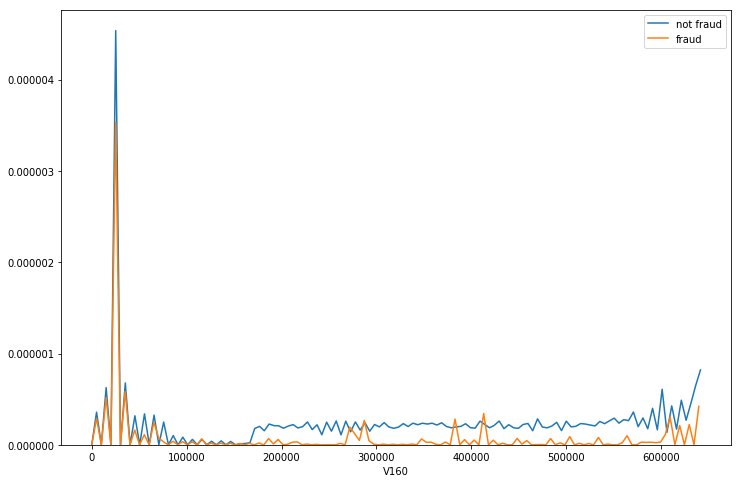

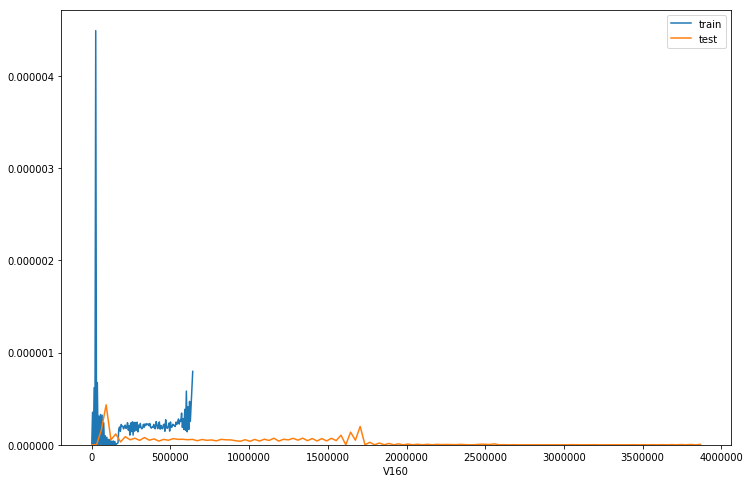

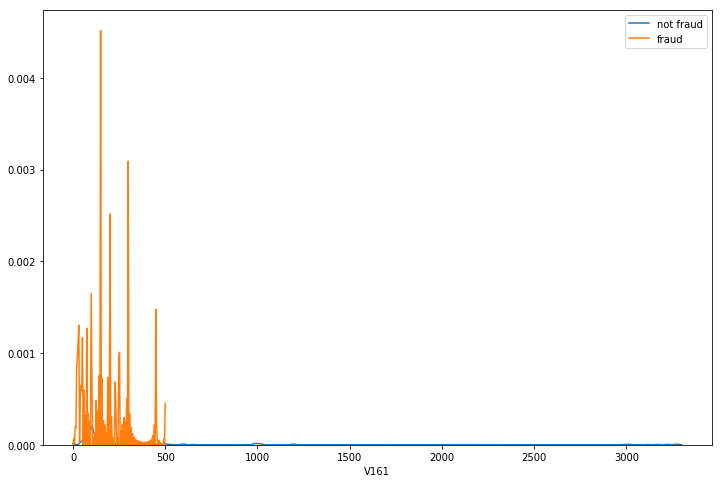

...

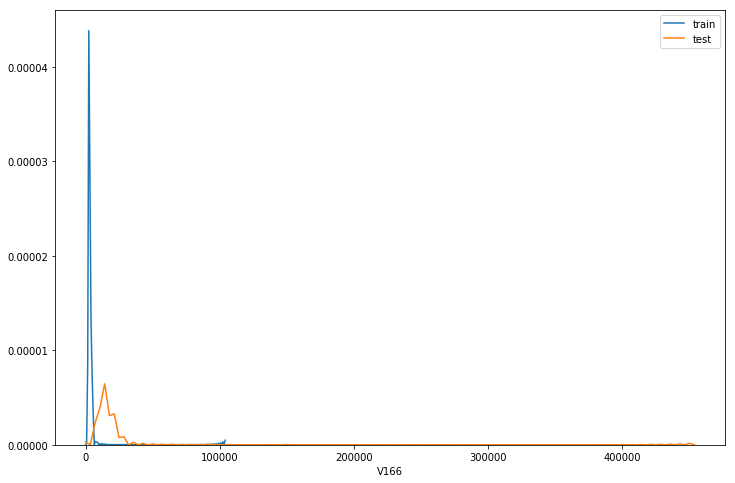

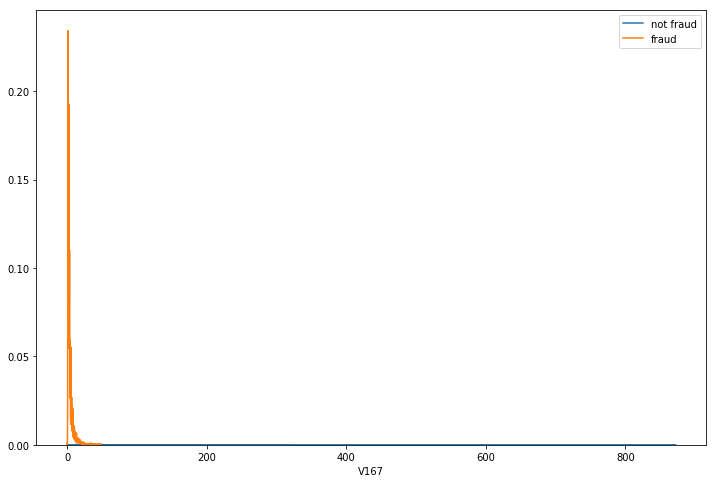

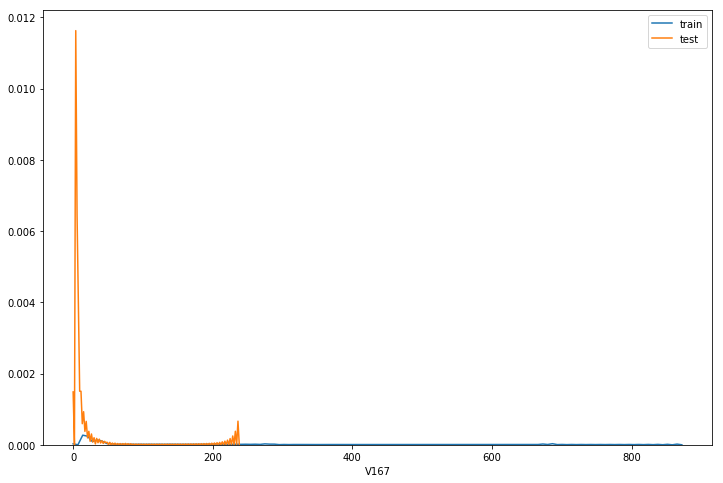

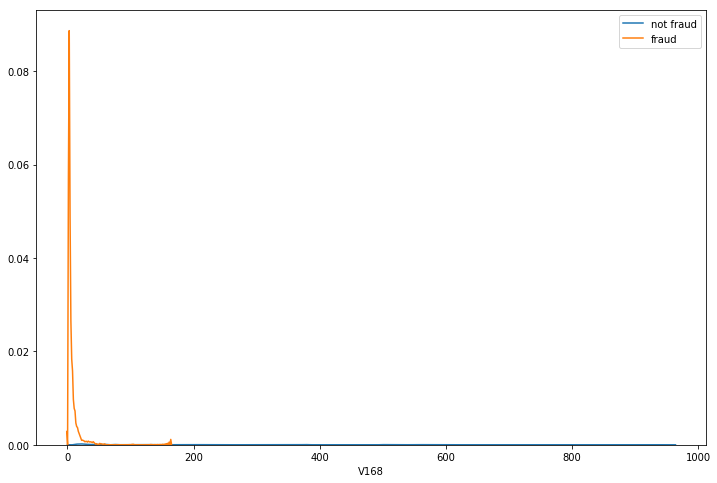

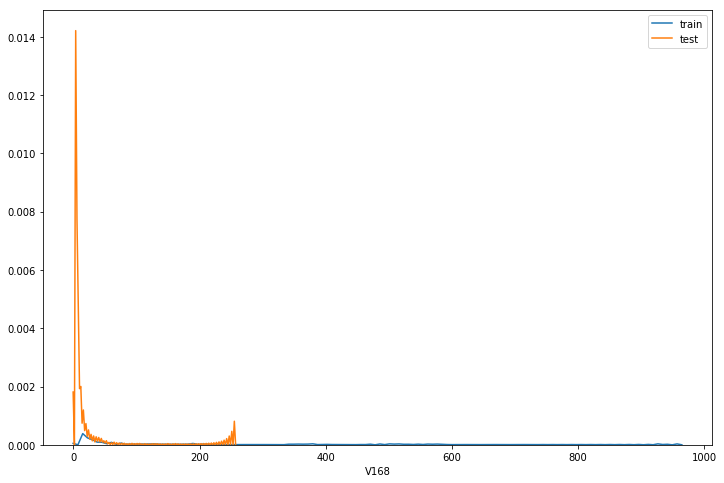

In [35]:
for feature in list(test)[160:170]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

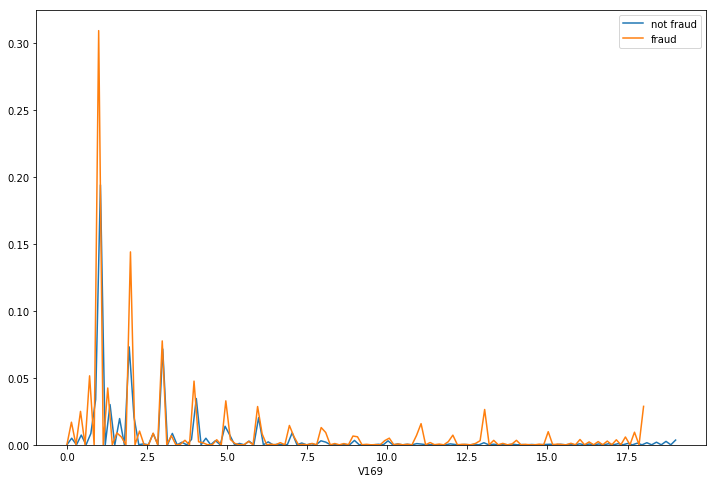

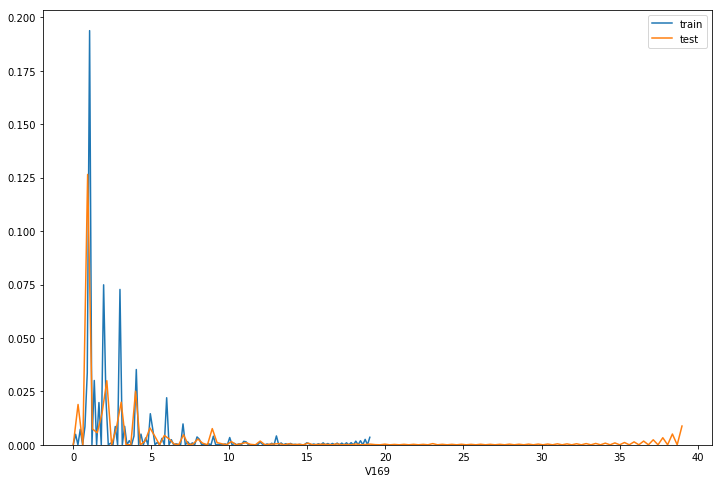

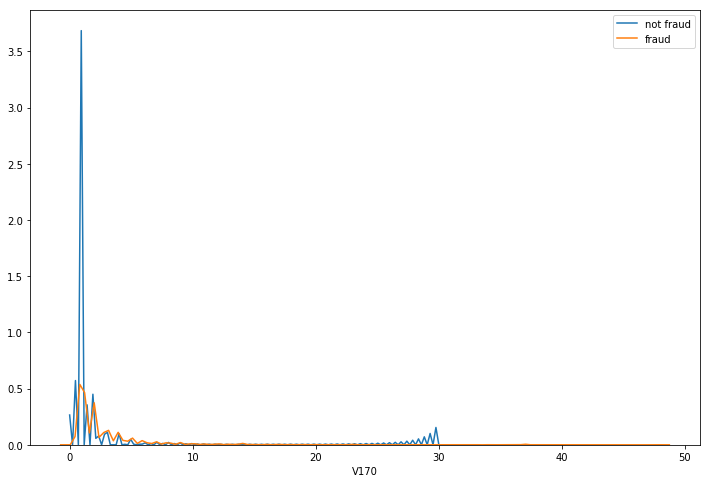

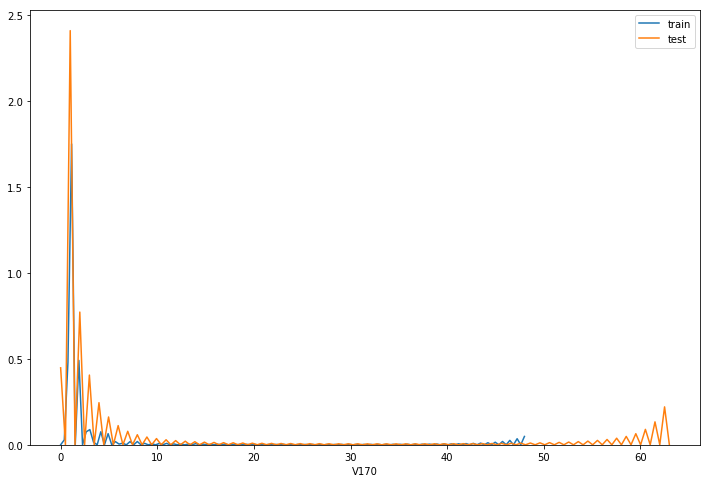

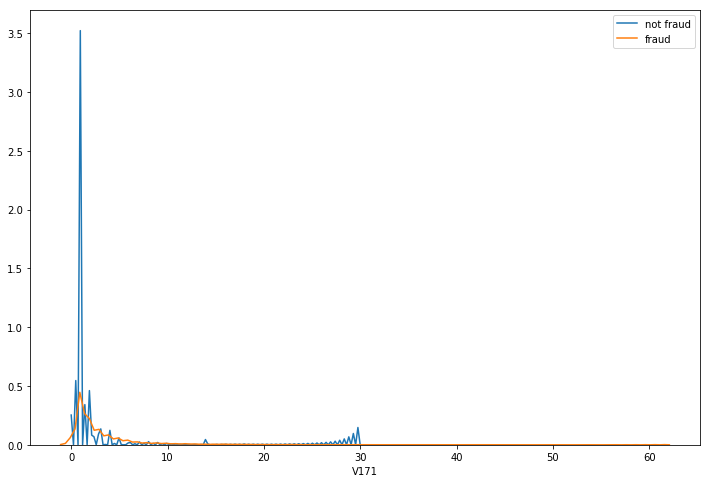

...

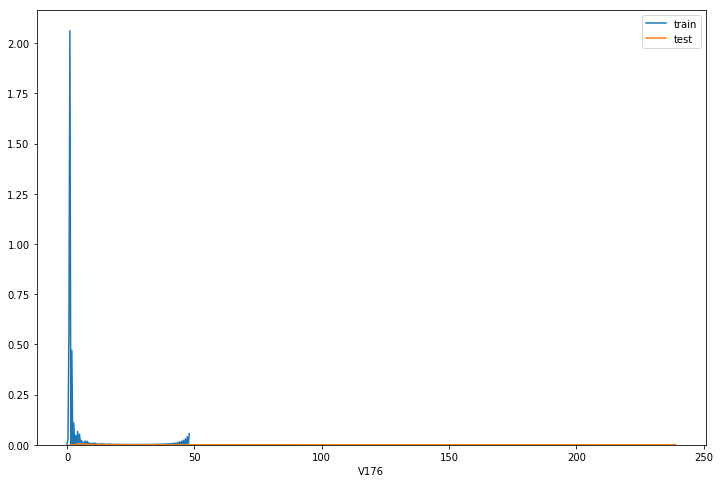

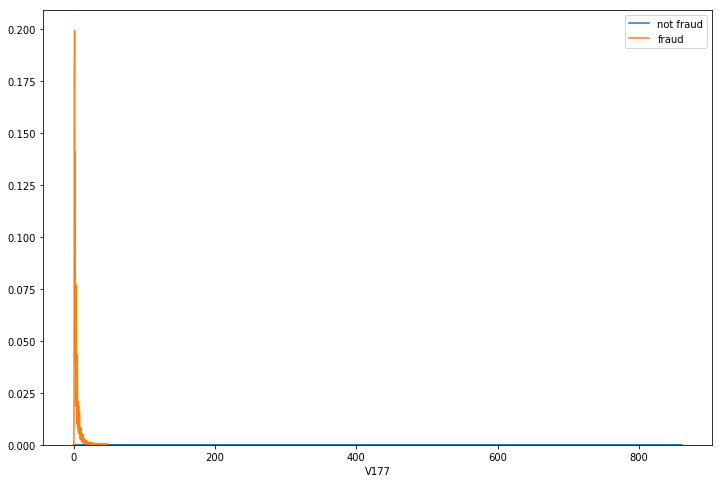

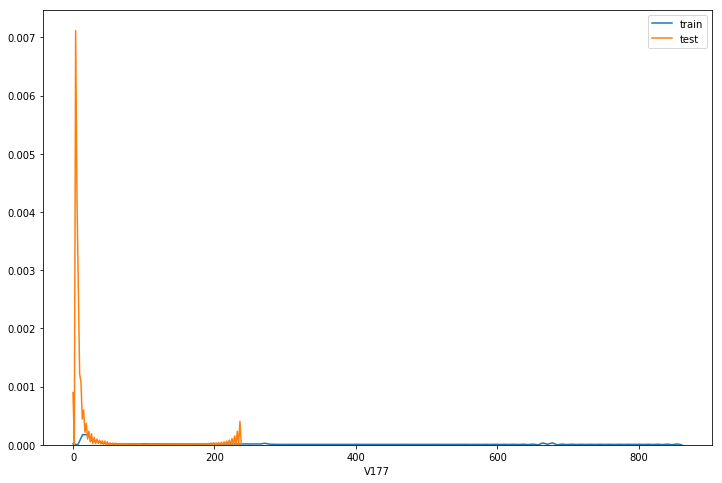

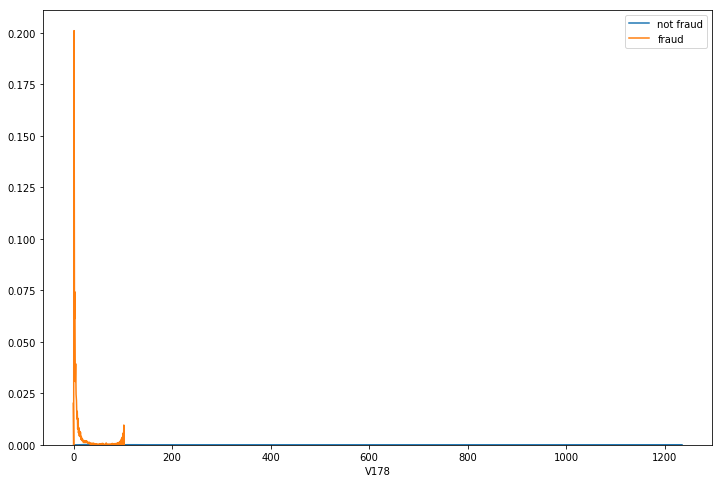

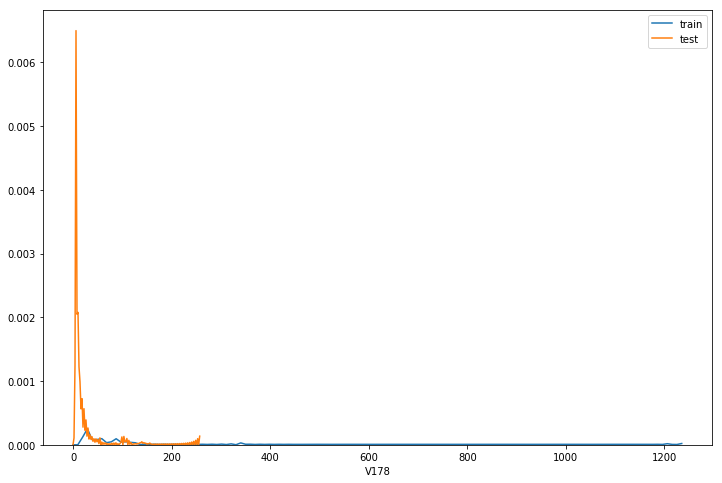

In [ ]:
for feature in list(test)[170:180]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [19]:
n = 180

In [ ]:
plt.figure(figsize=(12,8))
sns.distplot(train[(train[list(test)[n]].isna() == False)
                           & (train['isFraud'] == 0)][list(test)[n]],
             label = 'not fraud', hist=False)
sns.distplot(train[(train[list(test)[n]].isna() == False)
                           & (train['isFraud'] == 1)][list(test)[n]],
             label = 'fraud', hist=False)
plt.legend()

plt.figure(figsize=(12,8))
sns.distplot(train[(train[list(test)[n]].isna() == False)][list(test)[n]],
             label = 'train', hist=False)
sns.distplot(test[(test[list(test)[n]].isna() == False)][list(test)[n]],
             label = 'test', hist=False)
plt.legend()

In [1]:
for feature in list(test)[180:185]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

NameError: name 'test' is not defined

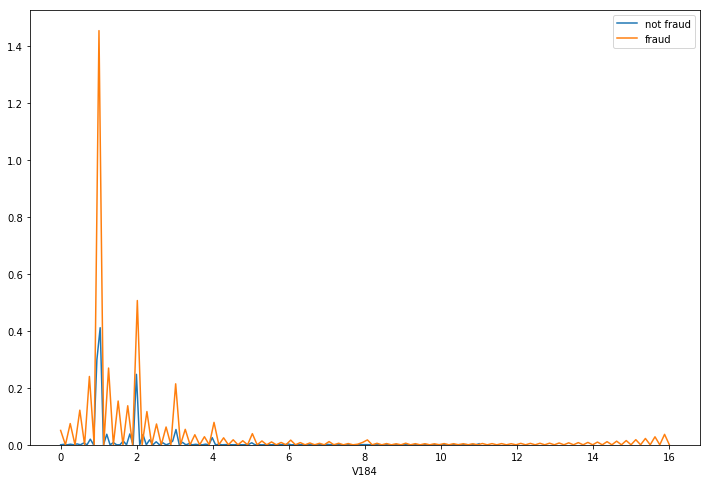

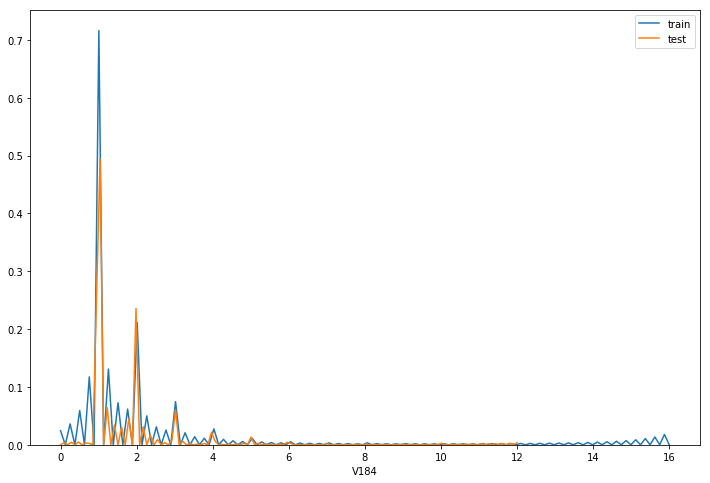

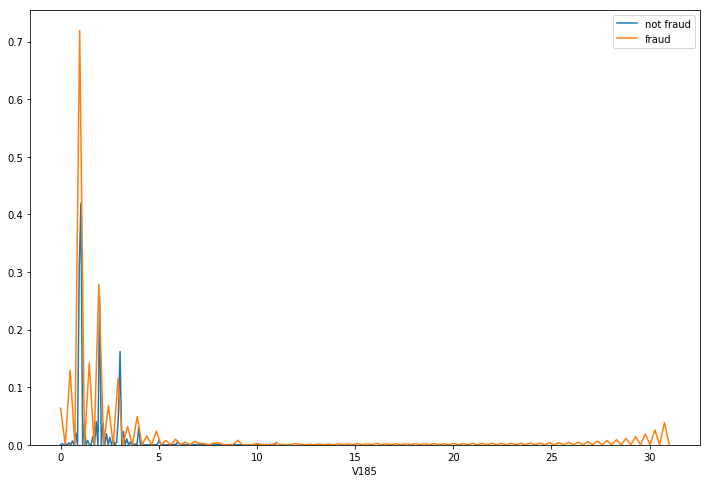

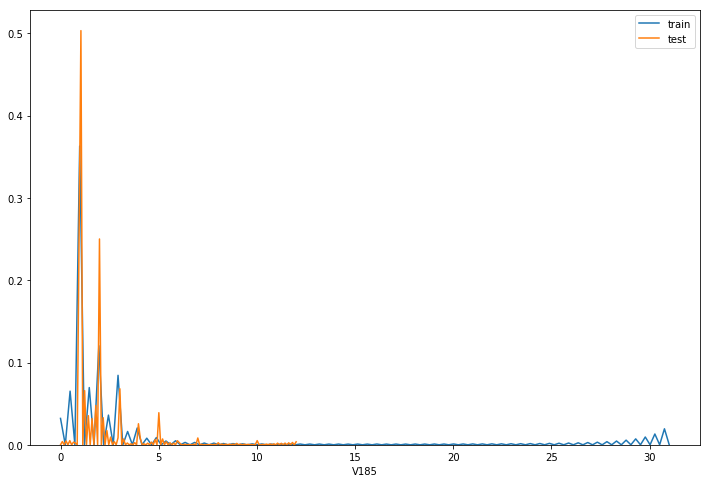

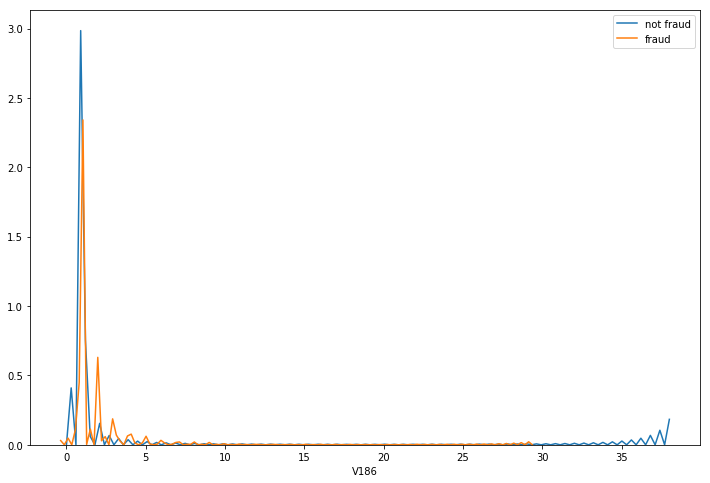

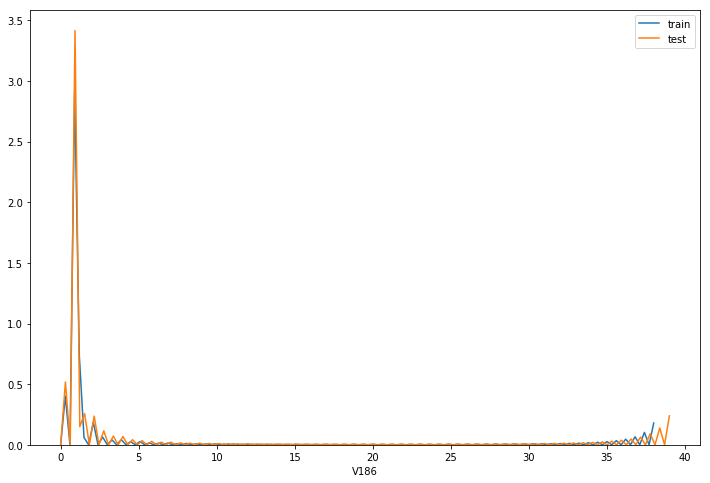

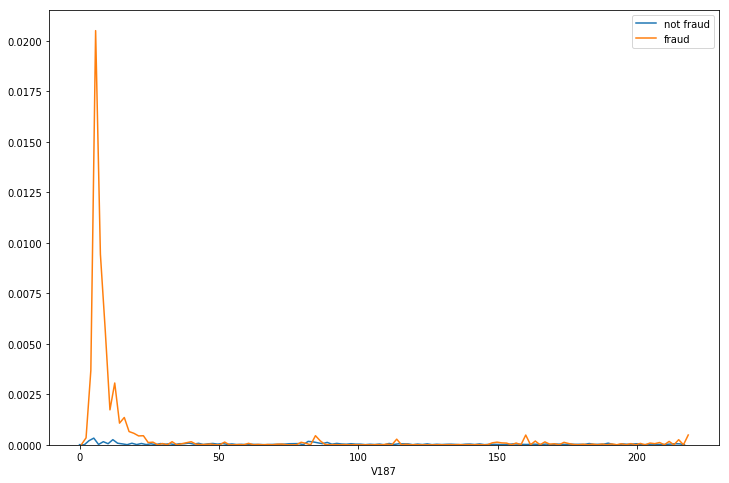

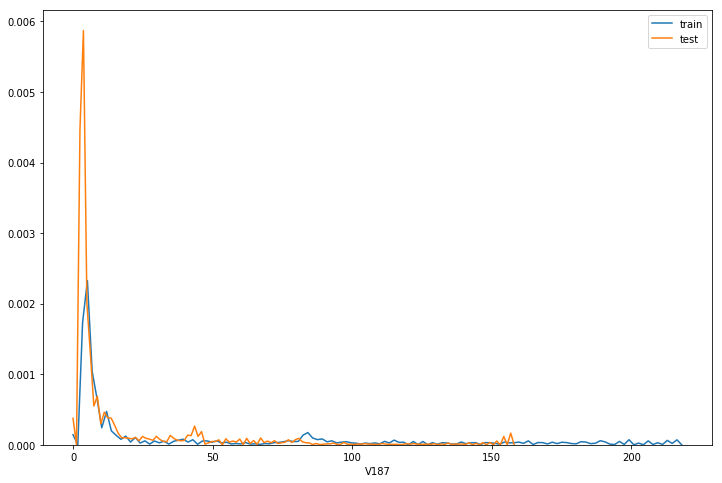

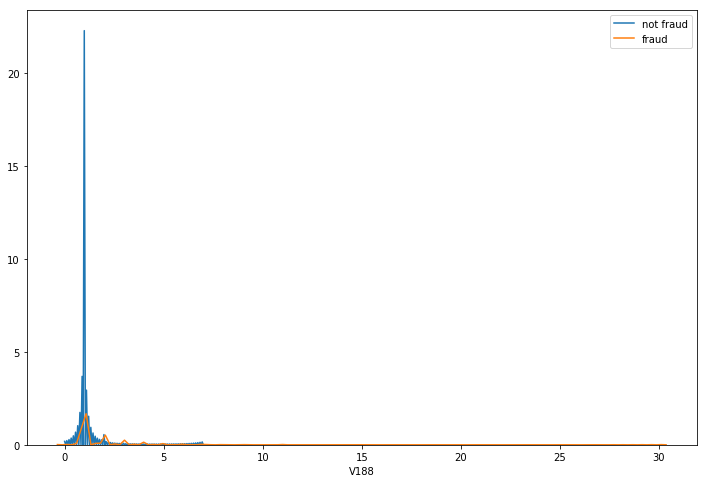

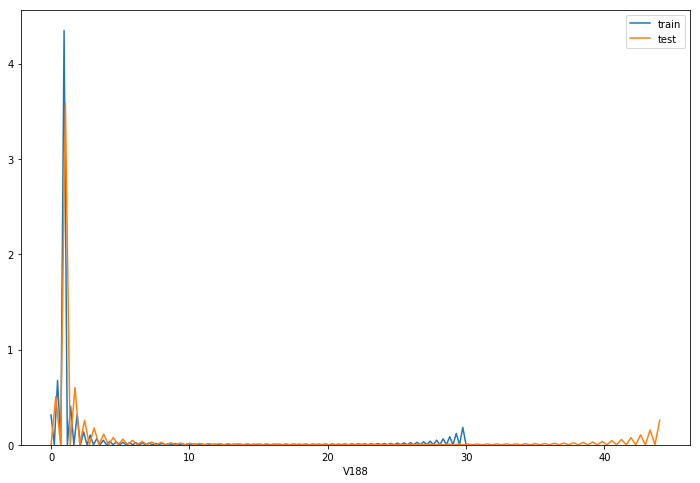

In [16]:
for feature in list(test)[185:190]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[190:195]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[195:200]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[200:210]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[210:220]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[220:230]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[230:240]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[240:250]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[250:260]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[260:270]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[270:280]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[280:290]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],

                 label = 'test', hist=False)
    plt.legend()

In [ ]:
for feature in list(test)[290:]:
    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 0)][feature],
                 label = 'not fraud', hist=False)
    sns.distplot(train[(train[feature].isna() == False)
                               & (train['isFraud'] == 1)][feature],
                 label = 'fraud', hist=False)
    plt.legend()

    plt.figure(figsize=(12,8))
    sns.distplot(train[(train[feature].isna() == False)][feature],
                 label = 'train', hist=False)
    sns.distplot(test[(test[feature].isna() == False)][feature],
                 label = 'test', hist=False)
    plt.legend()